# Week9: GAN

## 实验要求与基本流程

### 实验要求
1. 结合理论课内容，深入理解GAN(Generative Adversarial Networks,生成对抗网络)的原理与训练过程.了解GAN网络结构的演变过程与几个基本的GAN的原理(如DCGAN,wGAN等.)
2. 阅读实验指导书的实验内容,按照提示运行以及补充实验代码,或者简要回答问题.提交作业时,保留实验结果.


### 实验流程
* GAN的网络结构与训练
* DCGAN
* LSGAN
* WGAN
* WGAN-GP

## GAN(Generative Adversarial Networks)

让我们先来看一个只是用线性层的生成对抗网络(GAN),来简单了解一下GAN的基本网络结构与训练过程.

这个GAN网络结构分为两部分,生成器网络Generator和判别器网络Discriminator.
- 生成器Generator将随机生成的噪声z通过多个线性层生成图片,注意生成器的最后一层是Tanh,所以我们生成的图片的取值范围为\[-1,1\],同理,我们会将真实图片归一化(normalize)到\[-1,1\].
- 而判别器Discriminator是一个二分类器,通过多个线性层得到一个概率值来判别图片是"真实"或者是"生成"的,所以在Discriminator的最后是一个sigmoid,来得到图片是"真实"的概率.

在所有的网络结构中我们都使用了LeakyReLU作为激活函数,除了G与D的最后一层,同时,我们在层与层之间我们还加入了BatchNormalization.

In [1]:
import torch
import numpy as np
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
class Generator(nn.Module):
    def __init__(self, image_size=32, latent_dim=100, output_channel=1):
        """
        image_size: image with and height
        latent dim: the dimension of random noise z
        output_channel: the channel of generated image, for example, 1 for gray image, 3 for RGB image
        """
        super(Generator, self).__init__()
        self.latent_dim = latent_dim
        self.output_channel = output_channel
        self.image_size = image_size
        
        # Linear layer: latent_dim -> 128 -> 256 -> 512 -> 1024 -> output_channel * image_size * image_size -> Tanh
        self.model = nn.Sequential(
            nn.Linear(latent_dim, 128),
            nn.BatchNorm1d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(128, 256),
            nn.BatchNorm1d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 512),
            nn.BatchNorm1d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 1024),
            nn.BatchNorm1d(1024),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Linear(1024, output_channel * image_size * image_size),
            nn.Tanh()
        )

    def forward(self, z):
        img = self.model(z)
        img = img.view(img.size(0), self.output_channel, self.image_size, self.image_size)
        return img


class Discriminator(nn.Module):
    def __init__(self, image_size=32, input_channel=1):
        """
        image_size: image with and height
        input_channel: the channel of input image, for example, 1 for gray image, 3 for RGB image
        """
        super(Discriminator, self).__init__()
        self.image_size = image_size
        self.input_channel = input_channel
        
        # Linear layer: input_channel * image_size * image_size -> 1024 -> 512 -> 256 -> 1 -> Sigmoid
        self.model = nn.Sequential(
            nn.Linear(input_channel * image_size * image_size, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
            nn.Sigmoid(),
        )

    def forward(self, img):
        img_flat = img.view(img.size(0), -1)
        out = self.model(img_flat)
        return out

### 数据集
在训练我们的GAN网络之前, 先介绍一下本次实验可训练GAN的数据集,我们提供了两个数据集来供大家进行尝试数据集.
- MNIST手写体3类数据集,这里为了加快我们的训练速度,我们提供了一个简化版本的只包含数字0,2的2类MNIST数据集,每类各1000张.图片为28\*28的单通道灰度图(我们将其resize到32\*32),对于GAN而言,我们不需要测试集.我们本次实验主要使用该数据集作为主要的训练数据集.


- 室内家具数据集.为了加快我们的训练速度,我们将其做了删减处理,仅包含chair等一个类,共500张.图片为32\*32的3通道彩色图片.



下面是两个加载数据集的函数.注意我们将所有图片normalize到了\[-1,1\]之间.


In [3]:
def load_mnist_data():
    """
    load mnist(0,1,2) dataset 
    """
    
    transform = torchvision.transforms.Compose([
        # transform to 1-channel gray image since we reading image in RGB mode
        transforms.Grayscale(1),
        # resize image from 28 * 28 to 32 * 32
        transforms.Resize(32),
        transforms.ToTensor(),
        # normalize with mean=0.5 std=0.5
        transforms.Normalize(mean=(0.5, ), 
                             std=(0.5, ))
        ])
    
    train_dataset = torchvision.datasets.ImageFolder(root='./data/mnist', transform=transform)
    
    return train_dataset

def load_furniture_data():
    """
    load furniture dataset 
    """
    transform = torchvision.transforms.Compose([
        transforms.ToTensor(),
        # normalize with mean=0.5 std=0.5
        transforms.Normalize(mean=(0.5, 0.5, 0.5), 
                             std=(0.5, 0.5, 0.5))
        ])
    train_dataset = torchvision.datasets.ImageFolder(root='./data/household_furniture', transform=transform)
    return train_dataset

(*无需阅读理解*)运行下面2个cell的代码来查看两个数据集中的20张随机真实图片.

In [4]:
def denorm(x):
    # denormalize
    out = (x + 1) / 2
    return out.clamp(0, 1)

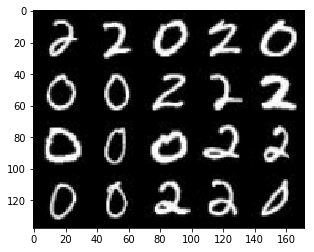

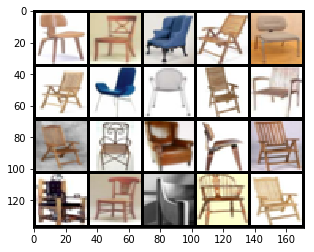

In [10]:
from utils import show
"""
you can pass code in this cell
"""
# show mnist real data
train_dataset = load_mnist_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=20, shuffle=True)
show(torchvision.utils.make_grid(denorm(next(iter(trainloader))[0]), nrow=5))
# show furniture real data
train_dataset = load_furniture_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=20, shuffle=True)
show(torchvision.utils.make_grid(denorm(next(iter(trainloader))[0]), nrow=5))

下面代码实现GAN在一个epoch内的训练过程.

大体而言,GAN的训练过程分为两步,首先将随机噪声z喂给G,生成图片,然后将真实图片和G生成的图片喂给D,然后使用对应的loss函数反向传播优化D.然后再次使用G生成图片,并喂给D,并使用对应的loss函数反向传播优化G.

下面的图片是普通的GAN在G和D上的优化目标:
![gan_d](./pictures/gan_d.png)
![gan_g](./pictures/gan_g.png)
值得注意的是,上述图片描述的是G和D的**优化目标**,而在具体实现过程中,我们实现loss函数来达到优化目标.对于上图中D与G的优化目标我们可以使用Binary Cross Entroy损失函数来实现:
$$
BCEloss(p_i,y_i)= -(y_i\log{p_i}+(1−y_i)\log{(1−p_i)})
$$
$p_i$, $y_i$分别是模型的预测值与图片的真实标签(1为真,0为假).因此,对于D,最大化其优化目标可以通过最小化一个BCEloss来实现,其真实图片$x\sim{P_r}$的标签设置为1,而生成图片$z\sim{P(z)}$的标签设置为0.我们可以看到这样的损失函数相当于对D的优化目标加上负号.

而对于G,也通过最小化一个BCEloss来实现,即将生成图片$z\sim{P(z)}$的标签设置为1即可,我们可以看到这样的损失函数与其优化目标是一致的.

In [11]:
def train(trainloader, G, D, G_optimizer, D_optimizer, loss_func, device, z_dim):
    """
    train a GAN with model G and D in one epoch
    Args:
        trainloader: data loader to train
        G: model Generator
        D: model Discriminator
        G_optimizer: optimizer of G(etc. Adam, SGD)
        D_optimizer: optimizer of D(etc. Adam, SGD)
        loss_func: loss function to train G and D. For example, Binary Cross Entropy(BCE) loss function
        device: cpu or cuda device
        z_dim: the dimension of random noise z
    """
    # set train mode
    D.train()
    G.train()
    
    D_total_loss = 0
    G_total_loss = 0
    
    
    for i, (x, _) in enumerate(trainloader):
        # real label and fake label
        y_real = torch.ones(x.size(0), 1).to(device)
        y_fake = torch.zeros(x.size(0), 1).to(device)
        
        x = x.to(device)
        z = torch.rand(x.size(0), z_dim).to(device)

        # update D network
        # D optimizer zero grads
        D_optimizer.zero_grad()
        
        # D real loss from real images
        d_real = D(x)
        d_real_loss = loss_func(d_real, y_real)
        
        # D fake loss from fake images generated by G
        g_z = G(z)
        d_fake = D(g_z)
        d_fake_loss = loss_func(d_fake, y_fake)
        
        # D backward and step
        d_loss = d_real_loss + d_fake_loss
        d_loss.backward()
        D_optimizer.step()

        # update G network
        # G optimizer zero grads
        G_optimizer.zero_grad()
        
        # G loss
        g_z = G(z)
        d_fake = D(g_z)
        g_loss = loss_func(d_fake, y_real)
        
        # G backward and step
        g_loss.backward()
        G_optimizer.step()
        
        D_total_loss += d_loss.item()
        G_total_loss += g_loss.item()
    
    return D_total_loss / len(trainloader), G_total_loss / len(trainloader)

当模型训练后,我们需要查看此时G生成的图片效果,下面的visualize_results代码便实现了这块内容.注意,我们生成的图片都在\[-1,1\],因此,我们需要将图片反向归一化(denorm)到\[0,1\].

In [12]:
def visualize_results(G, device, z_dim, result_size=20):
    G.eval()
    
    z = torch.rand(result_size, z_dim).to(device)
    g_z = G(z)
    
    show(torchvision.utils.make_grid(denorm(g_z.detach().cpu()), nrow=5))

万事具备,接下来让我们来尝试这训练一个基本的GAN网络吧.这里实现run_gan函数来调用train以及visualize_results来训练我们的GAN.

In [13]:
def run_gan(trainloader, G, D, G_optimizer, D_optimizer, loss_func, n_epochs, device, latent_dim):
    d_loss_hist = []
    g_loss_hist = []

    for epoch in range(n_epochs):
        d_loss, g_loss = train(trainloader, G, D, G_optimizer, D_optimizer, loss_func, device, 
                               z_dim=latent_dim)
        print('Epoch {}: Train D loss: {:.4f}, G loss: {:.4f}'.format(epoch, d_loss, g_loss))

        d_loss_hist.append(d_loss)
        g_loss_hist.append(g_loss)

        if epoch == 0 or (epoch + 1) % 10 == 0:
            visualize_results(G, device, latent_dim) 
    
    return d_loss_hist, g_loss_hist

设置好超参数就可以开始训练!让我们尝试用它来训练2类的mnist数据集

In [14]:
# hyper params

# z dim
latent_dim = 100

# image size and channel
image_size=32
image_channel=1

# Adam lr and betas
learning_rate = 0.0002
betas = (0.5, 0.999)

# epochs and batch size
n_epochs = 100
batch_size = 32

# device : cpu or cuda:0/1/2/3
device = torch.device('cuda:0')

# mnist dataset and dataloader
train_dataset = load_mnist_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# use BCELoss as loss function
bceloss = nn.BCELoss().to(device)

# G and D model
G = Generator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = Discriminator(image_size=image_size, input_channel=image_channel).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

Epoch 0: Train D loss: 1.1729, G loss: 0.7552


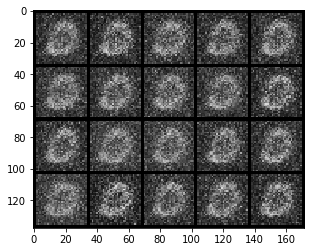

Epoch 1: Train D loss: 1.2451, G loss: 0.8179
Epoch 2: Train D loss: 1.1880, G loss: 1.0280
Epoch 3: Train D loss: 1.1662, G loss: 1.0638
Epoch 4: Train D loss: 1.1576, G loss: 1.0735
Epoch 5: Train D loss: 1.1762, G loss: 1.0814
Epoch 6: Train D loss: 1.1055, G loss: 1.1501
Epoch 7: Train D loss: 1.0848, G loss: 1.2406
Epoch 8: Train D loss: 1.1494, G loss: 1.2063
Epoch 9: Train D loss: 1.1267, G loss: 1.2304


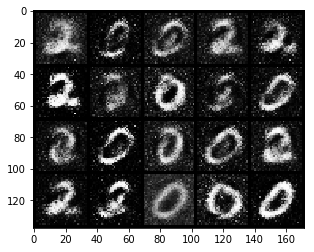

Epoch 10: Train D loss: 1.0794, G loss: 1.2477
Epoch 11: Train D loss: 1.0852, G loss: 1.3221
Epoch 12: Train D loss: 1.1038, G loss: 1.2929
Epoch 13: Train D loss: 1.1215, G loss: 1.2301
Epoch 14: Train D loss: 1.1145, G loss: 1.2793
Epoch 15: Train D loss: 1.0833, G loss: 1.3037
Epoch 16: Train D loss: 1.1122, G loss: 1.2746
Epoch 17: Train D loss: 1.1108, G loss: 1.3288
Epoch 18: Train D loss: 1.1052, G loss: 1.2922
Epoch 19: Train D loss: 1.0672, G loss: 1.3212


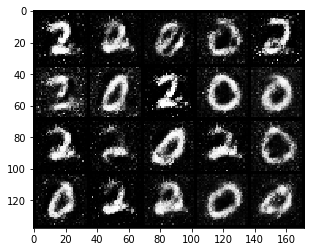

Epoch 20: Train D loss: 1.0772, G loss: 1.3735
Epoch 21: Train D loss: 1.0959, G loss: 1.3153
Epoch 22: Train D loss: 1.0944, G loss: 1.3137
Epoch 23: Train D loss: 1.1390, G loss: 1.2314
Epoch 24: Train D loss: 1.1527, G loss: 1.2470
Epoch 25: Train D loss: 1.1086, G loss: 1.2491
Epoch 26: Train D loss: 1.1250, G loss: 1.3089
Epoch 27: Train D loss: 1.1261, G loss: 1.2833
Epoch 28: Train D loss: 1.1585, G loss: 1.2231
Epoch 29: Train D loss: 1.1108, G loss: 1.2512


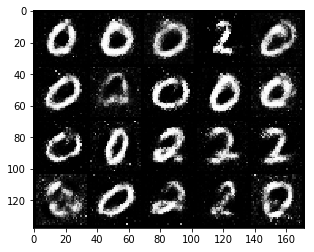

Epoch 30: Train D loss: 1.1223, G loss: 1.2840
Epoch 31: Train D loss: 1.1078, G loss: 1.2664
Epoch 32: Train D loss: 1.1288, G loss: 1.2546
Epoch 33: Train D loss: 1.1114, G loss: 1.2836
Epoch 34: Train D loss: 1.1146, G loss: 1.2552
Epoch 35: Train D loss: 1.1144, G loss: 1.2386
Epoch 36: Train D loss: 1.1200, G loss: 1.2715
Epoch 37: Train D loss: 1.1412, G loss: 1.1999
Epoch 38: Train D loss: 1.1244, G loss: 1.2551
Epoch 39: Train D loss: 1.1300, G loss: 1.2635


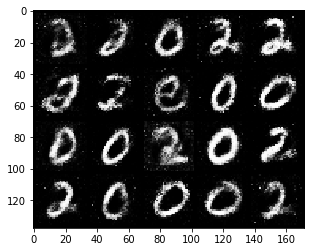

Epoch 40: Train D loss: 1.1273, G loss: 1.2487
Epoch 41: Train D loss: 1.1595, G loss: 1.2298
Epoch 42: Train D loss: 1.1079, G loss: 1.2670
Epoch 43: Train D loss: 1.1298, G loss: 1.2478
Epoch 44: Train D loss: 1.1356, G loss: 1.2403
Epoch 45: Train D loss: 1.1593, G loss: 1.1953
Epoch 46: Train D loss: 1.1333, G loss: 1.2257
Epoch 47: Train D loss: 1.1272, G loss: 1.2267
Epoch 48: Train D loss: 1.1509, G loss: 1.2044
Epoch 49: Train D loss: 1.1608, G loss: 1.2187


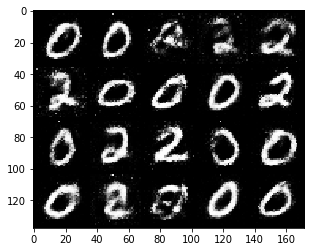

Epoch 50: Train D loss: 1.1338, G loss: 1.2204
Epoch 51: Train D loss: 1.1473, G loss: 1.2441
Epoch 52: Train D loss: 1.1468, G loss: 1.2555
Epoch 53: Train D loss: 1.1385, G loss: 1.2556
Epoch 54: Train D loss: 1.1285, G loss: 1.2438
Epoch 55: Train D loss: 1.1515, G loss: 1.2377
Epoch 56: Train D loss: 1.1268, G loss: 1.2630
Epoch 57: Train D loss: 1.1237, G loss: 1.2748
Epoch 58: Train D loss: 1.1118, G loss: 1.2985
Epoch 59: Train D loss: 1.1145, G loss: 1.2963


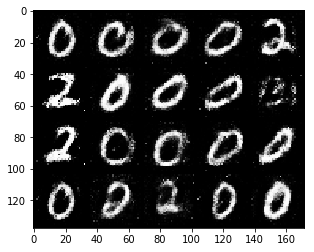

Epoch 60: Train D loss: 1.1386, G loss: 1.2608
Epoch 61: Train D loss: 1.1200, G loss: 1.2928
Epoch 62: Train D loss: 1.1241, G loss: 1.2657
Epoch 63: Train D loss: 1.1268, G loss: 1.3105
Epoch 64: Train D loss: 1.1186, G loss: 1.3243
Epoch 65: Train D loss: 1.0965, G loss: 1.2999
Epoch 66: Train D loss: 1.0993, G loss: 1.2963
Epoch 67: Train D loss: 1.0805, G loss: 1.3360
Epoch 68: Train D loss: 1.1040, G loss: 1.3450
Epoch 69: Train D loss: 1.1041, G loss: 1.3471


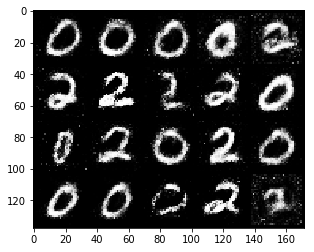

Epoch 70: Train D loss: 1.0878, G loss: 1.3679
Epoch 71: Train D loss: 1.1133, G loss: 1.2955
Epoch 72: Train D loss: 1.0950, G loss: 1.3076
Epoch 73: Train D loss: 1.0897, G loss: 1.3627
Epoch 74: Train D loss: 1.0792, G loss: 1.3884
Epoch 75: Train D loss: 1.0858, G loss: 1.4038
Epoch 76: Train D loss: 1.0567, G loss: 1.3888
Epoch 77: Train D loss: 1.0669, G loss: 1.4231
Epoch 78: Train D loss: 1.0755, G loss: 1.3868
Epoch 79: Train D loss: 1.0782, G loss: 1.3826


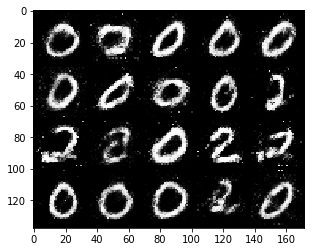

Epoch 80: Train D loss: 1.0555, G loss: 1.4450
Epoch 81: Train D loss: 1.0415, G loss: 1.4034
Epoch 82: Train D loss: 1.0556, G loss: 1.4301
Epoch 83: Train D loss: 1.0466, G loss: 1.4284
Epoch 84: Train D loss: 1.0540, G loss: 1.4703
Epoch 85: Train D loss: 1.0466, G loss: 1.4769
Epoch 86: Train D loss: 1.0185, G loss: 1.4637
Epoch 87: Train D loss: 1.0357, G loss: 1.4740
Epoch 88: Train D loss: 1.0542, G loss: 1.4336
Epoch 89: Train D loss: 1.0295, G loss: 1.4715


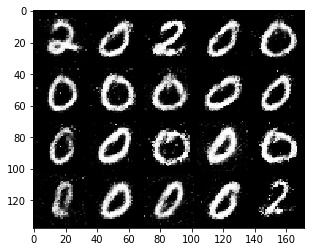

Epoch 90: Train D loss: 1.0130, G loss: 1.5153
Epoch 91: Train D loss: 1.0613, G loss: 1.4989
Epoch 92: Train D loss: 1.0050, G loss: 1.5058
Epoch 93: Train D loss: 1.0175, G loss: 1.5050
Epoch 94: Train D loss: 0.9986, G loss: 1.5288
Epoch 95: Train D loss: 1.0149, G loss: 1.5284
Epoch 96: Train D loss: 0.9792, G loss: 1.5542
Epoch 97: Train D loss: 1.0268, G loss: 1.5377
Epoch 98: Train D loss: 0.9759, G loss: 1.5634
Epoch 99: Train D loss: 0.9821, G loss: 1.5729


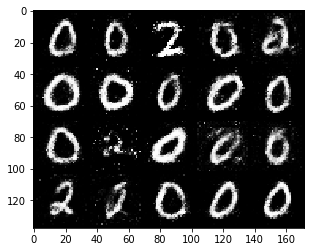

In [15]:
d_loss_hist, g_loss_hist = run_gan(trainloader, G, D, G_optimizer, D_optimizer, bceloss, 
                                   n_epochs, device, latent_dim)
    

训练完后,让我们来看一下G生成的图片效果,可以看到即使是一个简单的GAN在这种简单的数据集上的生成效果还是不错的,虽然仍然存在不少瑕疵,比如说我们可以看到生成的图片上的数字有很多奇怪的雪花等等.

让我们看一下G和D的loss变化曲线(运行下方语句.)

In [16]:
from utils import loss_plot

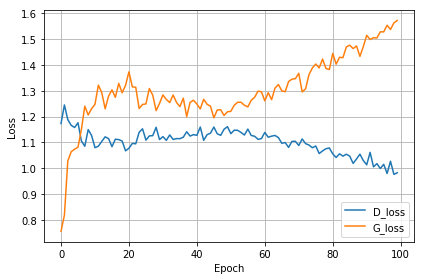

In [17]:
loss_plot(d_loss_hist, g_loss_hist)

#### **作业**:
观察G与D的loss曲线,与之前的训练的CNN的loss曲线相比,有什么不同?试简要回答你觉得可能产生这样的不同的原因.

**答:**  
**不同点：**  
CNN的loss曲线一般是呈下降趋势的较为平滑的曲线，而G和D的loss曲线比较曲折。从曲线本身的单调情况来看，它们的loss值也不一定下降，D和G一方的loss值上升，另一方的loss值会随之下降。  
**原因：**  
D和G存在循环优化的过程，G的loss值减少了，说明生成器得到了优化，与此同时，D判别器的loss值上升，然后需要优化判别器，G生成器的loss值上升，这样不断重复这个过程。

## DCGAN

在DCGAN(Deep Convolution GAN)中,最大的改变是使用了CNN代替全连接层.在生成器G中,使用stride为2的转置卷积来生成图片同时扩大图片尺寸,而在判别器D中,使用stride为2的卷积来将图片进行卷积并下采样.除此之外,DCGAN加入了在层与层之间BatchNormalization(虽然我们在普通的GAN中就已经添加),在G中使用ReLU作为激活函数,而在D中使用LeakyReLU作为激活函数.

In [18]:
from utils import initialize_weights
class DCGenerator(nn.Module):
    def __init__(self, image_size=32, latent_dim=64, output_channel=1):
        super(DCGenerator, self).__init__()
        self.image_size = image_size
        self.latent_dim = latent_dim
        self.output_channel = output_channel
        
        self.init_size = image_size // 8
        #4->32 size/(2^3) 三个转置卷积
        # fc: Linear -> BN -> ReLU
        self.fc = nn.Sequential(
            nn.Linear(latent_dim, 512 * self.init_size ** 2),
            nn.BatchNorm1d(512 * self.init_size ** 2),
            nn.ReLU(inplace=True)
        )
        
        # deconv: ConvTranspose2d(4, 2, 1) -> BN -> ReLU -> 
        #         ConvTranspose2d(4, 2, 1) -> BN -> ReLU -> 
        #         ConvTranspose2d(4, 2, 1) -> Tanh
        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, output_channel, 4, stride=2, padding=1),
            nn.Tanh(),
        )
        initialize_weights(self)

    def forward(self, z):
        out = self.fc(z)
        out = out.view(out.shape[0], 512, self.init_size, self.init_size)
        img = self.deconv(out)
        return img


class DCDiscriminator(nn.Module):
    def __init__(self, image_size=32, input_channel=1, sigmoid=True):
        super(DCDiscriminator, self).__init__()
        self.image_size = image_size
        self.input_channel = input_channel
        self.fc_size = image_size // 8
        
        # conv: Conv2d(3,2,1) -> LeakyReLU 
        #       Conv2d(3,2,1) -> BN -> LeakyReLU 
        #       Conv2d(3,2,1) -> BN -> LeakyReLU 
        self.conv = nn.Sequential(
            nn.Conv2d(input_channel, 128, 3, 2, 1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, 3, 2, 1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.Conv2d(256, 512, 3, 2, 1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2),
        )
        
        # fc: Linear -> Sigmoid
        self.fc = nn.Sequential(
            nn.Linear(512 * self.fc_size * self.fc_size, 1),
        )
        if sigmoid:
            self.fc.add_module('sigmoid', nn.Sigmoid())
        initialize_weights(self)
        
        

    def forward(self, img):
        out = self.conv(img)
        out = out.view(out.shape[0], -1)
        out = self.fc(out)

        return out

同样的,我们使用同样的mnist数据集对DCGAN进行训练.

In [22]:
# hyper params

# z dim
latent_dim = 100

# image size and channel
image_size=32
image_channel=1

# Adam lr and betas
learning_rate = 0.0002
betas = (0.5, 0.999)

# epochs and batch size
n_epochs = 100
batch_size = 32

# device : cpu or cuda:0/1/2/3
device = torch.device('cuda:0')

# mnist dataset and dataloader
train_dataset = load_mnist_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# use BCELoss as loss function
bceloss = nn.BCELoss().to(device)

# G and D model, use DCGAN
G = DCGenerator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = DCDiscriminator(image_size=image_size, input_channel=image_channel).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

Epoch 0: Train D loss: 0.3191, G loss: 4.7976


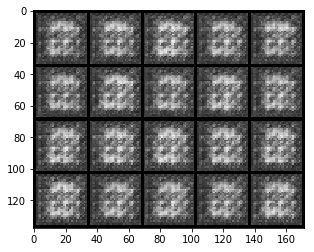

Epoch 1: Train D loss: 0.2859, G loss: 5.8498
Epoch 2: Train D loss: 0.1887, G loss: 4.9068
Epoch 3: Train D loss: 0.2682, G loss: 4.6711
Epoch 4: Train D loss: 0.4009, G loss: 3.6317
Epoch 5: Train D loss: 0.5855, G loss: 3.2854
Epoch 6: Train D loss: 0.4004, G loss: 2.8737
Epoch 7: Train D loss: 0.7180, G loss: 2.4393
Epoch 8: Train D loss: 0.3441, G loss: 2.6691
Epoch 9: Train D loss: 0.5161, G loss: 2.7060


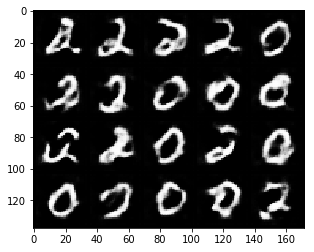

Epoch 10: Train D loss: 0.4729, G loss: 2.8327
Epoch 11: Train D loss: 0.5412, G loss: 2.4833
Epoch 12: Train D loss: 0.6249, G loss: 2.3583
Epoch 13: Train D loss: 0.5116, G loss: 2.4225
Epoch 14: Train D loss: 0.5147, G loss: 2.4825
Epoch 15: Train D loss: 0.5342, G loss: 2.4945
Epoch 16: Train D loss: 0.7399, G loss: 2.3952
Epoch 17: Train D loss: 0.4679, G loss: 2.4695
Epoch 18: Train D loss: 0.5182, G loss: 2.5152
Epoch 19: Train D loss: 0.6914, G loss: 2.1875


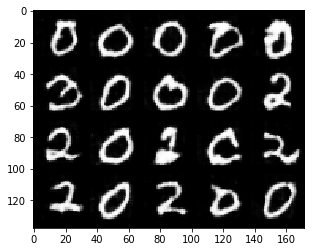

Epoch 20: Train D loss: 0.7098, G loss: 2.2906
Epoch 21: Train D loss: 0.4720, G loss: 2.5103
Epoch 22: Train D loss: 0.5703, G loss: 2.6017
Epoch 23: Train D loss: 0.4366, G loss: 2.5566
Epoch 24: Train D loss: 0.6576, G loss: 2.6423
Epoch 25: Train D loss: 0.4752, G loss: 2.5308
Epoch 26: Train D loss: 0.5027, G loss: 2.7595
Epoch 27: Train D loss: 0.4394, G loss: 2.8668
Epoch 28: Train D loss: 0.3745, G loss: 2.9977
Epoch 29: Train D loss: 0.3527, G loss: 3.0382


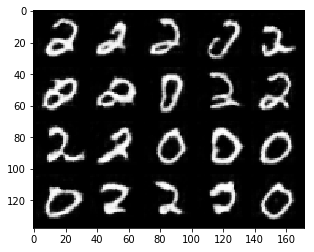

Epoch 30: Train D loss: 0.4363, G loss: 3.1863
Epoch 31: Train D loss: 0.5543, G loss: 2.8976
Epoch 32: Train D loss: 0.2471, G loss: 3.2501
Epoch 33: Train D loss: 0.1972, G loss: 3.4680
Epoch 34: Train D loss: 0.4816, G loss: 3.7056
Epoch 35: Train D loss: 0.2455, G loss: 3.2349
Epoch 36: Train D loss: 0.1401, G loss: 3.7578
Epoch 37: Train D loss: 0.4446, G loss: 3.9128
Epoch 38: Train D loss: 0.2723, G loss: 3.2574
Epoch 39: Train D loss: 0.1481, G loss: 3.8959


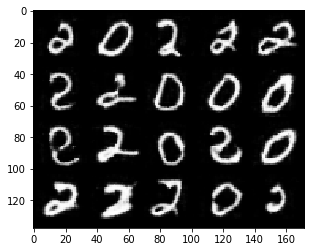

Epoch 40: Train D loss: 0.5430, G loss: 3.3696
Epoch 41: Train D loss: 0.1069, G loss: 3.9751
Epoch 42: Train D loss: 0.0739, G loss: 4.3170
Epoch 43: Train D loss: 0.9324, G loss: 2.8196
Epoch 44: Train D loss: 0.4616, G loss: 3.3000
Epoch 45: Train D loss: 0.1533, G loss: 3.6287
Epoch 46: Train D loss: 0.0726, G loss: 4.1954
Epoch 47: Train D loss: 0.0587, G loss: 4.4190
Epoch 48: Train D loss: 0.0497, G loss: 4.6014
Epoch 49: Train D loss: 0.0492, G loss: 4.7056


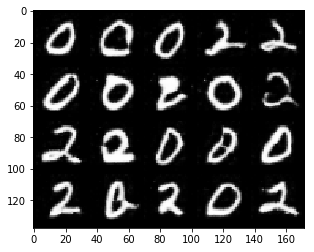

Epoch 50: Train D loss: 0.0415, G loss: 4.8653
Epoch 51: Train D loss: 0.7683, G loss: 3.6070
Epoch 52: Train D loss: 0.6898, G loss: 2.9683
Epoch 53: Train D loss: 0.1884, G loss: 3.6425
Epoch 54: Train D loss: 0.0772, G loss: 4.3060
Epoch 55: Train D loss: 0.0442, G loss: 4.6386
Epoch 56: Train D loss: 0.0411, G loss: 4.8934
Epoch 57: Train D loss: 0.0369, G loss: 4.9852
Epoch 58: Train D loss: 0.0308, G loss: 5.1063
Epoch 59: Train D loss: 0.0282, G loss: 5.2151


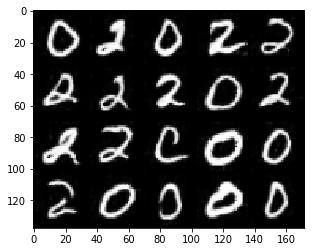

Epoch 60: Train D loss: 0.0285, G loss: 5.3545
Epoch 61: Train D loss: 0.0283, G loss: 5.3283
Epoch 62: Train D loss: 1.1526, G loss: 3.1379
Epoch 63: Train D loss: 0.3514, G loss: 3.2382
Epoch 64: Train D loss: 0.0776, G loss: 4.2371
Epoch 65: Train D loss: 0.1198, G loss: 4.5982
Epoch 66: Train D loss: 1.0910, G loss: 2.1643
Epoch 67: Train D loss: 0.5245, G loss: 2.9731
Epoch 68: Train D loss: 0.6239, G loss: 3.1704
Epoch 69: Train D loss: 0.1684, G loss: 3.6883


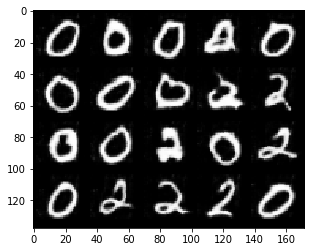

Epoch 70: Train D loss: 0.0591, G loss: 4.3198
Epoch 71: Train D loss: 0.0416, G loss: 4.6557
Epoch 72: Train D loss: 0.0301, G loss: 5.0123
Epoch 73: Train D loss: 0.0315, G loss: 5.0829
Epoch 74: Train D loss: 0.0268, G loss: 5.2399
Epoch 75: Train D loss: 0.0206, G loss: 5.3218
Epoch 76: Train D loss: 0.0189, G loss: 5.5064
Epoch 77: Train D loss: 0.9556, G loss: 3.2839
Epoch 78: Train D loss: 0.4260, G loss: 3.0431
Epoch 79: Train D loss: 0.1279, G loss: 4.1343


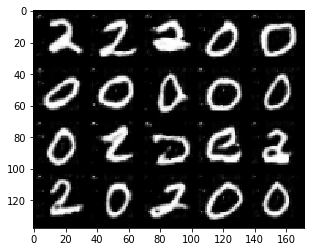

Epoch 80: Train D loss: 0.0524, G loss: 4.6365
Epoch 81: Train D loss: 0.0353, G loss: 4.9417
Epoch 82: Train D loss: 0.0334, G loss: 5.0956
Epoch 83: Train D loss: 0.0224, G loss: 5.4401
Epoch 84: Train D loss: 0.0179, G loss: 5.5789
Epoch 85: Train D loss: 0.0193, G loss: 5.6553
Epoch 86: Train D loss: 0.7473, G loss: 4.7290
Epoch 87: Train D loss: 0.8284, G loss: 2.0536
Epoch 88: Train D loss: 0.5882, G loss: 2.5601
Epoch 89: Train D loss: 0.5592, G loss: 3.0580


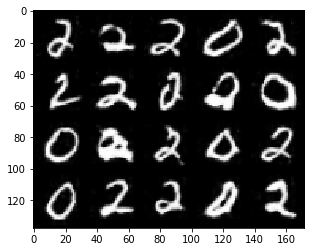

Epoch 90: Train D loss: 0.1397, G loss: 3.8335
Epoch 91: Train D loss: 0.7407, G loss: 3.0041
Epoch 92: Train D loss: 0.1175, G loss: 4.1194
Epoch 93: Train D loss: 0.0451, G loss: 4.6718
Epoch 94: Train D loss: 0.0316, G loss: 4.9741
Epoch 95: Train D loss: 0.0269, G loss: 5.1662
Epoch 96: Train D loss: 0.0202, G loss: 5.4013
Epoch 97: Train D loss: 0.0188, G loss: 5.5260
Epoch 98: Train D loss: 0.0168, G loss: 5.5669
Epoch 99: Train D loss: 0.0159, G loss: 5.6348


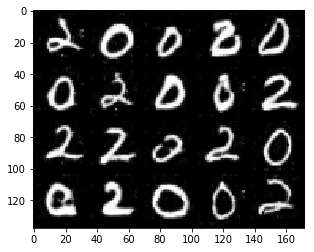

In [23]:
d_loss_hist, g_loss_hist = run_gan(trainloader, G, D, G_optimizer, D_optimizer, bceloss, 
                                   n_epochs, device, latent_dim)

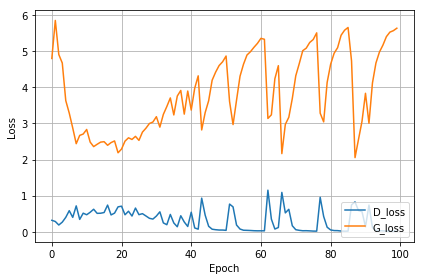

In [24]:
loss_plot(d_loss_hist, g_loss_hist)

可以看到,DCGAN的生成图片质量比起只有线性层的GAN要好不少.接下来,让我们尝试使用家具数据集来训练DCGAN.

Epoch 0: Train D loss: 0.9980, G loss: 3.5131


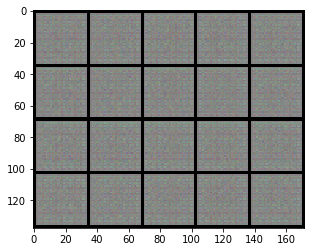

Epoch 1: Train D loss: 0.4167, G loss: 5.2582
Epoch 2: Train D loss: 0.2418, G loss: 5.6624
Epoch 3: Train D loss: 0.1628, G loss: 6.0582
Epoch 4: Train D loss: 0.2960, G loss: 6.1383
Epoch 5: Train D loss: 0.1145, G loss: 5.8752
Epoch 6: Train D loss: 0.1704, G loss: 6.6427
Epoch 7: Train D loss: 0.1636, G loss: 5.6423
Epoch 8: Train D loss: 0.1580, G loss: 4.6853
Epoch 9: Train D loss: 0.1527, G loss: 5.2427


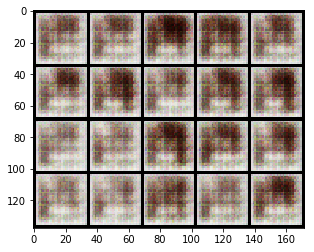

Epoch 10: Train D loss: 0.6236, G loss: 4.5063
Epoch 11: Train D loss: 0.5111, G loss: 3.9807
Epoch 12: Train D loss: 0.3056, G loss: 3.9388
Epoch 13: Train D loss: 0.3284, G loss: 4.3390
Epoch 14: Train D loss: 0.3128, G loss: 5.2612
Epoch 15: Train D loss: 0.2050, G loss: 5.1338
Epoch 16: Train D loss: 0.3868, G loss: 6.4150
Epoch 17: Train D loss: 0.4347, G loss: 4.4885
Epoch 18: Train D loss: 0.2520, G loss: 4.6211
Epoch 19: Train D loss: 0.3389, G loss: 5.2033


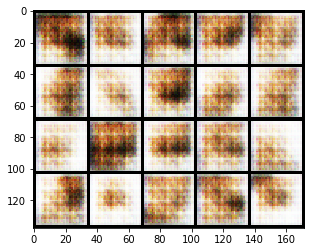

Epoch 20: Train D loss: 0.3838, G loss: 5.0534
Epoch 21: Train D loss: 0.1772, G loss: 5.6552
Epoch 22: Train D loss: 0.5169, G loss: 4.7898
Epoch 23: Train D loss: 0.2380, G loss: 4.2483
Epoch 24: Train D loss: 0.2222, G loss: 5.4021
Epoch 25: Train D loss: 0.2608, G loss: 5.4771
Epoch 26: Train D loss: 0.4246, G loss: 5.4223
Epoch 27: Train D loss: 0.2136, G loss: 5.0284
Epoch 28: Train D loss: 0.2828, G loss: 5.2418
Epoch 29: Train D loss: 0.3415, G loss: 5.1313


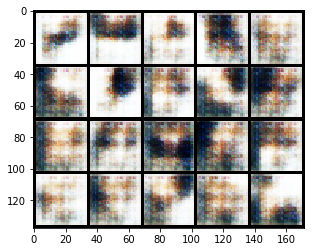

Epoch 30: Train D loss: 0.3981, G loss: 5.0792
Epoch 31: Train D loss: 0.2903, G loss: 4.3989
Epoch 32: Train D loss: 0.2577, G loss: 4.4023
Epoch 33: Train D loss: 0.2623, G loss: 5.2215
Epoch 34: Train D loss: 0.2879, G loss: 4.7458
Epoch 35: Train D loss: 0.2834, G loss: 5.0904
Epoch 36: Train D loss: 0.3161, G loss: 4.8153
Epoch 37: Train D loss: 0.5116, G loss: 4.3258
Epoch 38: Train D loss: 0.3404, G loss: 4.0942
Epoch 39: Train D loss: 0.3944, G loss: 4.6982


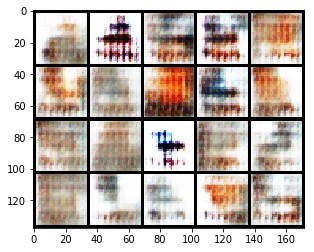

Epoch 40: Train D loss: 0.3422, G loss: 4.5784
Epoch 41: Train D loss: 0.4852, G loss: 4.9303
Epoch 42: Train D loss: 0.3198, G loss: 4.1317
Epoch 43: Train D loss: 0.4561, G loss: 4.6660
Epoch 44: Train D loss: 0.4449, G loss: 4.4935
Epoch 45: Train D loss: 0.3502, G loss: 3.7029
Epoch 46: Train D loss: 0.2548, G loss: 4.0500
Epoch 47: Train D loss: 0.2217, G loss: 4.0749
Epoch 48: Train D loss: 0.2707, G loss: 3.9107
Epoch 49: Train D loss: 0.5472, G loss: 5.2395


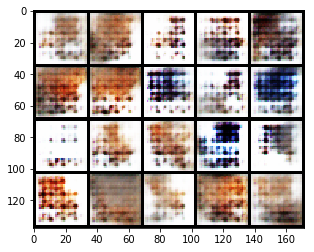

Epoch 50: Train D loss: 0.2586, G loss: 4.1093
Epoch 51: Train D loss: 0.5251, G loss: 4.5722
Epoch 52: Train D loss: 0.2578, G loss: 3.9946
Epoch 53: Train D loss: 0.2825, G loss: 3.8720
Epoch 54: Train D loss: 0.3260, G loss: 4.1509
Epoch 55: Train D loss: 0.3617, G loss: 4.0765
Epoch 56: Train D loss: 0.2798, G loss: 3.9931
Epoch 57: Train D loss: 0.3090, G loss: 3.9344
Epoch 58: Train D loss: 0.4093, G loss: 4.1556
Epoch 59: Train D loss: 0.4256, G loss: 4.1281


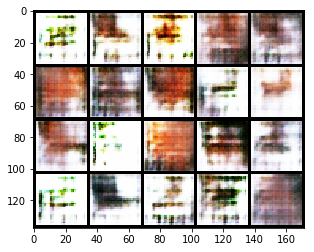

Epoch 60: Train D loss: 0.4614, G loss: 3.9238
Epoch 61: Train D loss: 0.5932, G loss: 4.1803
Epoch 62: Train D loss: 0.3888, G loss: 3.7966
Epoch 63: Train D loss: 0.3478, G loss: 3.5069
Epoch 64: Train D loss: 0.4096, G loss: 4.0901
Epoch 65: Train D loss: 0.3480, G loss: 3.6629
Epoch 66: Train D loss: 0.3683, G loss: 3.6734
Epoch 67: Train D loss: 0.3761, G loss: 3.6123
Epoch 68: Train D loss: 0.3521, G loss: 3.5689
Epoch 69: Train D loss: 0.4658, G loss: 4.0748


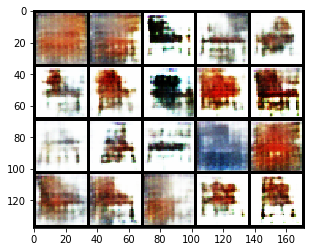

Epoch 70: Train D loss: 0.6830, G loss: 3.6188
Epoch 71: Train D loss: 0.4198, G loss: 3.4800
Epoch 72: Train D loss: 0.3657, G loss: 3.9149
Epoch 73: Train D loss: 0.3694, G loss: 3.7920
Epoch 74: Train D loss: 0.3620, G loss: 3.6806
Epoch 75: Train D loss: 0.4807, G loss: 3.7857
Epoch 76: Train D loss: 0.3430, G loss: 3.4119
Epoch 77: Train D loss: 0.3086, G loss: 3.4811
Epoch 78: Train D loss: 0.3403, G loss: 3.2591
Epoch 79: Train D loss: 0.3833, G loss: 3.4401


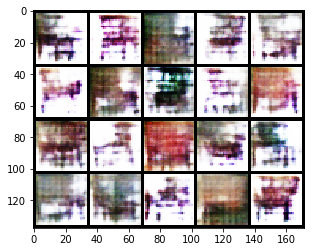

Epoch 80: Train D loss: 0.2618, G loss: 3.6768
Epoch 81: Train D loss: 0.6635, G loss: 3.8916
Epoch 82: Train D loss: 0.4014, G loss: 3.1889
Epoch 83: Train D loss: 0.3086, G loss: 3.2656
Epoch 84: Train D loss: 0.2782, G loss: 3.2941
Epoch 85: Train D loss: 0.3708, G loss: 3.4400
Epoch 86: Train D loss: 0.3754, G loss: 3.7684
Epoch 87: Train D loss: 0.5570, G loss: 3.6711
Epoch 88: Train D loss: 0.3431, G loss: 3.4293
Epoch 89: Train D loss: 0.3304, G loss: 3.3099


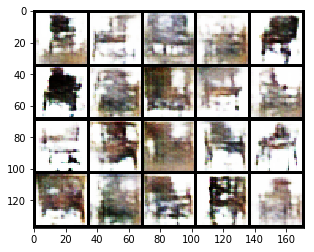

Epoch 90: Train D loss: 0.2969, G loss: 3.2817
Epoch 91: Train D loss: 0.3055, G loss: 3.4551
Epoch 92: Train D loss: 0.5777, G loss: 3.6488
Epoch 93: Train D loss: 0.4409, G loss: 3.3913
Epoch 94: Train D loss: 0.3515, G loss: 3.4007
Epoch 95: Train D loss: 0.4504, G loss: 3.2018
Epoch 96: Train D loss: 0.3866, G loss: 3.2507
Epoch 97: Train D loss: 0.2986, G loss: 3.1350
Epoch 98: Train D loss: 0.3607, G loss: 3.3568
Epoch 99: Train D loss: 0.3347, G loss: 3.3457


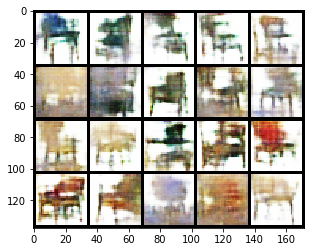

Epoch 100: Train D loss: 0.4244, G loss: 3.2355
Epoch 101: Train D loss: 0.3233, G loss: 3.2820
Epoch 102: Train D loss: 0.6375, G loss: 3.3015
Epoch 103: Train D loss: 0.3840, G loss: 3.0775
Epoch 104: Train D loss: 0.4543, G loss: 3.1543
Epoch 105: Train D loss: 0.3569, G loss: 3.2124
Epoch 106: Train D loss: 0.3341, G loss: 3.1197
Epoch 107: Train D loss: 0.3836, G loss: 3.2609
Epoch 108: Train D loss: 0.3609, G loss: 3.0867
Epoch 109: Train D loss: 0.3669, G loss: 3.2674


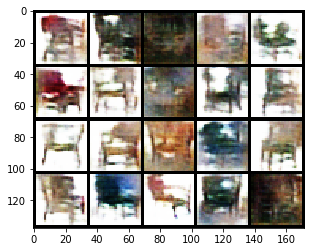

Epoch 110: Train D loss: 0.3664, G loss: 3.1851
Epoch 111: Train D loss: 0.2966, G loss: 3.2051
Epoch 112: Train D loss: 0.3164, G loss: 3.2642
Epoch 113: Train D loss: 0.4376, G loss: 3.3267
Epoch 114: Train D loss: 0.3680, G loss: 3.2185
Epoch 115: Train D loss: 0.4564, G loss: 3.2927
Epoch 116: Train D loss: 0.5312, G loss: 3.3508
Epoch 117: Train D loss: 0.3822, G loss: 3.2773
Epoch 118: Train D loss: 0.3972, G loss: 3.3167
Epoch 119: Train D loss: 0.2797, G loss: 3.2248


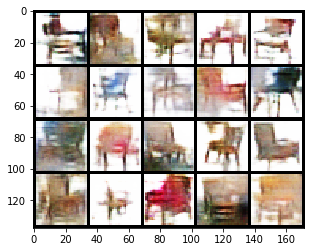

Epoch 120: Train D loss: 0.2686, G loss: 3.2196
Epoch 121: Train D loss: 0.3602, G loss: 3.3118
Epoch 122: Train D loss: 0.4271, G loss: 3.3496
Epoch 123: Train D loss: 0.3465, G loss: 3.2173
Epoch 124: Train D loss: 0.2571, G loss: 3.1908
Epoch 125: Train D loss: 0.2604, G loss: 3.1099
Epoch 126: Train D loss: 0.5463, G loss: 3.6025
Epoch 127: Train D loss: 0.2995, G loss: 3.1484
Epoch 128: Train D loss: 0.3005, G loss: 3.2182
Epoch 129: Train D loss: 0.2823, G loss: 3.3476


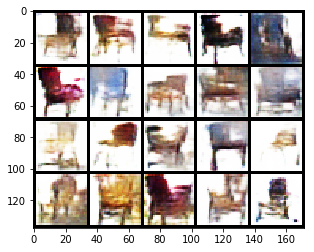

Epoch 130: Train D loss: 0.2701, G loss: 3.1892
Epoch 131: Train D loss: 0.5272, G loss: 3.5998
Epoch 132: Train D loss: 0.4272, G loss: 3.3949
Epoch 133: Train D loss: 0.3638, G loss: 3.2671
Epoch 134: Train D loss: 0.2707, G loss: 3.3095
Epoch 135: Train D loss: 0.2438, G loss: 3.1908
Epoch 136: Train D loss: 0.2862, G loss: 3.4018
Epoch 137: Train D loss: 0.3560, G loss: 3.3224
Epoch 138: Train D loss: 0.5130, G loss: 3.5753
Epoch 139: Train D loss: 0.3032, G loss: 3.2040


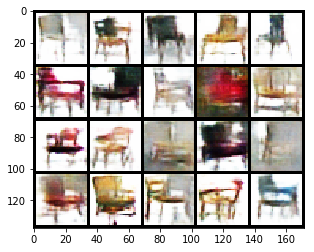

Epoch 140: Train D loss: 0.3858, G loss: 3.6969
Epoch 141: Train D loss: 0.3568, G loss: 3.3488
Epoch 142: Train D loss: 0.3623, G loss: 3.4903
Epoch 143: Train D loss: 0.2724, G loss: 3.3549
Epoch 144: Train D loss: 0.2506, G loss: 3.3330
Epoch 145: Train D loss: 0.2099, G loss: 3.3014
Epoch 146: Train D loss: 0.3516, G loss: 3.5279
Epoch 147: Train D loss: 0.3207, G loss: 3.3865
Epoch 148: Train D loss: 0.2345, G loss: 3.3750
Epoch 149: Train D loss: 0.1848, G loss: 3.3234


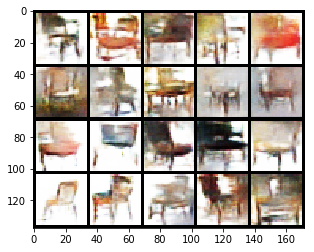

Epoch 150: Train D loss: 0.2114, G loss: 3.5285
Epoch 151: Train D loss: 0.2137, G loss: 3.5041
Epoch 152: Train D loss: 0.1839, G loss: 3.4407
Epoch 153: Train D loss: 0.3958, G loss: 3.6223
Epoch 154: Train D loss: 0.2626, G loss: 3.5140
Epoch 155: Train D loss: 0.2168, G loss: 3.5464
Epoch 156: Train D loss: 0.1577, G loss: 3.5592
Epoch 157: Train D loss: 0.1893, G loss: 3.5655
Epoch 158: Train D loss: 0.2519, G loss: 3.7211
Epoch 159: Train D loss: 0.2958, G loss: 3.5317


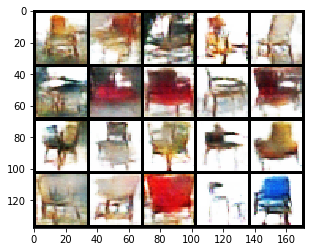

Epoch 160: Train D loss: 0.2034, G loss: 3.6169
Epoch 161: Train D loss: 0.2105, G loss: 3.7466
Epoch 162: Train D loss: 0.1751, G loss: 3.5524
Epoch 163: Train D loss: 0.2380, G loss: 3.7195
Epoch 164: Train D loss: 0.9252, G loss: 4.1642
Epoch 165: Train D loss: 0.7598, G loss: 3.7727
Epoch 166: Train D loss: 0.2548, G loss: 3.5988
Epoch 167: Train D loss: 0.2195, G loss: 3.4453
Epoch 168: Train D loss: 0.1771, G loss: 3.4676
Epoch 169: Train D loss: 0.1637, G loss: 3.5402


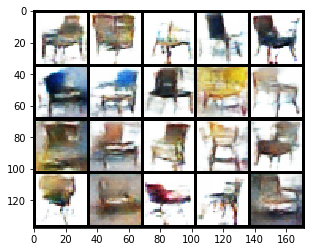

Epoch 170: Train D loss: 0.1829, G loss: 3.5418
Epoch 171: Train D loss: 0.1765, G loss: 3.6591
Epoch 172: Train D loss: 0.1589, G loss: 3.5532
Epoch 173: Train D loss: 0.1466, G loss: 3.5267
Epoch 174: Train D loss: 0.1185, G loss: 3.6563
Epoch 175: Train D loss: 0.1526, G loss: 3.6195
Epoch 176: Train D loss: 0.1278, G loss: 3.5789
Epoch 177: Train D loss: 0.4104, G loss: 4.1336
Epoch 178: Train D loss: 0.1925, G loss: 3.7912
Epoch 179: Train D loss: 0.1383, G loss: 3.7648


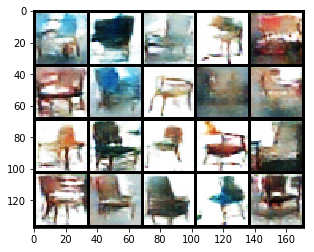

Epoch 180: Train D loss: 0.1338, G loss: 3.6903
Epoch 181: Train D loss: 0.1550, G loss: 3.7341
Epoch 182: Train D loss: 0.1424, G loss: 3.8036
Epoch 183: Train D loss: 0.1312, G loss: 3.8162
Epoch 184: Train D loss: 0.4997, G loss: 3.9411
Epoch 185: Train D loss: 1.9333, G loss: 4.0041
Epoch 186: Train D loss: 0.4520, G loss: 3.5972
Epoch 187: Train D loss: 0.2650, G loss: 3.6655
Epoch 188: Train D loss: 0.1923, G loss: 3.3844
Epoch 189: Train D loss: 0.1442, G loss: 3.5146


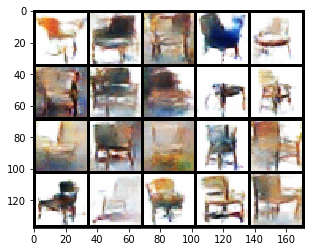

Epoch 190: Train D loss: 0.1662, G loss: 3.5277
Epoch 191: Train D loss: 0.1307, G loss: 3.6063
Epoch 192: Train D loss: 0.1278, G loss: 3.4923
Epoch 193: Train D loss: 0.1193, G loss: 3.6823
Epoch 194: Train D loss: 0.1295, G loss: 3.6953
Epoch 195: Train D loss: 0.1139, G loss: 3.7102
Epoch 196: Train D loss: 0.1002, G loss: 3.7050
Epoch 197: Train D loss: 0.1058, G loss: 3.8431
Epoch 198: Train D loss: 0.1039, G loss: 3.7829
Epoch 199: Train D loss: 0.1089, G loss: 3.8995


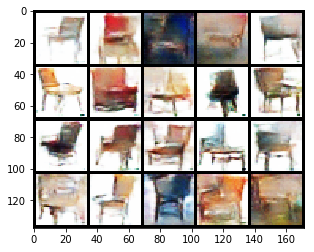

Epoch 200: Train D loss: 0.1055, G loss: 3.8382
Epoch 201: Train D loss: 0.1054, G loss: 3.9119
Epoch 202: Train D loss: 0.1074, G loss: 3.9304
Epoch 203: Train D loss: 0.0939, G loss: 3.9273
Epoch 204: Train D loss: 0.1006, G loss: 3.8927
Epoch 205: Train D loss: 0.0908, G loss: 3.9953
Epoch 206: Train D loss: 0.0857, G loss: 3.9810
Epoch 207: Train D loss: 0.0941, G loss: 3.9694
Epoch 208: Train D loss: 0.1011, G loss: 4.0229
Epoch 209: Train D loss: 0.0956, G loss: 4.0346


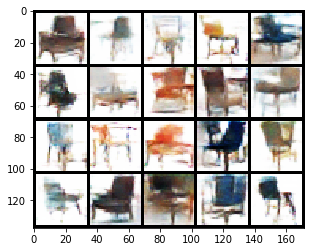

Epoch 210: Train D loss: 0.1243, G loss: 4.1233
Epoch 211: Train D loss: 1.9962, G loss: 4.2987
Epoch 212: Train D loss: 0.5620, G loss: 4.0170
Epoch 213: Train D loss: 0.3816, G loss: 4.0234
Epoch 214: Train D loss: 0.2116, G loss: 3.6190
Epoch 215: Train D loss: 0.1603, G loss: 3.6265
Epoch 216: Train D loss: 0.1296, G loss: 3.7802
Epoch 217: Train D loss: 0.1261, G loss: 3.6941
Epoch 218: Train D loss: 0.1184, G loss: 3.7305
Epoch 219: Train D loss: 0.1090, G loss: 3.8087


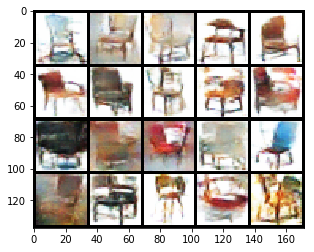

Epoch 220: Train D loss: 0.0854, G loss: 3.8442
Epoch 221: Train D loss: 0.0874, G loss: 3.9773
Epoch 222: Train D loss: 0.0884, G loss: 3.9549
Epoch 223: Train D loss: 0.0811, G loss: 4.0246
Epoch 224: Train D loss: 0.0819, G loss: 3.9740
Epoch 225: Train D loss: 0.0851, G loss: 4.0213
Epoch 226: Train D loss: 0.0791, G loss: 4.1355
Epoch 227: Train D loss: 0.0728, G loss: 4.0976
Epoch 228: Train D loss: 0.0750, G loss: 4.0581
Epoch 229: Train D loss: 0.0785, G loss: 4.1321


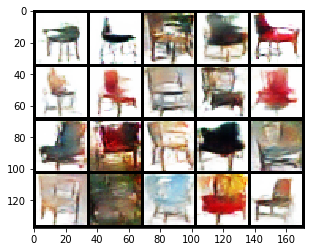

Epoch 230: Train D loss: 0.0638, G loss: 4.2363
Epoch 231: Train D loss: 0.0757, G loss: 4.0758
Epoch 232: Train D loss: 0.0751, G loss: 4.1817
Epoch 233: Train D loss: 0.0917, G loss: 4.2939
Epoch 234: Train D loss: 0.0704, G loss: 4.1944
Epoch 235: Train D loss: 0.0693, G loss: 4.2563
Epoch 236: Train D loss: 0.0781, G loss: 4.2351
Epoch 237: Train D loss: 0.1158, G loss: 4.2816
Epoch 238: Train D loss: 0.0703, G loss: 4.3317
Epoch 239: Train D loss: 0.0729, G loss: 4.3961


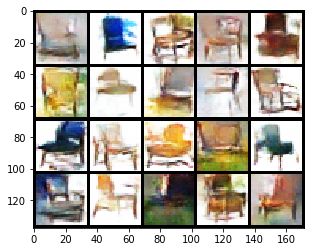

Epoch 240: Train D loss: 0.0729, G loss: 4.3146
Epoch 241: Train D loss: 0.0593, G loss: 4.4273
Epoch 242: Train D loss: 0.0683, G loss: 4.3914
Epoch 243: Train D loss: 0.0693, G loss: 4.4918
Epoch 244: Train D loss: 0.0705, G loss: 4.5099
Epoch 245: Train D loss: 0.0902, G loss: 4.3470
Epoch 246: Train D loss: 1.6383, G loss: 5.0809
Epoch 247: Train D loss: 1.1115, G loss: 4.2381
Epoch 248: Train D loss: 0.4286, G loss: 3.9240
Epoch 249: Train D loss: 0.1788, G loss: 3.7328


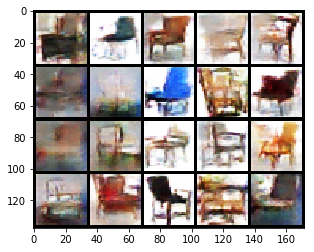

Epoch 250: Train D loss: 0.1537, G loss: 3.8020
Epoch 251: Train D loss: 0.1078, G loss: 3.8331
Epoch 252: Train D loss: 0.0916, G loss: 3.8766
Epoch 253: Train D loss: 0.0923, G loss: 4.0115
Epoch 254: Train D loss: 0.0822, G loss: 4.1022
Epoch 255: Train D loss: 0.0777, G loss: 4.0676
Epoch 256: Train D loss: 0.0699, G loss: 4.1105
Epoch 257: Train D loss: 0.0706, G loss: 4.2061
Epoch 258: Train D loss: 0.0655, G loss: 4.2252
Epoch 259: Train D loss: 0.0566, G loss: 4.2466


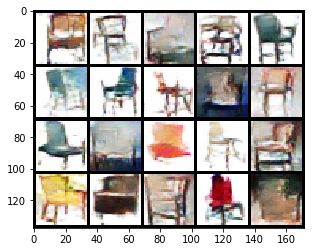

Epoch 260: Train D loss: 0.0597, G loss: 4.2762
Epoch 261: Train D loss: 0.0566, G loss: 4.3410
Epoch 262: Train D loss: 0.0536, G loss: 4.3751
Epoch 263: Train D loss: 0.0572, G loss: 4.3728
Epoch 264: Train D loss: 0.0875, G loss: 4.9522
Epoch 265: Train D loss: 0.1225, G loss: 4.5162
Epoch 266: Train D loss: 0.0698, G loss: 4.3192
Epoch 267: Train D loss: 0.0600, G loss: 4.4585
Epoch 268: Train D loss: 0.0569, G loss: 4.3977
Epoch 269: Train D loss: 0.0515, G loss: 4.4169


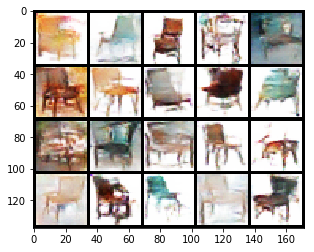

Epoch 270: Train D loss: 0.0531, G loss: 4.5689
Epoch 271: Train D loss: 0.0463, G loss: 4.5512
Epoch 272: Train D loss: 0.0499, G loss: 4.4978
Epoch 273: Train D loss: 0.0458, G loss: 4.6073
Epoch 274: Train D loss: 0.0469, G loss: 4.6806
Epoch 275: Train D loss: 0.0430, G loss: 4.6273
Epoch 276: Train D loss: 0.0385, G loss: 4.6967
Epoch 277: Train D loss: 0.0443, G loss: 4.6291
Epoch 278: Train D loss: 0.1100, G loss: 4.8868
Epoch 279: Train D loss: 0.0705, G loss: 4.7603


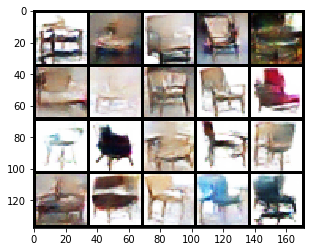

Epoch 280: Train D loss: 0.0451, G loss: 4.6647
Epoch 281: Train D loss: 0.0451, G loss: 4.7612
Epoch 282: Train D loss: 0.0413, G loss: 4.7624
Epoch 283: Train D loss: 0.0431, G loss: 4.9256
Epoch 284: Train D loss: 0.0399, G loss: 4.7416
Epoch 285: Train D loss: 0.0390, G loss: 4.7752
Epoch 286: Train D loss: 0.0343, G loss: 4.8593
Epoch 287: Train D loss: 0.0388, G loss: 4.9219
Epoch 288: Train D loss: 0.0385, G loss: 4.8843
Epoch 289: Train D loss: 0.0365, G loss: 4.8349


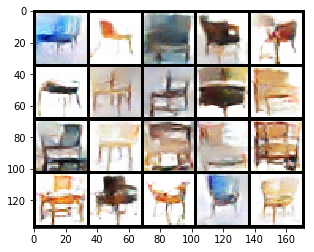

Epoch 290: Train D loss: 0.0397, G loss: 4.9382
Epoch 291: Train D loss: 0.0373, G loss: 4.9122
Epoch 292: Train D loss: 0.0387, G loss: 4.9423
Epoch 293: Train D loss: 0.0372, G loss: 4.9124
Epoch 294: Train D loss: 0.0312, G loss: 5.0170
Epoch 295: Train D loss: 0.0335, G loss: 5.0394
Epoch 296: Train D loss: 0.0327, G loss: 5.0276
Epoch 297: Train D loss: 0.0358, G loss: 4.9789
Epoch 298: Train D loss: 0.0314, G loss: 5.0485
Epoch 299: Train D loss: 0.0332, G loss: 5.0542


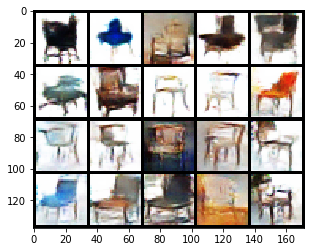

In [25]:
# RGB image channel = 3
image_channel=3

# epochs
n_epochs = 300

# mnist dataset and dataloader
train_dataset = load_furniture_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# G and D model, use DCGAN
G = DCGenerator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = DCDiscriminator(image_size=image_size, input_channel=image_channel).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

d_loss_hist, g_loss_hist = run_gan(trainloader, G, D, G_optimizer, D_optimizer, bceloss, 
                                   n_epochs, device, latent_dim)

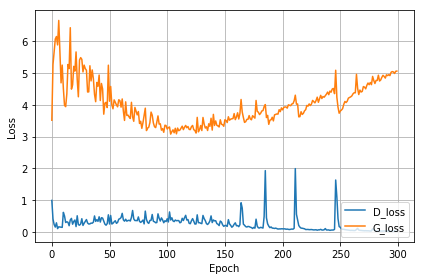

In [26]:
loss_plot(d_loss_hist, g_loss_hist)

## LSGAN

LSGAN(Least Squares GAN)将loss函数改为了 L2损失.G和D的优化目标如下图所示,
![lsgan](pictures/lsgan.png)
#### **作业**: 
在这里,请在下方补充L2Loss的代码来实现L2损失来优化上面的目标.并使用这个loss函数在mnist数据集上训练LSGAN,并显示训练的效果图片及loss变化曲线.

提示:忽略上图的1/2.L2损失即MSEloss(均方误差),传入两个参数input_是指判别器D预测为"真实"的概率值(size为batch_size\*1),target为标签1或0(size为batch_size\*1).只允许使用pytorch和python的运算实现(不能直接调用MSEloss)

In [31]:
class L2Loss(nn.Module):
    def __init__(self):
        super(L2Loss, self).__init__()
    
    def forward(self, input_, target):
        """
        input_: (batch_size*1) 
        target: (batch_size*1) labels, 1 or 0
        """
        """
        To Do
        """
        
        return ((input_ - target)**2).mean()

完成上方代码后,使用所写的L2Loss在mnist数据集上训练DCGAN.

In [32]:
# hyper params

# z dim
latent_dim = 100

# image size and channel
image_size=32
image_channel=1

# Adam lr and betas
learning_rate = 0.0002
betas = (0.5, 0.999)

# epochs and batch size
n_epochs = 100
batch_size = 32

# device : cpu or cuda:0/1/2/3
device = torch.device('cuda:0')

# mnist dataset and dataloader
train_dataset = load_mnist_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# use L2Loss as loss function
l2loss = L2Loss().to(device)

# G and D model, use DCGAN
G = DCGenerator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = DCDiscriminator(image_size=image_size, input_channel=image_channel).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

Epoch 0: Train D loss: 0.0875, G loss: 0.9559


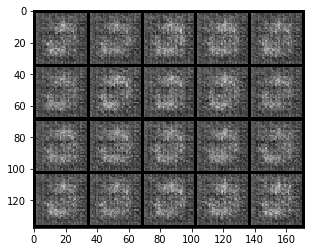

Epoch 1: Train D loss: 0.0297, G loss: 0.9873
Epoch 2: Train D loss: 0.0037, G loss: 0.9946
Epoch 3: Train D loss: 0.0297, G loss: 0.9754
Epoch 4: Train D loss: 0.0078, G loss: 0.9835
Epoch 5: Train D loss: 0.1149, G loss: 0.9478
Epoch 6: Train D loss: 0.1894, G loss: 0.8451
Epoch 7: Train D loss: 0.2493, G loss: 0.7424
Epoch 8: Train D loss: 0.2135, G loss: 0.6969
Epoch 9: Train D loss: 0.1984, G loss: 0.7001


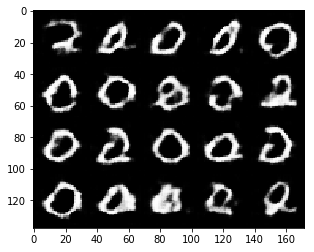

Epoch 10: Train D loss: 0.2024, G loss: 0.6858
Epoch 11: Train D loss: 0.2089, G loss: 0.6814
Epoch 12: Train D loss: 0.2311, G loss: 0.6602
Epoch 13: Train D loss: 0.1860, G loss: 0.6698
Epoch 14: Train D loss: 0.2248, G loss: 0.6758
Epoch 15: Train D loss: 0.2214, G loss: 0.6570
Epoch 16: Train D loss: 0.1721, G loss: 0.6984
Epoch 17: Train D loss: 0.1668, G loss: 0.7074
Epoch 18: Train D loss: 0.1954, G loss: 0.6947
Epoch 19: Train D loss: 0.2202, G loss: 0.6788


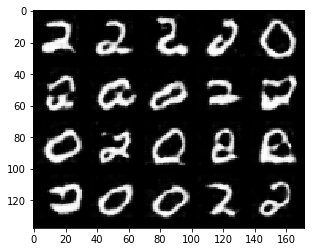

Epoch 20: Train D loss: 0.1661, G loss: 0.7116
Epoch 21: Train D loss: 0.1530, G loss: 0.7365
Epoch 22: Train D loss: 0.1374, G loss: 0.7382
Epoch 23: Train D loss: 0.1187, G loss: 0.7675
Epoch 24: Train D loss: 0.0698, G loss: 0.8083
Epoch 25: Train D loss: 0.0618, G loss: 0.8372
Epoch 26: Train D loss: 0.0839, G loss: 0.8221
Epoch 27: Train D loss: 0.0886, G loss: 0.8175
Epoch 28: Train D loss: 0.0720, G loss: 0.8378
Epoch 29: Train D loss: 0.0352, G loss: 0.8631


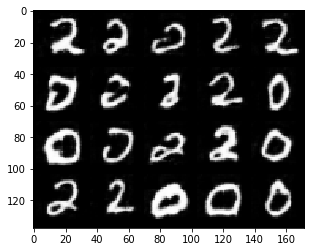

Epoch 30: Train D loss: 0.0748, G loss: 0.8615
Epoch 31: Train D loss: 0.1053, G loss: 0.8571
Epoch 32: Train D loss: 0.0223, G loss: 0.8838
Epoch 33: Train D loss: 0.0155, G loss: 0.8989
Epoch 34: Train D loss: 0.1655, G loss: 0.8290
Epoch 35: Train D loss: 0.0169, G loss: 0.8984
Epoch 36: Train D loss: 0.0997, G loss: 0.8786
Epoch 37: Train D loss: 0.0291, G loss: 0.9051
Epoch 38: Train D loss: 0.0103, G loss: 0.9150
Epoch 39: Train D loss: 0.0896, G loss: 0.9199


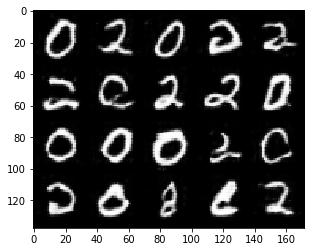

Epoch 40: Train D loss: 0.9990, G loss: 0.9998
Epoch 41: Train D loss: 0.3333, G loss: 0.7899
Epoch 42: Train D loss: 0.0447, G loss: 0.8761
Epoch 43: Train D loss: 0.0188, G loss: 0.9072
Epoch 44: Train D loss: 0.0082, G loss: 0.9236
Epoch 45: Train D loss: 0.1732, G loss: 0.8390
Epoch 46: Train D loss: 0.0813, G loss: 0.8597
Epoch 47: Train D loss: 0.0548, G loss: 0.8892
Epoch 48: Train D loss: 0.0086, G loss: 0.9209
Epoch 49: Train D loss: 0.0057, G loss: 0.9365


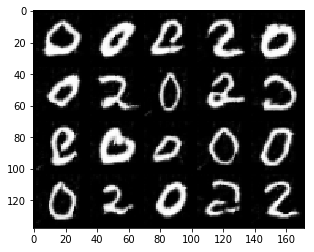

Epoch 50: Train D loss: 0.0049, G loss: 0.9388
Epoch 51: Train D loss: 0.0060, G loss: 0.9392
Epoch 52: Train D loss: 0.0047, G loss: 0.9423
Epoch 53: Train D loss: 0.0046, G loss: 0.9456
Epoch 54: Train D loss: 0.0045, G loss: 0.9468
Epoch 55: Train D loss: 0.0034, G loss: 0.9492
Epoch 56: Train D loss: 0.0021, G loss: 0.9776
Epoch 57: Train D loss: 0.2329, G loss: 0.9240
Epoch 58: Train D loss: 0.1126, G loss: 0.9124
Epoch 59: Train D loss: 0.1186, G loss: 0.8616


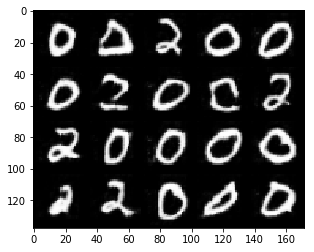

Epoch 60: Train D loss: 0.0125, G loss: 0.9248
Epoch 61: Train D loss: 0.0069, G loss: 0.9392
Epoch 62: Train D loss: 0.0070, G loss: 0.9416
Epoch 63: Train D loss: 0.0043, G loss: 0.9491
Epoch 64: Train D loss: 0.0030, G loss: 0.9516
Epoch 65: Train D loss: 0.0029, G loss: 0.9538
Epoch 66: Train D loss: 0.0030, G loss: 0.9549
Epoch 67: Train D loss: 0.0027, G loss: 0.9575
Epoch 68: Train D loss: 0.0031, G loss: 0.9571
Epoch 69: Train D loss: 0.4040, G loss: 0.7930


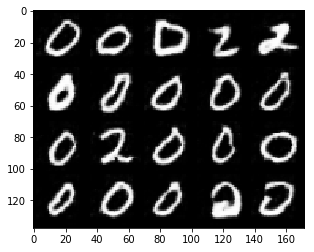

Epoch 70: Train D loss: 0.1084, G loss: 0.8998
Epoch 71: Train D loss: 0.0083, G loss: 0.9307
Epoch 72: Train D loss: 0.0062, G loss: 0.9432
Epoch 73: Train D loss: 0.0045, G loss: 0.9498
Epoch 74: Train D loss: 0.0028, G loss: 0.9584
Epoch 75: Train D loss: 0.0024, G loss: 0.9709
Epoch 76: Train D loss: 0.0029, G loss: 0.9570
Epoch 77: Train D loss: 0.0034, G loss: 0.9562
Epoch 78: Train D loss: 0.0020, G loss: 0.9622
Epoch 79: Train D loss: 0.0020, G loss: 0.9649


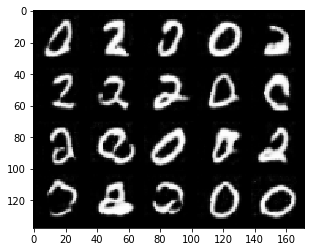

Epoch 80: Train D loss: 0.0015, G loss: 0.9648
Epoch 81: Train D loss: 0.0000, G loss: 0.9998
Epoch 82: Train D loss: 0.0009, G loss: 0.9823
Epoch 83: Train D loss: 0.0016, G loss: 0.9682
Epoch 84: Train D loss: 0.0015, G loss: 0.9684
Epoch 85: Train D loss: 0.0014, G loss: 0.9696
Epoch 86: Train D loss: 0.0029, G loss: 0.9667
Epoch 87: Train D loss: 0.3919, G loss: 0.7623
Epoch 88: Train D loss: 0.0816, G loss: 0.8968
Epoch 89: Train D loss: 0.0074, G loss: 0.9396


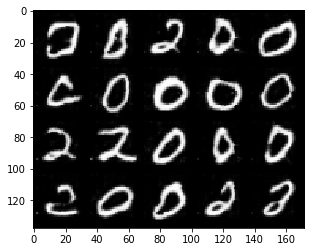

Epoch 90: Train D loss: 0.0046, G loss: 0.9541
Epoch 91: Train D loss: 0.0029, G loss: 0.9571
Epoch 92: Train D loss: 0.1719, G loss: 0.8579
Epoch 93: Train D loss: 0.0985, G loss: 0.8766
Epoch 94: Train D loss: 0.0073, G loss: 0.9402
Epoch 95: Train D loss: 0.0033, G loss: 0.9533
Epoch 96: Train D loss: 0.0023, G loss: 0.9573
Epoch 97: Train D loss: 0.0019, G loss: 0.9620
Epoch 98: Train D loss: 0.0018, G loss: 0.9635
Epoch 99: Train D loss: 0.0017, G loss: 0.9670


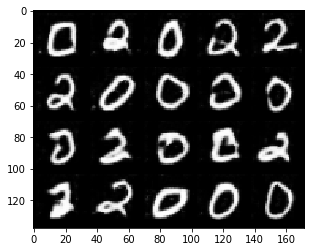

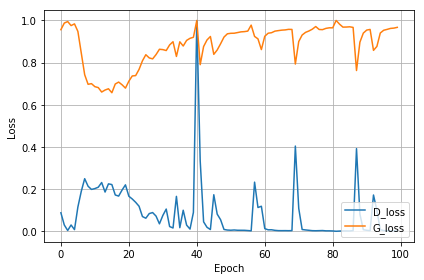

In [33]:
d_loss_hist, g_loss_hist = run_gan(trainloader, G, D, G_optimizer, D_optimizer, l2loss, n_epochs, device, 
                                   latent_dim)
loss_plot(d_loss_hist, g_loss_hist)

## WGAN

GAN依然存在着训练不稳定,模式崩溃(collapse mode,可以理解为生成的图片多样性极低)的问题(我们的数据集不一定能体现出来).WGAN(Wasserstein GAN)将传统GAN中拟合的JS散度改为Wasserstein距离.WGAN一定程度上解决了GAN训练不稳定以及模式奔溃的问题.

WGAN的判别器的优化目标变为,在满足Lipschitz连续的条件(我们可以限制w不超过某个范围来满足)下,最大化
![1](pictures/wgan1.png)
而它会近似于真实分布与生成分布之间的Wasserstein距离.所以我们D和G的loss函数变为:
![1](pictures/wgan3.png) ![1](pictures/wgan2.png)


具体到在实现上,WGAN主要有3点改变:
- 判别器D最后一层去掉sigmoid
- 生成器G和判别器的loss不使用log
- 每次更新判别器D后,将参数的绝对值截断到某一个固定常数c

所以我们主要重写了WGAN的训练函数,在这里,网络结构使用*去除Sigmoid的DCGAN*(注意初始化D时将sigmoid设置为False来去掉最后一层sigmoid).

下面是WGAN的代码实现.加入了两个参数,n_d表示每训练一次G训练D的次数,weight_clip表示截断的常数.


In [37]:
def wgan_train(trainloader, G, D, G_optimizer, D_optimizer, device, z_dim, n_d=2, weight_clip=0.01):
    
    """
    n_d: the number of iterations of D update per G update iteration
    weight_clip: the clipping parameters
    """
    
    D.train()
    G.train()
    
    D_total_loss = 0
    G_total_loss = 0
    
    for i, (x, _) in enumerate(trainloader):
        
        x = x.to(device)
        
        # update D network
        # D optimizer zero grads
        D_optimizer.zero_grad()
        
        # D real loss from real images
        d_real = D(x)
        d_real_loss = - d_real.mean()
        
        # D fake loss from fake images generated by G
        z = torch.rand(x.size(0), z_dim).to(device)
        g_z = G(z)
        d_fake = D(g_z)
        d_fake_loss = d_fake.mean()
        
        # D backward and step
        d_loss = d_real_loss + d_fake_loss
        d_loss.backward()
        D_optimizer.step()
        
        # D weight clip
        for params in D.parameters():
            params.data.clamp_(-weight_clip, weight_clip)
            
        D_total_loss += d_loss.item()

        # update G network
        if (i + 1) % n_d == 0:
            # G optimizer zero grads
            G_optimizer.zero_grad()

            # G loss
            g_z = G(z)
            d_fake = D(g_z)
            g_loss = - d_fake.mean()

            # G backward and step
            g_loss.backward()
            G_optimizer.step()
            
            G_total_loss += g_loss.item()
    
    return D_total_loss / len(trainloader), G_total_loss * n_d / len(trainloader)

In [38]:
def run_wgan(trainloader, G, D, G_optimizer, D_optimizer, n_epochs, device, latent_dim, n_d, weight_clip):
    d_loss_hist = []
    g_loss_hist = []

    for epoch in range(n_epochs):
        d_loss, g_loss = wgan_train(trainloader, G, D, G_optimizer, D_optimizer, device, 
                               z_dim=latent_dim, n_d=n_d, weight_clip=weight_clip)
        print('Epoch {}: Train D loss: {:.4f}, G loss: {:.4f}'.format(epoch, d_loss, g_loss))

        d_loss_hist.append(d_loss)
        g_loss_hist.append(g_loss)

        if epoch == 0 or (epoch + 1) % 10 == 0:
            visualize_results(G, device, latent_dim) 
    
    return d_loss_hist, g_loss_hist

接下来让我们使用写好的run_wgan来跑我们的家具(椅子)数据集,看看效果如何.

Epoch 0: Train D loss: 0.0024, G loss: -0.0007


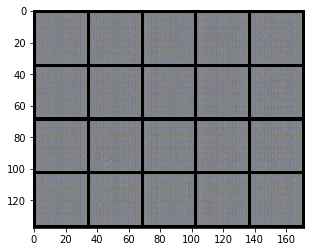

Epoch 1: Train D loss: -0.0480, G loss: 0.0092
Epoch 2: Train D loss: -0.0995, G loss: 0.0727
Epoch 3: Train D loss: -0.2207, G loss: 0.1720
Epoch 4: Train D loss: -0.3964, G loss: 0.2755
Epoch 5: Train D loss: -0.5870, G loss: 0.3499
Epoch 6: Train D loss: -0.7545, G loss: 0.4143
Epoch 7: Train D loss: -0.8521, G loss: 0.4611
Epoch 8: Train D loss: -0.6336, G loss: 0.4475
Epoch 9: Train D loss: -0.5053, G loss: 0.3813


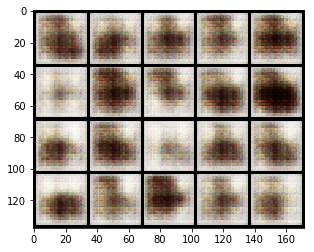

Epoch 10: Train D loss: -0.6544, G loss: 0.4116
Epoch 11: Train D loss: -0.7762, G loss: 0.4556
Epoch 12: Train D loss: -0.6407, G loss: 0.4392
Epoch 13: Train D loss: -0.6309, G loss: 0.4333
Epoch 14: Train D loss: -0.6900, G loss: 0.4787
Epoch 15: Train D loss: -0.6605, G loss: 0.4622
Epoch 16: Train D loss: -0.6606, G loss: 0.4533
Epoch 17: Train D loss: -0.7049, G loss: 0.4676
Epoch 18: Train D loss: -0.7108, G loss: 0.4664
Epoch 19: Train D loss: -0.6793, G loss: 0.4600


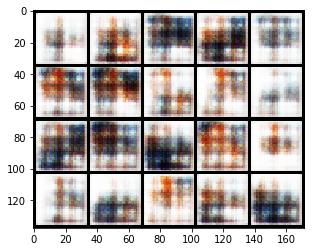

Epoch 20: Train D loss: -0.6476, G loss: 0.4384
Epoch 21: Train D loss: -0.5994, G loss: 0.3922
Epoch 22: Train D loss: -0.6158, G loss: 0.4534
Epoch 23: Train D loss: -0.6004, G loss: 0.4286
Epoch 24: Train D loss: -0.5987, G loss: 0.4210
Epoch 25: Train D loss: -0.6305, G loss: 0.4257
Epoch 26: Train D loss: -0.5964, G loss: 0.3981
Epoch 27: Train D loss: -0.6162, G loss: 0.4092
Epoch 28: Train D loss: -0.6027, G loss: 0.3921
Epoch 29: Train D loss: -0.5468, G loss: 0.3821


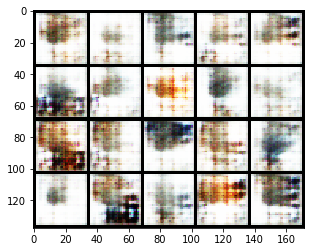

Epoch 30: Train D loss: -0.6250, G loss: 0.3768
Epoch 31: Train D loss: -0.5715, G loss: 0.3796
Epoch 32: Train D loss: -0.6211, G loss: 0.4122
Epoch 33: Train D loss: -0.6467, G loss: 0.4214
Epoch 34: Train D loss: -0.6675, G loss: 0.4039
Epoch 35: Train D loss: -0.6616, G loss: 0.4170
Epoch 36: Train D loss: -0.6418, G loss: 0.3873
Epoch 37: Train D loss: -0.6281, G loss: 0.3997
Epoch 38: Train D loss: -0.6602, G loss: 0.3956
Epoch 39: Train D loss: -0.6052, G loss: 0.3491


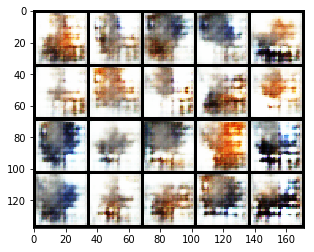

Epoch 40: Train D loss: -0.6254, G loss: 0.3706
Epoch 41: Train D loss: -0.6217, G loss: 0.3850
Epoch 42: Train D loss: -0.6055, G loss: 0.3659
Epoch 43: Train D loss: -0.6394, G loss: 0.3977
Epoch 44: Train D loss: -0.5717, G loss: 0.3660
Epoch 45: Train D loss: -0.5764, G loss: 0.3471
Epoch 46: Train D loss: -0.6714, G loss: 0.4048
Epoch 47: Train D loss: -0.5782, G loss: 0.3853
Epoch 48: Train D loss: -0.5819, G loss: 0.3529
Epoch 49: Train D loss: -0.5766, G loss: 0.3524


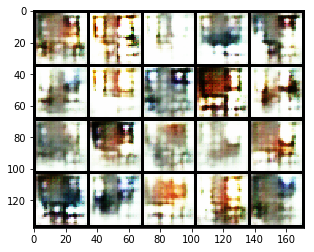

Epoch 50: Train D loss: -0.5782, G loss: 0.3292
Epoch 51: Train D loss: -0.5826, G loss: 0.2878
Epoch 52: Train D loss: -0.5856, G loss: 0.3336
Epoch 53: Train D loss: -0.5887, G loss: 0.3654
Epoch 54: Train D loss: -0.5949, G loss: 0.3678
Epoch 55: Train D loss: -0.5340, G loss: 0.3509
Epoch 56: Train D loss: -0.6333, G loss: 0.3977
Epoch 57: Train D loss: -0.5512, G loss: 0.3125
Epoch 58: Train D loss: -0.5872, G loss: 0.3569
Epoch 59: Train D loss: -0.5496, G loss: 0.2880


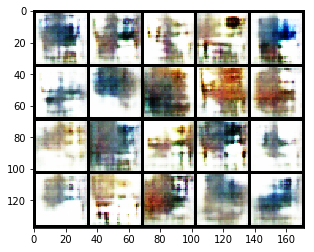

Epoch 60: Train D loss: -0.5668, G loss: 0.3261
Epoch 61: Train D loss: -0.5713, G loss: 0.3139
Epoch 62: Train D loss: -0.5280, G loss: 0.3158
Epoch 63: Train D loss: -0.5408, G loss: 0.2817
Epoch 64: Train D loss: -0.5599, G loss: 0.2856
Epoch 65: Train D loss: -0.5398, G loss: 0.2942
Epoch 66: Train D loss: -0.5258, G loss: 0.2746
Epoch 67: Train D loss: -0.5113, G loss: 0.2994
Epoch 68: Train D loss: -0.5120, G loss: 0.3130
Epoch 69: Train D loss: -0.5150, G loss: 0.2887


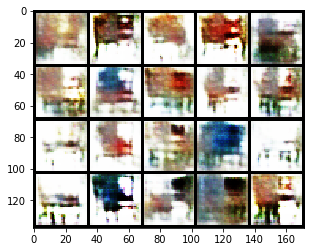

Epoch 70: Train D loss: -0.5373, G loss: 0.2988
Epoch 71: Train D loss: -0.5361, G loss: 0.3337
Epoch 72: Train D loss: -0.5310, G loss: 0.3001
Epoch 73: Train D loss: -0.5335, G loss: 0.3124
Epoch 74: Train D loss: -0.5048, G loss: 0.2991
Epoch 75: Train D loss: -0.6069, G loss: 0.3815
Epoch 76: Train D loss: -0.5478, G loss: 0.3905
Epoch 77: Train D loss: -0.5095, G loss: 0.2285
Epoch 78: Train D loss: -0.4820, G loss: 0.2482
Epoch 79: Train D loss: -0.5392, G loss: 0.3121


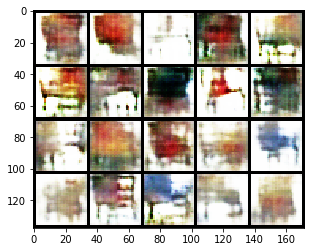

Epoch 80: Train D loss: -0.5062, G loss: 0.2953
Epoch 81: Train D loss: -0.5355, G loss: 0.3013
Epoch 82: Train D loss: -0.4989, G loss: 0.3324
Epoch 83: Train D loss: -0.4917, G loss: 0.3080
Epoch 84: Train D loss: -0.5536, G loss: 0.3138
Epoch 85: Train D loss: -0.5235, G loss: 0.3153
Epoch 86: Train D loss: -0.5290, G loss: 0.2896
Epoch 87: Train D loss: -0.5023, G loss: 0.2779
Epoch 88: Train D loss: -0.5309, G loss: 0.2670
Epoch 89: Train D loss: -0.5439, G loss: 0.3960


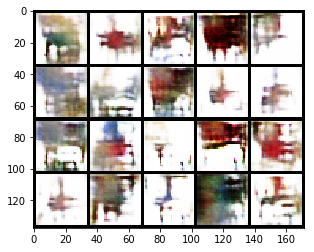

Epoch 90: Train D loss: -0.4849, G loss: 0.2531
Epoch 91: Train D loss: -0.5221, G loss: 0.3587
Epoch 92: Train D loss: -0.4942, G loss: 0.2744
Epoch 93: Train D loss: -0.5030, G loss: 0.2774
Epoch 94: Train D loss: -0.5012, G loss: 0.3015
Epoch 95: Train D loss: -0.4786, G loss: 0.2396
Epoch 96: Train D loss: -0.4956, G loss: 0.3122
Epoch 97: Train D loss: -0.4965, G loss: 0.2836
Epoch 98: Train D loss: -0.5112, G loss: 0.3064
Epoch 99: Train D loss: -0.4860, G loss: 0.2717


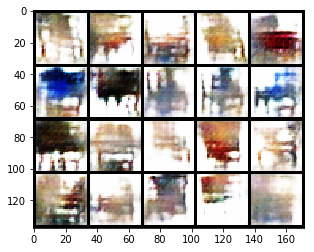

Epoch 100: Train D loss: -0.5243, G loss: 0.2836
Epoch 101: Train D loss: -0.4904, G loss: 0.3339
Epoch 102: Train D loss: -0.4596, G loss: 0.2920
Epoch 103: Train D loss: -0.5345, G loss: 0.2846
Epoch 104: Train D loss: -0.4974, G loss: 0.3175
Epoch 105: Train D loss: -0.5078, G loss: 0.3017
Epoch 106: Train D loss: -0.4872, G loss: 0.2611
Epoch 107: Train D loss: -0.5022, G loss: 0.3255
Epoch 108: Train D loss: -0.4949, G loss: 0.3053
Epoch 109: Train D loss: -0.5053, G loss: 0.3293


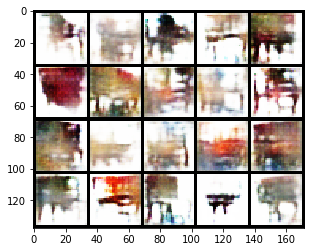

Epoch 110: Train D loss: -0.4772, G loss: 0.3484
Epoch 111: Train D loss: -0.4757, G loss: 0.2963
Epoch 112: Train D loss: -0.5034, G loss: 0.3438
Epoch 113: Train D loss: -0.4744, G loss: 0.2648
Epoch 114: Train D loss: -0.4835, G loss: 0.2763
Epoch 115: Train D loss: -0.4590, G loss: 0.2550
Epoch 116: Train D loss: -0.4887, G loss: 0.3284
Epoch 117: Train D loss: -0.4476, G loss: 0.2547
Epoch 118: Train D loss: -0.4559, G loss: 0.2873
Epoch 119: Train D loss: -0.4515, G loss: 0.2480


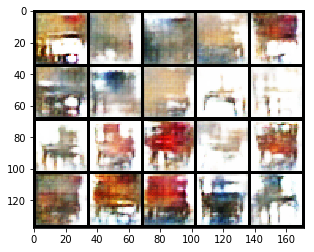

Epoch 120: Train D loss: -0.4737, G loss: 0.3043
Epoch 121: Train D loss: -0.4667, G loss: 0.2303
Epoch 122: Train D loss: -0.4464, G loss: 0.2729
Epoch 123: Train D loss: -0.4966, G loss: 0.2846
Epoch 124: Train D loss: -0.4370, G loss: 0.2773
Epoch 125: Train D loss: -0.5302, G loss: 0.3150
Epoch 126: Train D loss: -0.4233, G loss: 0.3046
Epoch 127: Train D loss: -0.4532, G loss: 0.2677
Epoch 128: Train D loss: -0.4565, G loss: 0.2749
Epoch 129: Train D loss: -0.4613, G loss: 0.3340


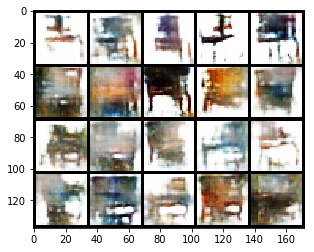

Epoch 130: Train D loss: -0.4427, G loss: 0.2981
Epoch 131: Train D loss: -0.4483, G loss: 0.2605
Epoch 132: Train D loss: -0.4877, G loss: 0.3245
Epoch 133: Train D loss: -0.4360, G loss: 0.2298
Epoch 134: Train D loss: -0.4703, G loss: 0.2475
Epoch 135: Train D loss: -0.4210, G loss: 0.2375
Epoch 136: Train D loss: -0.4763, G loss: 0.2984
Epoch 137: Train D loss: -0.4623, G loss: 0.3181
Epoch 138: Train D loss: -0.4399, G loss: 0.2595
Epoch 139: Train D loss: -0.4430, G loss: 0.2481


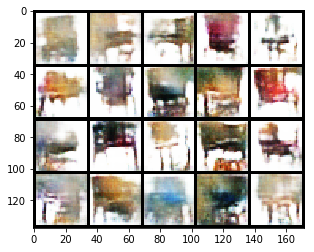

Epoch 140: Train D loss: -0.4344, G loss: 0.2278
Epoch 141: Train D loss: -0.4647, G loss: 0.2541
Epoch 142: Train D loss: -0.4238, G loss: 0.2675
Epoch 143: Train D loss: -0.4203, G loss: 0.2408
Epoch 144: Train D loss: -0.4685, G loss: 0.2504
Epoch 145: Train D loss: -0.4469, G loss: 0.2898
Epoch 146: Train D loss: -0.4018, G loss: 0.2851
Epoch 147: Train D loss: -0.4736, G loss: 0.2626
Epoch 148: Train D loss: -0.3955, G loss: 0.2666
Epoch 149: Train D loss: -0.4371, G loss: 0.2341


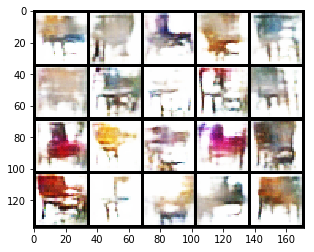

Epoch 150: Train D loss: -0.4368, G loss: 0.2541
Epoch 151: Train D loss: -0.4111, G loss: 0.2803
Epoch 152: Train D loss: -0.4414, G loss: 0.2869
Epoch 153: Train D loss: -0.4182, G loss: 0.2719
Epoch 154: Train D loss: -0.4569, G loss: 0.2861
Epoch 155: Train D loss: -0.4292, G loss: 0.2978
Epoch 156: Train D loss: -0.4283, G loss: 0.2557
Epoch 157: Train D loss: -0.4142, G loss: 0.2402
Epoch 158: Train D loss: -0.4137, G loss: 0.2505
Epoch 159: Train D loss: -0.4464, G loss: 0.2629


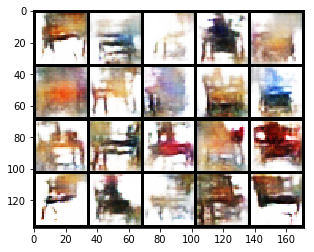

Epoch 160: Train D loss: -0.3854, G loss: 0.2721
Epoch 161: Train D loss: -0.4132, G loss: 0.2476
Epoch 162: Train D loss: -0.4418, G loss: 0.2607
Epoch 163: Train D loss: -0.3873, G loss: 0.2682
Epoch 164: Train D loss: -0.4398, G loss: 0.2970
Epoch 165: Train D loss: -0.4191, G loss: 0.2797
Epoch 166: Train D loss: -0.4021, G loss: 0.2545
Epoch 167: Train D loss: -0.4315, G loss: 0.2984
Epoch 168: Train D loss: -0.3953, G loss: 0.2634
Epoch 169: Train D loss: -0.4116, G loss: 0.2622


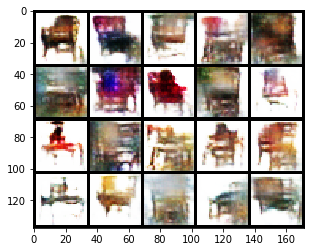

Epoch 170: Train D loss: -0.4018, G loss: 0.2333
Epoch 171: Train D loss: -0.4214, G loss: 0.2970
Epoch 172: Train D loss: -0.4081, G loss: 0.2721
Epoch 173: Train D loss: -0.4097, G loss: 0.2607
Epoch 174: Train D loss: -0.3591, G loss: 0.2559
Epoch 175: Train D loss: -0.4303, G loss: 0.2527
Epoch 176: Train D loss: -0.3830, G loss: 0.2739
Epoch 177: Train D loss: -0.3982, G loss: 0.2343
Epoch 178: Train D loss: -0.3968, G loss: 0.2442
Epoch 179: Train D loss: -0.3563, G loss: 0.2444


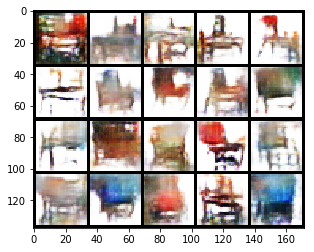

Epoch 180: Train D loss: -0.4174, G loss: 0.2721
Epoch 181: Train D loss: -0.3917, G loss: 0.2603
Epoch 182: Train D loss: -0.4037, G loss: 0.2999
Epoch 183: Train D loss: -0.4098, G loss: 0.2639
Epoch 184: Train D loss: -0.3641, G loss: 0.1923
Epoch 185: Train D loss: -0.3858, G loss: 0.2571
Epoch 186: Train D loss: -0.3973, G loss: 0.2237
Epoch 187: Train D loss: -0.3608, G loss: 0.1945
Epoch 188: Train D loss: -0.4067, G loss: 0.2304
Epoch 189: Train D loss: -0.3697, G loss: 0.2320


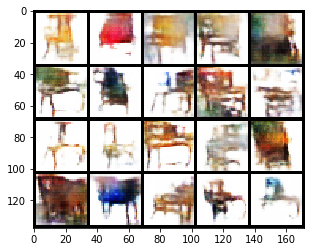

Epoch 190: Train D loss: -0.3814, G loss: 0.2927
Epoch 191: Train D loss: -0.3743, G loss: 0.2141
Epoch 192: Train D loss: -0.3621, G loss: 0.1856
Epoch 193: Train D loss: -0.3508, G loss: 0.2044
Epoch 194: Train D loss: -0.4172, G loss: 0.2994
Epoch 195: Train D loss: -0.3519, G loss: 0.2273
Epoch 196: Train D loss: -0.3825, G loss: 0.2673
Epoch 197: Train D loss: -0.3668, G loss: 0.2365
Epoch 198: Train D loss: -0.3740, G loss: 0.2333
Epoch 199: Train D loss: -0.3862, G loss: 0.2637


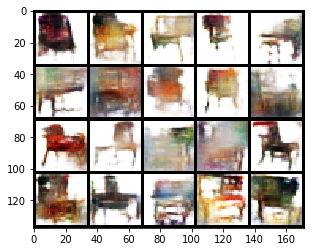

Epoch 200: Train D loss: -0.3656, G loss: 0.2076
Epoch 201: Train D loss: -0.3879, G loss: 0.2610
Epoch 202: Train D loss: -0.3610, G loss: 0.2515
Epoch 203: Train D loss: -0.3741, G loss: 0.1640
Epoch 204: Train D loss: -0.3307, G loss: 0.2389
Epoch 205: Train D loss: -0.3673, G loss: 0.2219
Epoch 206: Train D loss: -0.3897, G loss: 0.2975
Epoch 207: Train D loss: -0.3617, G loss: 0.2699
Epoch 208: Train D loss: -0.3476, G loss: 0.2628
Epoch 209: Train D loss: -0.3585, G loss: 0.2488


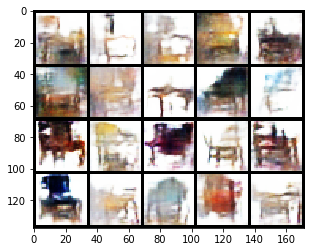

Epoch 210: Train D loss: -0.3293, G loss: 0.2045
Epoch 211: Train D loss: -0.3641, G loss: 0.2170
Epoch 212: Train D loss: -0.3600, G loss: 0.2158
Epoch 213: Train D loss: -0.3738, G loss: 0.2420
Epoch 214: Train D loss: -0.3628, G loss: 0.2638
Epoch 215: Train D loss: -0.3854, G loss: 0.2870
Epoch 216: Train D loss: -0.3276, G loss: 0.2127
Epoch 217: Train D loss: -0.3704, G loss: 0.1895
Epoch 218: Train D loss: -0.3752, G loss: 0.2994
Epoch 219: Train D loss: -0.3637, G loss: 0.2891


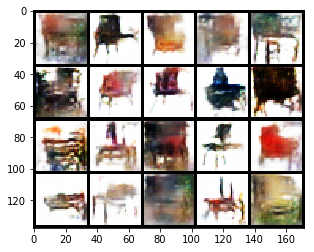

Epoch 220: Train D loss: -0.3438, G loss: 0.1998
Epoch 221: Train D loss: -0.4083, G loss: 0.3031
Epoch 222: Train D loss: -0.3580, G loss: 0.2647
Epoch 223: Train D loss: -0.3726, G loss: 0.2754
Epoch 224: Train D loss: -0.3826, G loss: 0.2186
Epoch 225: Train D loss: -0.3357, G loss: 0.2070
Epoch 226: Train D loss: -0.3684, G loss: 0.2189
Epoch 227: Train D loss: -0.3691, G loss: 0.2947
Epoch 228: Train D loss: -0.3405, G loss: 0.2364
Epoch 229: Train D loss: -0.3544, G loss: 0.2432


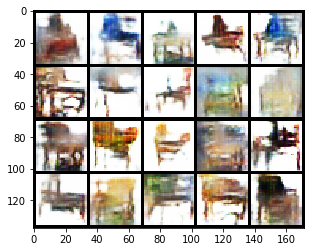

Epoch 230: Train D loss: -0.3389, G loss: 0.1979
Epoch 231: Train D loss: -0.3854, G loss: 0.2169
Epoch 232: Train D loss: -0.3483, G loss: 0.2488
Epoch 233: Train D loss: -0.3702, G loss: 0.2777
Epoch 234: Train D loss: -0.3416, G loss: 0.2096
Epoch 235: Train D loss: -0.3597, G loss: 0.2248
Epoch 236: Train D loss: -0.3195, G loss: 0.1740
Epoch 237: Train D loss: -0.3885, G loss: 0.2277
Epoch 238: Train D loss: -0.3474, G loss: 0.2195
Epoch 239: Train D loss: -0.3531, G loss: 0.2699


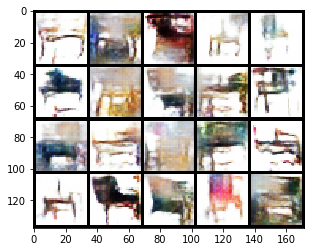

Epoch 240: Train D loss: -0.3753, G loss: 0.2740
Epoch 241: Train D loss: -0.3379, G loss: 0.1826
Epoch 242: Train D loss: -0.3588, G loss: 0.2805
Epoch 243: Train D loss: -0.3477, G loss: 0.2265
Epoch 244: Train D loss: -0.3419, G loss: 0.2305
Epoch 245: Train D loss: -0.3268, G loss: 0.1956
Epoch 246: Train D loss: -0.3485, G loss: 0.2434
Epoch 247: Train D loss: -0.3341, G loss: 0.2421
Epoch 248: Train D loss: -0.3555, G loss: 0.2137
Epoch 249: Train D loss: -0.3318, G loss: 0.1941


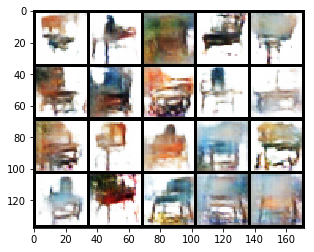

Epoch 250: Train D loss: -0.3642, G loss: 0.2945
Epoch 251: Train D loss: -0.3515, G loss: 0.1966
Epoch 252: Train D loss: -0.3463, G loss: 0.2371
Epoch 253: Train D loss: -0.3347, G loss: 0.1559
Epoch 254: Train D loss: -0.3368, G loss: 0.2346
Epoch 255: Train D loss: -0.3531, G loss: 0.2089
Epoch 256: Train D loss: -0.3355, G loss: 0.2180
Epoch 257: Train D loss: -0.3383, G loss: 0.1958
Epoch 258: Train D loss: -0.3565, G loss: 0.2329
Epoch 259: Train D loss: -0.3355, G loss: 0.1918


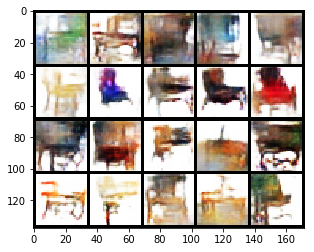

Epoch 260: Train D loss: -0.3363, G loss: 0.2302
Epoch 261: Train D loss: -0.3529, G loss: 0.2294
Epoch 262: Train D loss: -0.3505, G loss: 0.2541
Epoch 263: Train D loss: -0.3369, G loss: 0.2621
Epoch 264: Train D loss: -0.3389, G loss: 0.2149
Epoch 265: Train D loss: -0.3418, G loss: 0.2014
Epoch 266: Train D loss: -0.3584, G loss: 0.2179
Epoch 267: Train D loss: -0.3415, G loss: 0.2517
Epoch 268: Train D loss: -0.3119, G loss: 0.1999
Epoch 269: Train D loss: -0.3613, G loss: 0.2236


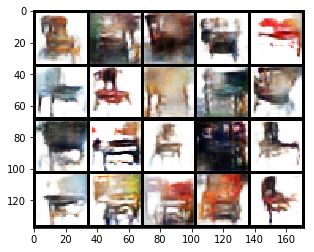

Epoch 270: Train D loss: -0.3367, G loss: 0.1658
Epoch 271: Train D loss: -0.3388, G loss: 0.2350
Epoch 272: Train D loss: -0.3421, G loss: 0.2470
Epoch 273: Train D loss: -0.3373, G loss: 0.2025
Epoch 274: Train D loss: -0.3235, G loss: 0.1760
Epoch 275: Train D loss: -0.3564, G loss: 0.2332
Epoch 276: Train D loss: -0.3440, G loss: 0.2360
Epoch 277: Train D loss: -0.3387, G loss: 0.2885
Epoch 278: Train D loss: -0.3187, G loss: 0.1846
Epoch 279: Train D loss: -0.3423, G loss: 0.2320


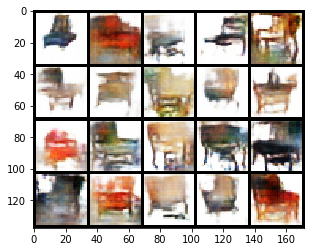

Epoch 280: Train D loss: -0.3285, G loss: 0.2389
Epoch 281: Train D loss: -0.3589, G loss: 0.2327
Epoch 282: Train D loss: -0.3196, G loss: 0.2196
Epoch 283: Train D loss: -0.3341, G loss: 0.1505
Epoch 284: Train D loss: -0.3293, G loss: 0.2538
Epoch 285: Train D loss: -0.3316, G loss: 0.2360
Epoch 286: Train D loss: -0.3360, G loss: 0.2560
Epoch 287: Train D loss: -0.3220, G loss: 0.2027
Epoch 288: Train D loss: -0.3246, G loss: 0.1901
Epoch 289: Train D loss: -0.3318, G loss: 0.1847


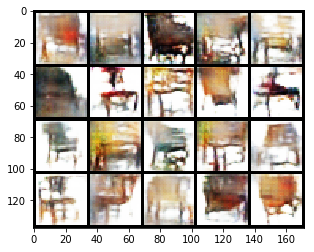

Epoch 290: Train D loss: -0.3372, G loss: 0.2392
Epoch 291: Train D loss: -0.3404, G loss: 0.2351
Epoch 292: Train D loss: -0.3351, G loss: 0.2042
Epoch 293: Train D loss: -0.3252, G loss: 0.2672
Epoch 294: Train D loss: -0.3289, G loss: 0.2338
Epoch 295: Train D loss: -0.3159, G loss: 0.2041
Epoch 296: Train D loss: -0.3470, G loss: 0.2246
Epoch 297: Train D loss: -0.3318, G loss: 0.2150
Epoch 298: Train D loss: -0.3202, G loss: 0.2347
Epoch 299: Train D loss: -0.3309, G loss: 0.1852


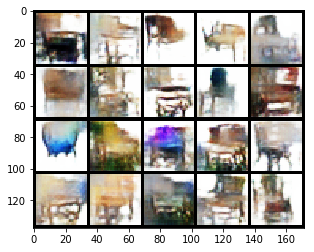

In [39]:
# hyper params

# z dim
latent_dim = 100

# image size and channel
image_size=32
image_channel=3

# Adam lr and betas
learning_rate = 0.0002
betas = (0.5, 0.999)

# epochs and batch size
n_epochs = 300
batch_size = 32

# n_d: the number of iterations of D update per G update iteration
n_d = 2
weight_clip=0.01

# device : cpu or cuda:0/1/2/3
device = torch.device('cuda:0')

# mnist dataset and dataloader
train_dataset = load_furniture_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# G and D model, use DCGAN, note that sigmoid is removed in D
G = DCGenerator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = DCDiscriminator(image_size=image_size, input_channel=image_channel, sigmoid=False).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

d_loss_hist, g_loss_hist = run_wgan(trainloader, G, D, G_optimizer, D_optimizer, n_epochs, device, 
                                    latent_dim, n_d, weight_clip)

由**WGAN**的原理我们知道,D_loss的*相反数*可以表示生成数据分布与真实分布的Wasserstein距离,其数值越小,表明两个分布越相似,GAN训练得越好.它的值给我们训练GAN提供了一个指标.

运行下方代码观察wgan的loss曲线,可以看到,总体上,D_loss的*相反数*随着epoch数增加逐渐下降,同时生成的数据也越来越逼近真实数据,这与wgan的原理是相符合的.

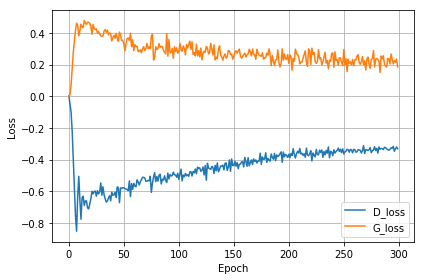

In [40]:
loss_plot(d_loss_hist, g_loss_hist)

接下来运行下面两个cell的代码,集中展示wgan的参数分布.

In [41]:
from utils import show_weights_hist
def show_d_params(D):
    plist = []
    for params in D.parameters():
        plist.extend(params.cpu().data.view(-1).numpy())
    show_weights_hist(plist)

/opt/conda/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6571: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


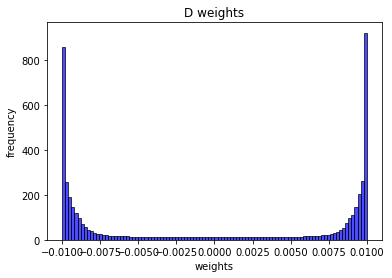

In [42]:
show_d_params(D)

可以看到,参数都被截断在\[-c, c\]之间,大部分参数集中在-c和c附近.

#### **作业**: 
尝试使用n_d设置为5, 3, 1等,再次训练wGAN,n_d为多少时的结果最好?

**答：**
从训练的相同epoch生成的图片和判别器D最后的绝对值大小（表示生成数据分布与真实分布的Wasserstein距离）来看，n_d为1时效果最好。

Epoch 0: Train D loss: 0.0174, G loss: -0.0100


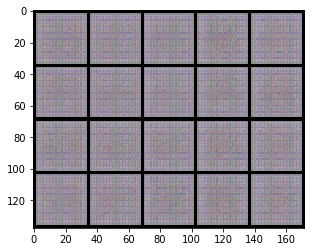

Epoch 1: Train D loss: -0.0162, G loss: -0.0040
Epoch 2: Train D loss: -0.0415, G loss: 0.0193
Epoch 3: Train D loss: -0.0667, G loss: 0.0737
Epoch 4: Train D loss: -0.1176, G loss: 0.0982
Epoch 5: Train D loss: -0.1150, G loss: 0.1267
Epoch 6: Train D loss: -0.0672, G loss: 0.0960
Epoch 7: Train D loss: -0.0794, G loss: 0.0910
Epoch 8: Train D loss: -0.1209, G loss: 0.1139
Epoch 9: Train D loss: -0.1576, G loss: 0.1787


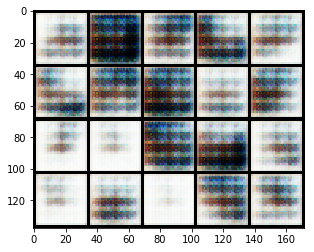

Epoch 10: Train D loss: -0.1730, G loss: 0.2027
Epoch 11: Train D loss: -0.1548, G loss: 0.1631
Epoch 12: Train D loss: -0.2089, G loss: 0.1964
Epoch 13: Train D loss: -0.2038, G loss: 0.1918
Epoch 14: Train D loss: -0.2664, G loss: 0.2387
Epoch 15: Train D loss: -0.3211, G loss: 0.2526
Epoch 16: Train D loss: -0.1896, G loss: 0.1863
Epoch 17: Train D loss: -0.2631, G loss: 0.2196
Epoch 18: Train D loss: -0.2456, G loss: 0.2723
Epoch 19: Train D loss: -0.2320, G loss: 0.2634


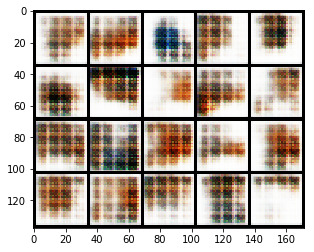

Epoch 20: Train D loss: -0.2646, G loss: 0.2272
Epoch 21: Train D loss: -0.2841, G loss: 0.2586
Epoch 22: Train D loss: -0.3409, G loss: 0.2737
Epoch 23: Train D loss: -0.3487, G loss: 0.3216
Epoch 24: Train D loss: -0.3384, G loss: 0.2762
Epoch 25: Train D loss: -0.4284, G loss: 0.3142
Epoch 26: Train D loss: -0.3853, G loss: 0.3206
Epoch 27: Train D loss: -0.4041, G loss: 0.3166
Epoch 28: Train D loss: -0.3672, G loss: 0.3184
Epoch 29: Train D loss: -0.3417, G loss: 0.3366


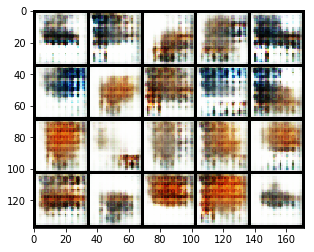

Epoch 30: Train D loss: -0.3599, G loss: 0.3348
Epoch 31: Train D loss: -0.2414, G loss: 0.2404
Epoch 32: Train D loss: -0.3752, G loss: 0.3195
Epoch 33: Train D loss: -0.3831, G loss: 0.3123
Epoch 34: Train D loss: -0.4209, G loss: 0.3460
Epoch 35: Train D loss: -0.4026, G loss: 0.3430
Epoch 36: Train D loss: -0.4069, G loss: 0.3411
Epoch 37: Train D loss: -0.3735, G loss: 0.3044
Epoch 38: Train D loss: -0.3726, G loss: 0.3261
Epoch 39: Train D loss: -0.3724, G loss: 0.3313


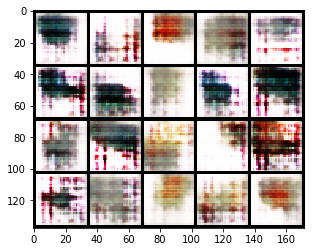

Epoch 40: Train D loss: -0.3359, G loss: 0.3202
Epoch 41: Train D loss: -0.3282, G loss: 0.2677
Epoch 42: Train D loss: -0.3446, G loss: 0.2986
Epoch 43: Train D loss: -0.3267, G loss: 0.2557
Epoch 44: Train D loss: -0.4371, G loss: 0.3304
Epoch 45: Train D loss: -0.3531, G loss: 0.2599
Epoch 46: Train D loss: -0.4827, G loss: 0.3391
Epoch 47: Train D loss: -0.3977, G loss: 0.3127
Epoch 48: Train D loss: -0.3960, G loss: 0.2840
Epoch 49: Train D loss: -0.4276, G loss: 0.3363


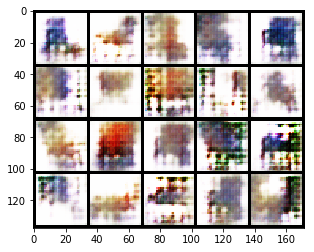

Epoch 50: Train D loss: -0.4173, G loss: 0.3062
Epoch 51: Train D loss: -0.3750, G loss: 0.3112
Epoch 52: Train D loss: -0.3979, G loss: 0.3267
Epoch 53: Train D loss: -0.3662, G loss: 0.2913
Epoch 54: Train D loss: -0.3736, G loss: 0.2939
Epoch 55: Train D loss: -0.4368, G loss: 0.3303
Epoch 56: Train D loss: -0.3863, G loss: 0.2985
Epoch 57: Train D loss: -0.4021, G loss: 0.3016
Epoch 58: Train D loss: -0.4095, G loss: 0.2943
Epoch 59: Train D loss: -0.3829, G loss: 0.2924


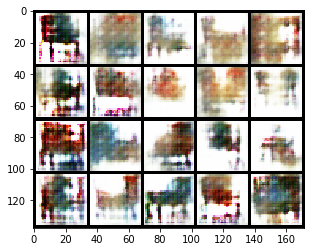

Epoch 60: Train D loss: -0.3378, G loss: 0.2896
Epoch 61: Train D loss: -0.3412, G loss: 0.2734
Epoch 62: Train D loss: -0.3664, G loss: 0.2818
Epoch 63: Train D loss: -0.3531, G loss: 0.2642
Epoch 64: Train D loss: -0.3520, G loss: 0.2815
Epoch 65: Train D loss: -0.3526, G loss: 0.2677
Epoch 66: Train D loss: -0.3622, G loss: 0.2614
Epoch 67: Train D loss: -0.3518, G loss: 0.2994
Epoch 68: Train D loss: -0.3609, G loss: 0.2681
Epoch 69: Train D loss: -0.3625, G loss: 0.2761


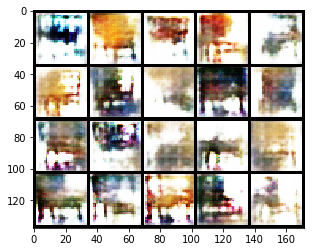

Epoch 70: Train D loss: -0.3126, G loss: 0.2666
Epoch 71: Train D loss: -0.3652, G loss: 0.2735
Epoch 72: Train D loss: -0.3505, G loss: 0.2574
Epoch 73: Train D loss: -0.3594, G loss: 0.2724
Epoch 74: Train D loss: -0.3259, G loss: 0.2719
Epoch 75: Train D loss: -0.3822, G loss: 0.2832
Epoch 76: Train D loss: -0.3444, G loss: 0.2638
Epoch 77: Train D loss: -0.3235, G loss: 0.2500
Epoch 78: Train D loss: -0.3139, G loss: 0.2359
Epoch 79: Train D loss: -0.3434, G loss: 0.2613


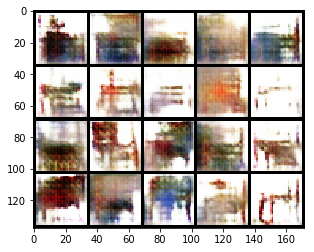

Epoch 80: Train D loss: -0.2962, G loss: 0.2463
Epoch 81: Train D loss: -0.3285, G loss: 0.2539
Epoch 82: Train D loss: -0.3506, G loss: 0.2748
Epoch 83: Train D loss: -0.2835, G loss: 0.2274
Epoch 84: Train D loss: -0.2904, G loss: 0.2706
Epoch 85: Train D loss: -0.3082, G loss: 0.2565
Epoch 86: Train D loss: -0.2698, G loss: 0.2388
Epoch 87: Train D loss: -0.2982, G loss: 0.2389
Epoch 88: Train D loss: -0.2760, G loss: 0.2294
Epoch 89: Train D loss: -0.2960, G loss: 0.2201


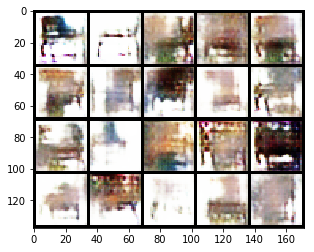

Epoch 90: Train D loss: -0.2987, G loss: 0.2499
Epoch 91: Train D loss: -0.2878, G loss: 0.2486
Epoch 92: Train D loss: -0.2959, G loss: 0.2479
Epoch 93: Train D loss: -0.2893, G loss: 0.2274
Epoch 94: Train D loss: -0.2845, G loss: 0.2575
Epoch 95: Train D loss: -0.2459, G loss: 0.2543
Epoch 96: Train D loss: -0.2867, G loss: 0.2407
Epoch 97: Train D loss: -0.2933, G loss: 0.2328
Epoch 98: Train D loss: -0.2611, G loss: 0.2413
Epoch 99: Train D loss: -0.2330, G loss: 0.2326


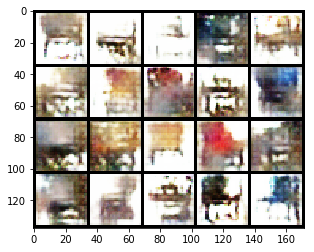

Epoch 100: Train D loss: -0.2752, G loss: 0.2580
Epoch 101: Train D loss: -0.3046, G loss: 0.2500
Epoch 102: Train D loss: -0.2271, G loss: 0.2025
Epoch 103: Train D loss: -0.2936, G loss: 0.2491
Epoch 104: Train D loss: -0.3103, G loss: 0.2393
Epoch 105: Train D loss: -0.2584, G loss: 0.2387
Epoch 106: Train D loss: -0.2746, G loss: 0.2388
Epoch 107: Train D loss: -0.3019, G loss: 0.2391
Epoch 108: Train D loss: -0.2758, G loss: 0.2394
Epoch 109: Train D loss: -0.2487, G loss: 0.2047


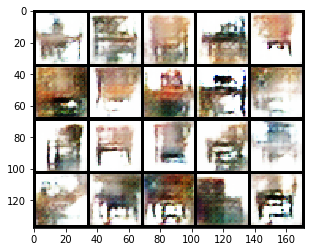

Epoch 110: Train D loss: -0.3053, G loss: 0.2085
Epoch 111: Train D loss: -0.2631, G loss: 0.2286
Epoch 112: Train D loss: -0.2708, G loss: 0.2220
Epoch 113: Train D loss: -0.2730, G loss: 0.2544
Epoch 114: Train D loss: -0.2533, G loss: 0.2335
Epoch 115: Train D loss: -0.2542, G loss: 0.2224
Epoch 116: Train D loss: -0.2603, G loss: 0.2393
Epoch 117: Train D loss: -0.2590, G loss: 0.2144
Epoch 118: Train D loss: -0.2516, G loss: 0.2405
Epoch 119: Train D loss: -0.2870, G loss: 0.2500


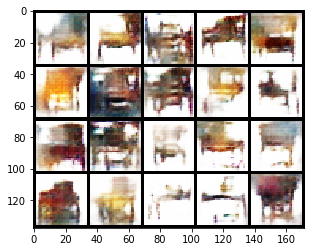

Epoch 120: Train D loss: -0.2705, G loss: 0.1990
Epoch 121: Train D loss: -0.2730, G loss: 0.2064
Epoch 122: Train D loss: -0.2445, G loss: 0.1795
Epoch 123: Train D loss: -0.2970, G loss: 0.2388
Epoch 124: Train D loss: -0.2843, G loss: 0.2240
Epoch 125: Train D loss: -0.2714, G loss: 0.2280
Epoch 126: Train D loss: -0.2950, G loss: 0.2455
Epoch 127: Train D loss: -0.2629, G loss: 0.2175
Epoch 128: Train D loss: -0.3038, G loss: 0.2297
Epoch 129: Train D loss: -0.2691, G loss: 0.2419


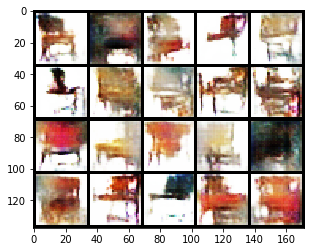

Epoch 130: Train D loss: -0.2612, G loss: 0.2156
Epoch 131: Train D loss: -0.2458, G loss: 0.2405
Epoch 132: Train D loss: -0.2476, G loss: 0.2165
Epoch 133: Train D loss: -0.3012, G loss: 0.2424
Epoch 134: Train D loss: -0.2524, G loss: 0.2173
Epoch 135: Train D loss: -0.2690, G loss: 0.1982
Epoch 136: Train D loss: -0.2581, G loss: 0.2141
Epoch 137: Train D loss: -0.2464, G loss: 0.1864
Epoch 138: Train D loss: -0.3332, G loss: 0.2547
Epoch 139: Train D loss: -0.2742, G loss: 0.2425


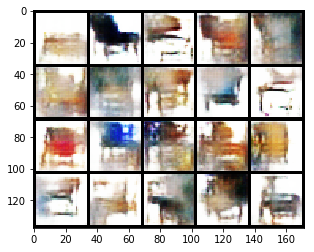

Epoch 140: Train D loss: -0.2592, G loss: 0.1909
Epoch 141: Train D loss: -0.2847, G loss: 0.2297
Epoch 142: Train D loss: -0.2445, G loss: 0.2279
Epoch 143: Train D loss: -0.2644, G loss: 0.2039
Epoch 144: Train D loss: -0.2609, G loss: 0.2323
Epoch 145: Train D loss: -0.2672, G loss: 0.2301
Epoch 146: Train D loss: -0.2702, G loss: 0.2054
Epoch 147: Train D loss: -0.2671, G loss: 0.2281
Epoch 148: Train D loss: -0.2626, G loss: 0.2283
Epoch 149: Train D loss: -0.2665, G loss: 0.2149


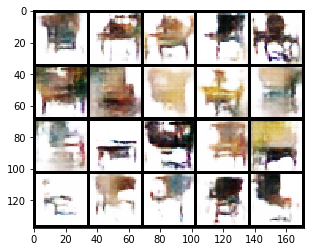

Epoch 150: Train D loss: -0.2547, G loss: 0.1952
Epoch 151: Train D loss: -0.2710, G loss: 0.2215
Epoch 152: Train D loss: -0.2471, G loss: 0.1940
Epoch 153: Train D loss: -0.2420, G loss: 0.2155
Epoch 154: Train D loss: -0.3021, G loss: 0.2454
Epoch 155: Train D loss: -0.2281, G loss: 0.2036
Epoch 156: Train D loss: -0.2397, G loss: 0.2164
Epoch 157: Train D loss: -0.2494, G loss: 0.2004
Epoch 158: Train D loss: -0.2283, G loss: 0.2150
Epoch 159: Train D loss: -0.2501, G loss: 0.2317


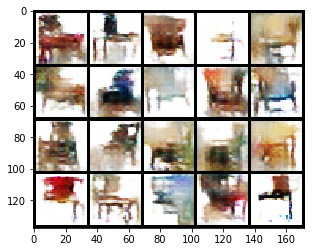

Epoch 160: Train D loss: -0.2581, G loss: 0.2221
Epoch 161: Train D loss: -0.2379, G loss: 0.1776
Epoch 162: Train D loss: -0.2369, G loss: 0.2246
Epoch 163: Train D loss: -0.2390, G loss: 0.2162
Epoch 164: Train D loss: -0.2335, G loss: 0.2078
Epoch 165: Train D loss: -0.2551, G loss: 0.2171
Epoch 166: Train D loss: -0.2383, G loss: 0.2071
Epoch 167: Train D loss: -0.2089, G loss: 0.2015
Epoch 168: Train D loss: -0.2487, G loss: 0.1944
Epoch 169: Train D loss: -0.2733, G loss: 0.2238


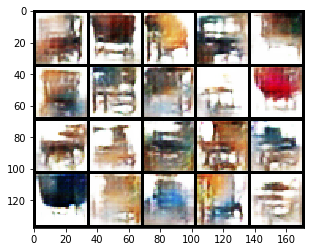

Epoch 170: Train D loss: -0.2152, G loss: 0.1978
Epoch 171: Train D loss: -0.2600, G loss: 0.2059
Epoch 172: Train D loss: -0.2267, G loss: 0.2037
Epoch 173: Train D loss: -0.2525, G loss: 0.2234
Epoch 174: Train D loss: -0.2443, G loss: 0.1889
Epoch 175: Train D loss: -0.2521, G loss: 0.2349
Epoch 176: Train D loss: -0.2540, G loss: 0.2194
Epoch 177: Train D loss: -0.2437, G loss: 0.1835
Epoch 178: Train D loss: -0.2454, G loss: 0.2086
Epoch 179: Train D loss: -0.2667, G loss: 0.2106


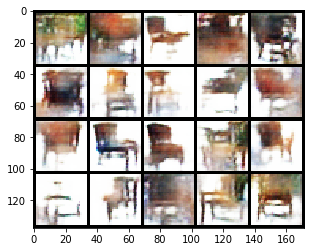

Epoch 180: Train D loss: -0.2288, G loss: 0.2178
Epoch 181: Train D loss: -0.2671, G loss: 0.1872
Epoch 182: Train D loss: -0.2641, G loss: 0.2252
Epoch 183: Train D loss: -0.2403, G loss: 0.2143
Epoch 184: Train D loss: -0.2465, G loss: 0.1964
Epoch 185: Train D loss: -0.2665, G loss: 0.2154
Epoch 186: Train D loss: -0.2251, G loss: 0.1763
Epoch 187: Train D loss: -0.2400, G loss: 0.2112
Epoch 188: Train D loss: -0.2392, G loss: 0.1885
Epoch 189: Train D loss: -0.2268, G loss: 0.1991


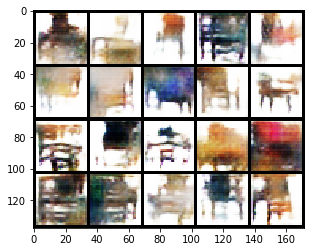

Epoch 190: Train D loss: -0.2212, G loss: 0.1619
Epoch 191: Train D loss: -0.2252, G loss: 0.1800
Epoch 192: Train D loss: -0.2267, G loss: 0.1955
Epoch 193: Train D loss: -0.2064, G loss: 0.1651
Epoch 194: Train D loss: -0.2628, G loss: 0.2253
Epoch 195: Train D loss: -0.2360, G loss: 0.1728
Epoch 196: Train D loss: -0.2576, G loss: 0.2118
Epoch 197: Train D loss: -0.2048, G loss: 0.1839
Epoch 198: Train D loss: -0.2467, G loss: 0.2184
Epoch 199: Train D loss: -0.2200, G loss: 0.1926


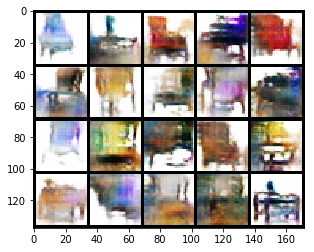

Epoch 200: Train D loss: -0.2260, G loss: 0.1813
Epoch 201: Train D loss: -0.2349, G loss: 0.1843
Epoch 202: Train D loss: -0.2391, G loss: 0.2067
Epoch 203: Train D loss: -0.2140, G loss: 0.1933
Epoch 204: Train D loss: -0.2003, G loss: 0.1979
Epoch 205: Train D loss: -0.2291, G loss: 0.2111
Epoch 206: Train D loss: -0.2137, G loss: 0.1815
Epoch 207: Train D loss: -0.2386, G loss: 0.2041
Epoch 208: Train D loss: -0.2345, G loss: 0.1944
Epoch 209: Train D loss: -0.2038, G loss: 0.1834


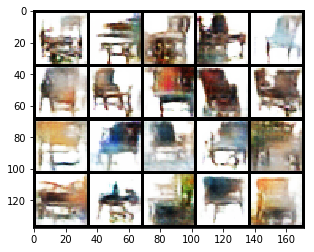

Epoch 210: Train D loss: -0.2360, G loss: 0.1829
Epoch 211: Train D loss: -0.2011, G loss: 0.1993
Epoch 212: Train D loss: -0.2258, G loss: 0.1849
Epoch 213: Train D loss: -0.2068, G loss: 0.1721
Epoch 214: Train D loss: -0.2341, G loss: 0.2042
Epoch 215: Train D loss: -0.2149, G loss: 0.1731
Epoch 216: Train D loss: -0.2149, G loss: 0.1846
Epoch 217: Train D loss: -0.2044, G loss: 0.2031
Epoch 218: Train D loss: -0.2081, G loss: 0.1610
Epoch 219: Train D loss: -0.2241, G loss: 0.2150


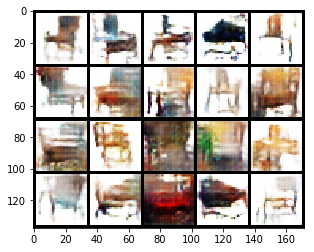

Epoch 220: Train D loss: -0.2149, G loss: 0.1748
Epoch 221: Train D loss: -0.2159, G loss: 0.2081
Epoch 222: Train D loss: -0.2103, G loss: 0.1751
Epoch 223: Train D loss: -0.2202, G loss: 0.1899
Epoch 224: Train D loss: -0.2297, G loss: 0.1883
Epoch 225: Train D loss: -0.2109, G loss: 0.1908
Epoch 226: Train D loss: -0.2114, G loss: 0.1902
Epoch 227: Train D loss: -0.2045, G loss: 0.1934
Epoch 228: Train D loss: -0.2153, G loss: 0.1955
Epoch 229: Train D loss: -0.1982, G loss: 0.1857


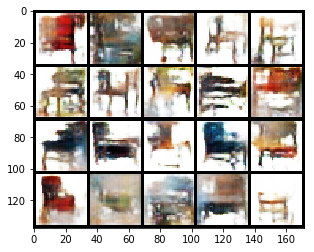

Epoch 230: Train D loss: -0.2178, G loss: 0.1489
Epoch 231: Train D loss: -0.2290, G loss: 0.1702
Epoch 232: Train D loss: -0.1897, G loss: 0.1650
Epoch 233: Train D loss: -0.2131, G loss: 0.1879
Epoch 234: Train D loss: -0.2127, G loss: 0.1809
Epoch 235: Train D loss: -0.2137, G loss: 0.1712
Epoch 236: Train D loss: -0.2038, G loss: 0.1974
Epoch 237: Train D loss: -0.2186, G loss: 0.1911
Epoch 238: Train D loss: -0.2205, G loss: 0.1786
Epoch 239: Train D loss: -0.2156, G loss: 0.1881


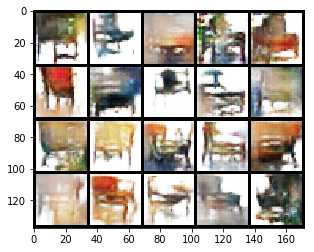

Epoch 240: Train D loss: -0.2217, G loss: 0.1877
Epoch 241: Train D loss: -0.2084, G loss: 0.1566
Epoch 242: Train D loss: -0.2091, G loss: 0.1806
Epoch 243: Train D loss: -0.2118, G loss: 0.1885
Epoch 244: Train D loss: -0.2157, G loss: 0.1650
Epoch 245: Train D loss: -0.2053, G loss: 0.1836
Epoch 246: Train D loss: -0.2049, G loss: 0.1759
Epoch 247: Train D loss: -0.2002, G loss: 0.1469
Epoch 248: Train D loss: -0.2091, G loss: 0.2050
Epoch 249: Train D loss: -0.2235, G loss: 0.1805


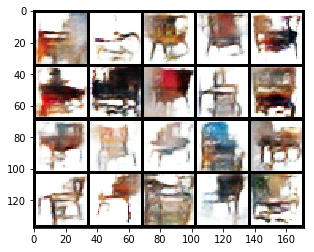

Epoch 250: Train D loss: -0.2100, G loss: 0.1974
Epoch 251: Train D loss: -0.2045, G loss: 0.1594
Epoch 252: Train D loss: -0.2265, G loss: 0.1808
Epoch 253: Train D loss: -0.1854, G loss: 0.1824
Epoch 254: Train D loss: -0.2069, G loss: 0.1799
Epoch 255: Train D loss: -0.2161, G loss: 0.1862
Epoch 256: Train D loss: -0.1982, G loss: 0.1589
Epoch 257: Train D loss: -0.2182, G loss: 0.2005
Epoch 258: Train D loss: -0.1820, G loss: 0.1619
Epoch 259: Train D loss: -0.1840, G loss: 0.1814


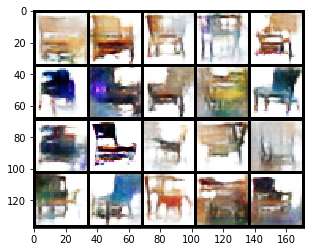

Epoch 260: Train D loss: -0.2215, G loss: 0.1975
Epoch 261: Train D loss: -0.2107, G loss: 0.1798
Epoch 262: Train D loss: -0.2018, G loss: 0.1776
Epoch 263: Train D loss: -0.2077, G loss: 0.1860
Epoch 264: Train D loss: -0.2088, G loss: 0.1923
Epoch 265: Train D loss: -0.1882, G loss: 0.1708
Epoch 266: Train D loss: -0.1880, G loss: 0.1517
Epoch 267: Train D loss: -0.2125, G loss: 0.1890
Epoch 268: Train D loss: -0.2077, G loss: 0.2001
Epoch 269: Train D loss: -0.1707, G loss: 0.1385


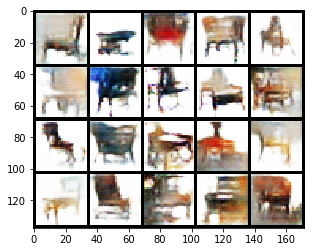

Epoch 270: Train D loss: -0.2195, G loss: 0.1882
Epoch 271: Train D loss: -0.2142, G loss: 0.1994
Epoch 272: Train D loss: -0.1945, G loss: 0.1898
Epoch 273: Train D loss: -0.1796, G loss: 0.1636
Epoch 274: Train D loss: -0.1795, G loss: 0.2012
Epoch 275: Train D loss: -0.2158, G loss: 0.1772
Epoch 276: Train D loss: -0.2005, G loss: 0.1804
Epoch 277: Train D loss: -0.1869, G loss: 0.1765
Epoch 278: Train D loss: -0.1910, G loss: 0.1445
Epoch 279: Train D loss: -0.2042, G loss: 0.1998


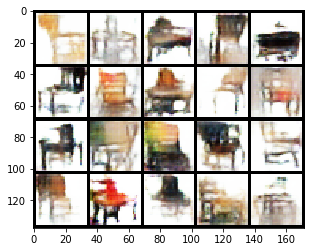

Epoch 280: Train D loss: -0.1935, G loss: 0.1469
Epoch 281: Train D loss: -0.1898, G loss: 0.1744
Epoch 282: Train D loss: -0.2053, G loss: 0.1670
Epoch 283: Train D loss: -0.1698, G loss: 0.1537
Epoch 284: Train D loss: -0.2034, G loss: 0.1827
Epoch 285: Train D loss: -0.1979, G loss: 0.1672
Epoch 286: Train D loss: -0.2262, G loss: 0.2066
Epoch 287: Train D loss: -0.1793, G loss: 0.1393
Epoch 288: Train D loss: -0.1881, G loss: 0.1941
Epoch 289: Train D loss: -0.1920, G loss: 0.1913


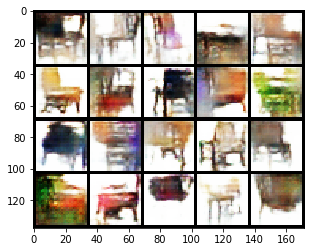

Epoch 290: Train D loss: -0.1804, G loss: 0.1910
Epoch 291: Train D loss: -0.1847, G loss: 0.1696
Epoch 292: Train D loss: -0.2085, G loss: 0.1738
Epoch 293: Train D loss: -0.1961, G loss: 0.1628
Epoch 294: Train D loss: -0.1941, G loss: 0.1490
Epoch 295: Train D loss: -0.2061, G loss: 0.1870
Epoch 296: Train D loss: -0.1917, G loss: 0.1765
Epoch 297: Train D loss: -0.2166, G loss: 0.1809
Epoch 298: Train D loss: -0.1923, G loss: 0.1827
Epoch 299: Train D loss: -0.1698, G loss: 0.1488


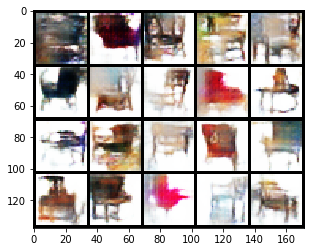

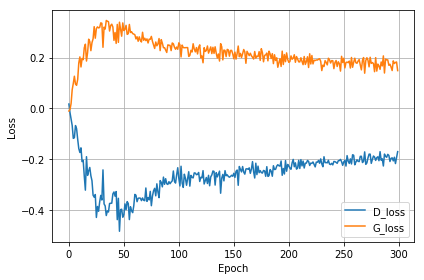

In [43]:
n_d = 1

# G and D model, use DCGAN, note that sigmoid is removed in D
G = DCGenerator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = DCDiscriminator(image_size=image_size, input_channel=image_channel, sigmoid=False).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

d_loss_hist, g_loss_hist = run_wgan(trainloader, G, D, G_optimizer, D_optimizer, n_epochs, device, 
                                    latent_dim, n_d, weight_clip)

loss_plot(d_loss_hist, g_loss_hist)

Epoch 0: Train D loss: 0.0001, G loss: 0.0040


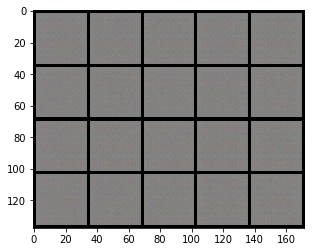

Epoch 1: Train D loss: -0.0799, G loss: 0.0251
Epoch 2: Train D loss: -0.1817, G loss: 0.1060
Epoch 3: Train D loss: -0.3695, G loss: 0.2162
Epoch 4: Train D loss: -0.5086, G loss: 0.2836
Epoch 5: Train D loss: -0.5816, G loss: 0.3244
Epoch 6: Train D loss: -0.7668, G loss: 0.3885
Epoch 7: Train D loss: -0.8112, G loss: 0.4281
Epoch 8: Train D loss: -0.9679, G loss: 0.4721
Epoch 9: Train D loss: -1.0464, G loss: 0.5036


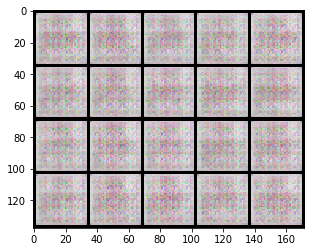

Epoch 10: Train D loss: -1.1027, G loss: 0.5267
Epoch 11: Train D loss: -1.1555, G loss: 0.5464
Epoch 12: Train D loss: -1.1611, G loss: 0.5547
Epoch 13: Train D loss: -1.1576, G loss: 0.5569
Epoch 14: Train D loss: -0.9171, G loss: 0.4423
Epoch 15: Train D loss: -0.6505, G loss: 0.3648
Epoch 16: Train D loss: -0.8878, G loss: 0.4909
Epoch 17: Train D loss: -0.8990, G loss: 0.5233
Epoch 18: Train D loss: -1.0586, G loss: 0.5272
Epoch 19: Train D loss: -1.0806, G loss: 0.5269


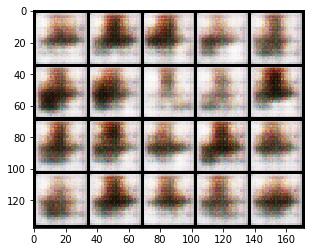

Epoch 20: Train D loss: -1.0441, G loss: 0.5417
Epoch 21: Train D loss: -1.0630, G loss: 0.5539
Epoch 22: Train D loss: -0.9869, G loss: 0.4894
Epoch 23: Train D loss: -0.9223, G loss: 0.4549
Epoch 24: Train D loss: -0.8161, G loss: 0.4091
Epoch 25: Train D loss: -0.8223, G loss: 0.4319
Epoch 26: Train D loss: -0.9072, G loss: 0.4754
Epoch 27: Train D loss: -0.7969, G loss: 0.4122
Epoch 28: Train D loss: -0.8455, G loss: 0.4133
Epoch 29: Train D loss: -0.8861, G loss: 0.4418


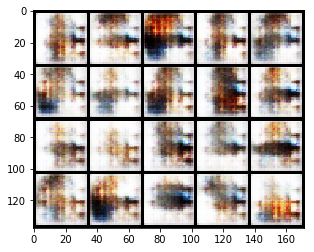

Epoch 30: Train D loss: -0.8085, G loss: 0.4329
Epoch 31: Train D loss: -0.8609, G loss: 0.4504
Epoch 32: Train D loss: -0.7310, G loss: 0.3744
Epoch 33: Train D loss: -0.9319, G loss: 0.4849
Epoch 34: Train D loss: -0.7824, G loss: 0.4290
Epoch 35: Train D loss: -0.8480, G loss: 0.4375
Epoch 36: Train D loss: -0.7814, G loss: 0.4280
Epoch 37: Train D loss: -0.8082, G loss: 0.4308
Epoch 38: Train D loss: -0.7348, G loss: 0.3785
Epoch 39: Train D loss: -0.9306, G loss: 0.4932


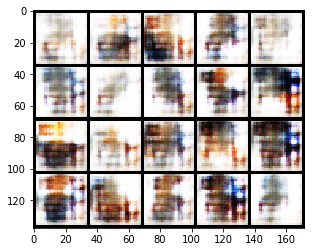

Epoch 40: Train D loss: -0.7447, G loss: 0.3967
Epoch 41: Train D loss: -0.7567, G loss: 0.3680
Epoch 42: Train D loss: -0.7565, G loss: 0.3863
Epoch 43: Train D loss: -0.8716, G loss: 0.4441
Epoch 44: Train D loss: -0.7140, G loss: 0.3671
Epoch 45: Train D loss: -0.8251, G loss: 0.4664
Epoch 46: Train D loss: -0.7926, G loss: 0.3863
Epoch 47: Train D loss: -0.7494, G loss: 0.3981
Epoch 48: Train D loss: -0.8326, G loss: 0.4194
Epoch 49: Train D loss: -0.7516, G loss: 0.3871


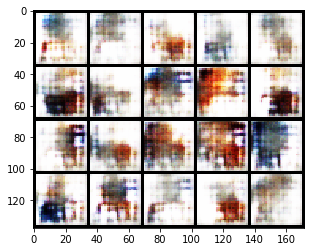

Epoch 50: Train D loss: -0.8261, G loss: 0.3931
Epoch 51: Train D loss: -0.7871, G loss: 0.4233
Epoch 52: Train D loss: -0.8196, G loss: 0.4644
Epoch 53: Train D loss: -0.8115, G loss: 0.4690
Epoch 54: Train D loss: -0.7636, G loss: 0.3835
Epoch 55: Train D loss: -0.8334, G loss: 0.4483
Epoch 56: Train D loss: -0.8003, G loss: 0.4508
Epoch 57: Train D loss: -0.7647, G loss: 0.4009
Epoch 58: Train D loss: -0.7447, G loss: 0.3956
Epoch 59: Train D loss: -0.7343, G loss: 0.3931


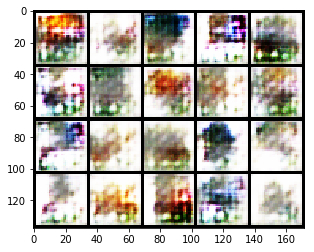

Epoch 60: Train D loss: -0.7775, G loss: 0.4239
Epoch 61: Train D loss: -0.6904, G loss: 0.3746
Epoch 62: Train D loss: -0.7559, G loss: 0.4324
Epoch 63: Train D loss: -0.6637, G loss: 0.3217
Epoch 64: Train D loss: -0.6693, G loss: 0.3783
Epoch 65: Train D loss: -0.7983, G loss: 0.4496
Epoch 66: Train D loss: -0.6869, G loss: 0.4151
Epoch 67: Train D loss: -0.7340, G loss: 0.4568
Epoch 68: Train D loss: -0.6794, G loss: 0.3637
Epoch 69: Train D loss: -0.7388, G loss: 0.4501


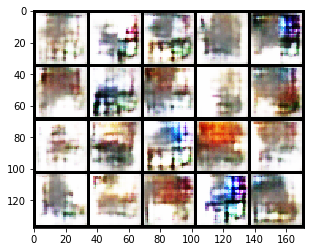

Epoch 70: Train D loss: -0.7118, G loss: 0.3885
Epoch 71: Train D loss: -0.7157, G loss: 0.4154
Epoch 72: Train D loss: -0.7008, G loss: 0.4059
Epoch 73: Train D loss: -0.6210, G loss: 0.2917
Epoch 74: Train D loss: -0.7428, G loss: 0.4299
Epoch 75: Train D loss: -0.7133, G loss: 0.4080
Epoch 76: Train D loss: -0.7062, G loss: 0.3987
Epoch 77: Train D loss: -0.6074, G loss: 0.3256
Epoch 78: Train D loss: -0.7412, G loss: 0.4180
Epoch 79: Train D loss: -0.6645, G loss: 0.4017


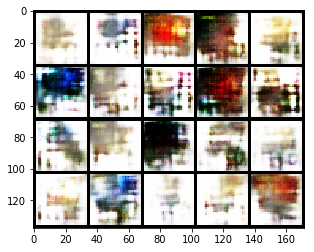

Epoch 80: Train D loss: -0.7058, G loss: 0.3941
Epoch 81: Train D loss: -0.6498, G loss: 0.3810
Epoch 82: Train D loss: -0.7218, G loss: 0.3912
Epoch 83: Train D loss: -0.6572, G loss: 0.3798
Epoch 84: Train D loss: -0.6561, G loss: 0.3215
Epoch 85: Train D loss: -0.6371, G loss: 0.3027
Epoch 86: Train D loss: -0.7183, G loss: 0.3926
Epoch 87: Train D loss: -0.6892, G loss: 0.3974
Epoch 88: Train D loss: -0.6114, G loss: 0.3535
Epoch 89: Train D loss: -0.6730, G loss: 0.3584


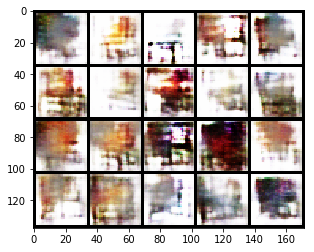

Epoch 90: Train D loss: -0.6491, G loss: 0.4109
Epoch 91: Train D loss: -0.5890, G loss: 0.3310
Epoch 92: Train D loss: -0.6934, G loss: 0.3658
Epoch 93: Train D loss: -0.6558, G loss: 0.3629
Epoch 94: Train D loss: -0.6760, G loss: 0.4028
Epoch 95: Train D loss: -0.5954, G loss: 0.3174
Epoch 96: Train D loss: -0.6416, G loss: 0.3633
Epoch 97: Train D loss: -0.6154, G loss: 0.2995
Epoch 98: Train D loss: -0.6476, G loss: 0.3566
Epoch 99: Train D loss: -0.6413, G loss: 0.3848


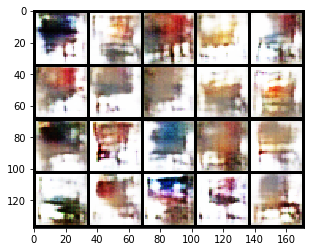

Epoch 100: Train D loss: -0.6498, G loss: 0.3524
Epoch 101: Train D loss: -0.6292, G loss: 0.3905
Epoch 102: Train D loss: -0.6246, G loss: 0.3027
Epoch 103: Train D loss: -0.6287, G loss: 0.3458
Epoch 104: Train D loss: -0.6286, G loss: 0.3288
Epoch 105: Train D loss: -0.6020, G loss: 0.3157
Epoch 106: Train D loss: -0.5734, G loss: 0.2961
Epoch 107: Train D loss: -0.5838, G loss: 0.3465
Epoch 108: Train D loss: -0.6156, G loss: 0.3015
Epoch 109: Train D loss: -0.5982, G loss: 0.3417


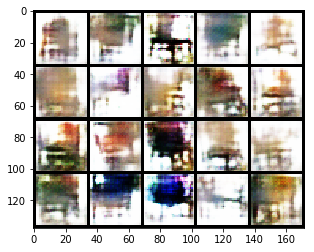

Epoch 110: Train D loss: -0.5904, G loss: 0.2957
Epoch 111: Train D loss: -0.6103, G loss: 0.3442
Epoch 112: Train D loss: -0.6058, G loss: 0.3291
Epoch 113: Train D loss: -0.5828, G loss: 0.3157
Epoch 114: Train D loss: -0.6086, G loss: 0.3414
Epoch 115: Train D loss: -0.5534, G loss: 0.3240
Epoch 116: Train D loss: -0.6188, G loss: 0.3657
Epoch 117: Train D loss: -0.6265, G loss: 0.3856
Epoch 118: Train D loss: -0.5898, G loss: 0.3483
Epoch 119: Train D loss: -0.5765, G loss: 0.3112


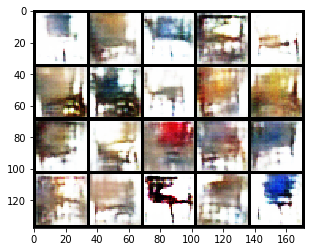

Epoch 120: Train D loss: -0.6229, G loss: 0.3592
Epoch 121: Train D loss: -0.5545, G loss: 0.3118
Epoch 122: Train D loss: -0.6110, G loss: 0.3723
Epoch 123: Train D loss: -0.5536, G loss: 0.2864
Epoch 124: Train D loss: -0.5968, G loss: 0.4056
Epoch 125: Train D loss: -0.5836, G loss: 0.3024
Epoch 126: Train D loss: -0.5739, G loss: 0.2997
Epoch 127: Train D loss: -0.6046, G loss: 0.3402
Epoch 128: Train D loss: -0.5931, G loss: 0.3525
Epoch 129: Train D loss: -0.5480, G loss: 0.2625


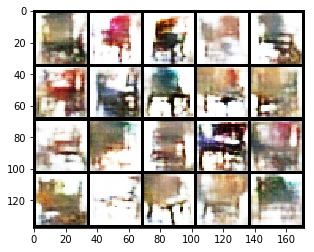

Epoch 130: Train D loss: -0.5855, G loss: 0.3258
Epoch 131: Train D loss: -0.5555, G loss: 0.2786
Epoch 132: Train D loss: -0.5603, G loss: 0.2937
Epoch 133: Train D loss: -0.5662, G loss: 0.3408
Epoch 134: Train D loss: -0.5645, G loss: 0.3479
Epoch 135: Train D loss: -0.5598, G loss: 0.2685
Epoch 136: Train D loss: -0.5644, G loss: 0.2810
Epoch 137: Train D loss: -0.5759, G loss: 0.3205
Epoch 138: Train D loss: -0.5506, G loss: 0.3055
Epoch 139: Train D loss: -0.5696, G loss: 0.3647


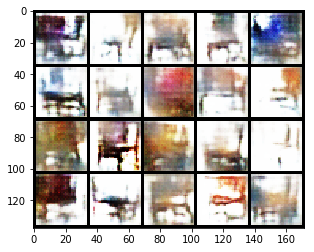

Epoch 140: Train D loss: -0.5813, G loss: 0.3516
Epoch 141: Train D loss: -0.5307, G loss: 0.2229
Epoch 142: Train D loss: -0.5462, G loss: 0.3536
Epoch 143: Train D loss: -0.5509, G loss: 0.3389
Epoch 144: Train D loss: -0.5638, G loss: 0.3419
Epoch 145: Train D loss: -0.5350, G loss: 0.3447
Epoch 146: Train D loss: -0.5716, G loss: 0.3041
Epoch 147: Train D loss: -0.5306, G loss: 0.3383
Epoch 148: Train D loss: -0.5926, G loss: 0.3573
Epoch 149: Train D loss: -0.5023, G loss: 0.2863


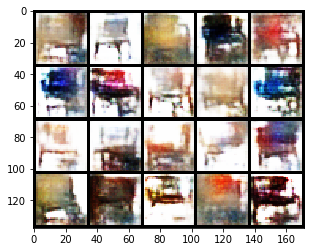

Epoch 150: Train D loss: -0.5643, G loss: 0.3612
Epoch 151: Train D loss: -0.5289, G loss: 0.3009
Epoch 152: Train D loss: -0.5299, G loss: 0.2505
Epoch 153: Train D loss: -0.5613, G loss: 0.3220
Epoch 154: Train D loss: -0.5501, G loss: 0.3466
Epoch 155: Train D loss: -0.5074, G loss: 0.2174
Epoch 156: Train D loss: -0.5711, G loss: 0.3405
Epoch 157: Train D loss: -0.5301, G loss: 0.3076
Epoch 158: Train D loss: -0.5352, G loss: 0.3307
Epoch 159: Train D loss: -0.5067, G loss: 0.3062


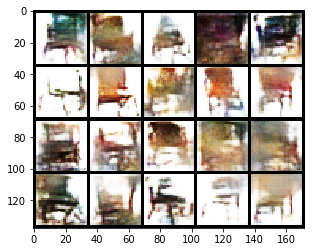

Epoch 160: Train D loss: -0.5627, G loss: 0.3743
Epoch 161: Train D loss: -0.5141, G loss: 0.3321
Epoch 162: Train D loss: -0.5005, G loss: 0.2515
Epoch 163: Train D loss: -0.5268, G loss: 0.3518
Epoch 164: Train D loss: -0.5634, G loss: 0.2876
Epoch 165: Train D loss: -0.4801, G loss: 0.2810
Epoch 166: Train D loss: -0.5574, G loss: 0.2733
Epoch 167: Train D loss: -0.5094, G loss: 0.3030
Epoch 168: Train D loss: -0.5055, G loss: 0.3523
Epoch 169: Train D loss: -0.5445, G loss: 0.3209


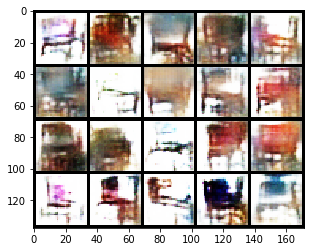

Epoch 170: Train D loss: -0.4752, G loss: 0.2571
Epoch 171: Train D loss: -0.5731, G loss: 0.3768
Epoch 172: Train D loss: -0.4855, G loss: 0.2316
Epoch 173: Train D loss: -0.5039, G loss: 0.2434
Epoch 174: Train D loss: -0.5162, G loss: 0.2452
Epoch 175: Train D loss: -0.4908, G loss: 0.2636
Epoch 176: Train D loss: -0.5585, G loss: 0.3378
Epoch 177: Train D loss: -0.4903, G loss: 0.2487
Epoch 178: Train D loss: -0.4944, G loss: 0.2302
Epoch 179: Train D loss: -0.5334, G loss: 0.3544


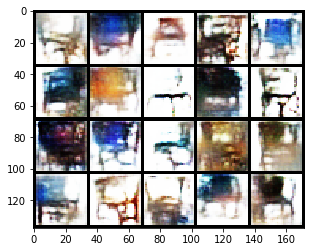

Epoch 180: Train D loss: -0.4573, G loss: 0.2732
Epoch 181: Train D loss: -0.5286, G loss: 0.2909
Epoch 182: Train D loss: -0.5135, G loss: 0.2704
Epoch 183: Train D loss: -0.4965, G loss: 0.3540
Epoch 184: Train D loss: -0.4793, G loss: 0.1822
Epoch 185: Train D loss: -0.5234, G loss: 0.3279
Epoch 186: Train D loss: -0.4788, G loss: 0.2217
Epoch 187: Train D loss: -0.5193, G loss: 0.2473
Epoch 188: Train D loss: -0.5253, G loss: 0.3310
Epoch 189: Train D loss: -0.5286, G loss: 0.3214


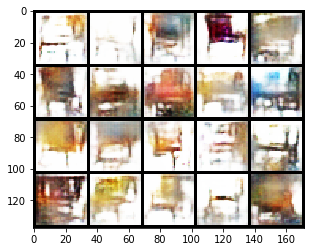

Epoch 190: Train D loss: -0.4856, G loss: 0.2567
Epoch 191: Train D loss: -0.5748, G loss: 0.3706
Epoch 192: Train D loss: -0.5103, G loss: 0.2599
Epoch 193: Train D loss: -0.4791, G loss: 0.2528
Epoch 194: Train D loss: -0.4934, G loss: 0.2814
Epoch 195: Train D loss: -0.4750, G loss: 0.2332
Epoch 196: Train D loss: -0.5056, G loss: 0.2129
Epoch 197: Train D loss: -0.5135, G loss: 0.3407
Epoch 198: Train D loss: -0.4946, G loss: 0.3399
Epoch 199: Train D loss: -0.4856, G loss: 0.3404


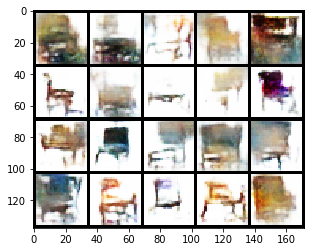

Epoch 200: Train D loss: -0.4676, G loss: 0.2495
Epoch 201: Train D loss: -0.4942, G loss: 0.2169
Epoch 202: Train D loss: -0.4845, G loss: 0.2345
Epoch 203: Train D loss: -0.4896, G loss: 0.3123
Epoch 204: Train D loss: -0.5006, G loss: 0.3143
Epoch 205: Train D loss: -0.4973, G loss: 0.3283
Epoch 206: Train D loss: -0.4857, G loss: 0.2072
Epoch 207: Train D loss: -0.4847, G loss: 0.3388
Epoch 208: Train D loss: -0.4728, G loss: 0.2141
Epoch 209: Train D loss: -0.5134, G loss: 0.3102


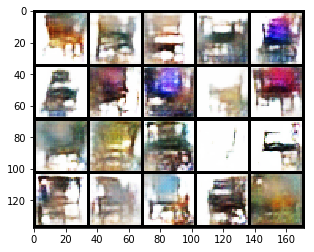

Epoch 210: Train D loss: -0.4668, G loss: 0.2761
Epoch 211: Train D loss: -0.4783, G loss: 0.2755
Epoch 212: Train D loss: -0.5019, G loss: 0.2951
Epoch 213: Train D loss: -0.4402, G loss: 0.2083
Epoch 214: Train D loss: -0.5077, G loss: 0.2917
Epoch 215: Train D loss: -0.4359, G loss: 0.2257
Epoch 216: Train D loss: -0.4953, G loss: 0.3389
Epoch 217: Train D loss: -0.4837, G loss: 0.3468
Epoch 218: Train D loss: -0.4566, G loss: 0.2685
Epoch 219: Train D loss: -0.4839, G loss: 0.2735


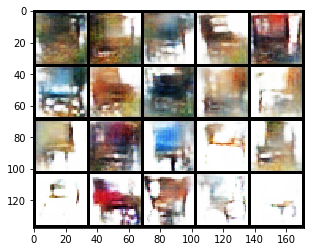

Epoch 220: Train D loss: -0.4788, G loss: 0.2499
Epoch 221: Train D loss: -0.4868, G loss: 0.3135
Epoch 222: Train D loss: -0.4381, G loss: 0.1220
Epoch 223: Train D loss: -0.4666, G loss: 0.2550
Epoch 224: Train D loss: -0.4899, G loss: 0.2779
Epoch 225: Train D loss: -0.4597, G loss: 0.2473
Epoch 226: Train D loss: -0.4731, G loss: 0.2274
Epoch 227: Train D loss: -0.4563, G loss: 0.2897
Epoch 228: Train D loss: -0.4668, G loss: 0.2750
Epoch 229: Train D loss: -0.4709, G loss: 0.2764


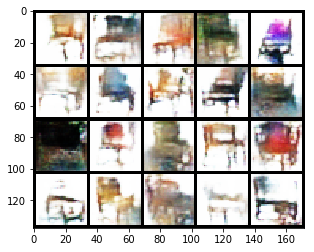

Epoch 230: Train D loss: -0.4380, G loss: 0.1819
Epoch 231: Train D loss: -0.5087, G loss: 0.3300
Epoch 232: Train D loss: -0.4234, G loss: 0.2103
Epoch 233: Train D loss: -0.4724, G loss: 0.2545
Epoch 234: Train D loss: -0.4747, G loss: 0.2903
Epoch 235: Train D loss: -0.4602, G loss: 0.3230
Epoch 236: Train D loss: -0.4556, G loss: 0.3024
Epoch 237: Train D loss: -0.4270, G loss: 0.1851
Epoch 238: Train D loss: -0.4938, G loss: 0.2920
Epoch 239: Train D loss: -0.3951, G loss: 0.1971


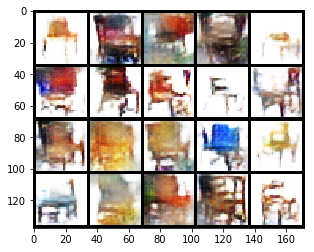

Epoch 240: Train D loss: -0.5317, G loss: 0.3328
Epoch 241: Train D loss: -0.4370, G loss: 0.2795
Epoch 242: Train D loss: -0.4597, G loss: 0.2488
Epoch 243: Train D loss: -0.4604, G loss: 0.2623
Epoch 244: Train D loss: -0.4555, G loss: 0.1559
Epoch 245: Train D loss: -0.4610, G loss: 0.2553
Epoch 246: Train D loss: -0.4053, G loss: 0.0941
Epoch 247: Train D loss: -0.4770, G loss: 0.2939
Epoch 248: Train D loss: -0.4677, G loss: 0.1877
Epoch 249: Train D loss: -0.4493, G loss: 0.3399


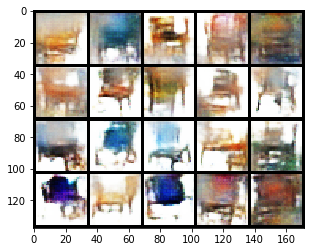

Epoch 250: Train D loss: -0.4797, G loss: 0.2805
Epoch 251: Train D loss: -0.4237, G loss: 0.2087
Epoch 252: Train D loss: -0.4825, G loss: 0.2781
Epoch 253: Train D loss: -0.4127, G loss: 0.2098
Epoch 254: Train D loss: -0.4818, G loss: 0.2961
Epoch 255: Train D loss: -0.4186, G loss: 0.2134
Epoch 256: Train D loss: -0.4400, G loss: 0.2801
Epoch 257: Train D loss: -0.4589, G loss: 0.2294
Epoch 258: Train D loss: -0.4253, G loss: 0.1715
Epoch 259: Train D loss: -0.4733, G loss: 0.2672


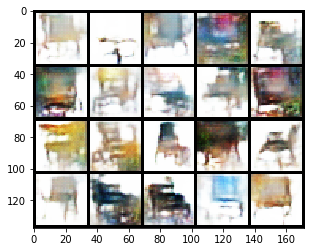

Epoch 260: Train D loss: -0.4361, G loss: 0.3161
Epoch 261: Train D loss: -0.4330, G loss: 0.2492
Epoch 262: Train D loss: -0.4312, G loss: 0.2163
Epoch 263: Train D loss: -0.4561, G loss: 0.2651
Epoch 264: Train D loss: -0.4239, G loss: 0.2527
Epoch 265: Train D loss: -0.4486, G loss: 0.3492
Epoch 266: Train D loss: -0.4456, G loss: 0.3384
Epoch 267: Train D loss: -0.4291, G loss: 0.2706
Epoch 268: Train D loss: -0.4610, G loss: 0.2998
Epoch 269: Train D loss: -0.4553, G loss: 0.3312


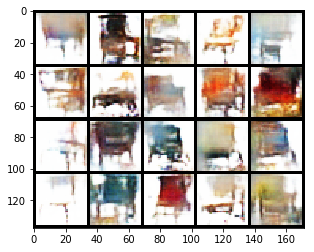

Epoch 270: Train D loss: -0.4241, G loss: 0.2247
Epoch 271: Train D loss: -0.4459, G loss: 0.2946
Epoch 272: Train D loss: -0.4326, G loss: 0.2373
Epoch 273: Train D loss: -0.4522, G loss: 0.2316
Epoch 274: Train D loss: -0.4465, G loss: 0.2296
Epoch 275: Train D loss: -0.4444, G loss: 0.3187
Epoch 276: Train D loss: -0.4421, G loss: 0.2324
Epoch 277: Train D loss: -0.4424, G loss: 0.2421
Epoch 278: Train D loss: -0.4302, G loss: 0.2543
Epoch 279: Train D loss: -0.4466, G loss: 0.2443


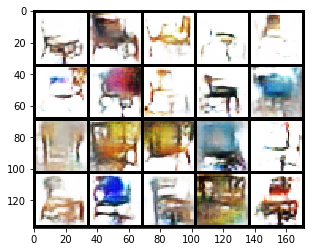

Epoch 280: Train D loss: -0.4180, G loss: 0.3229
Epoch 281: Train D loss: -0.4286, G loss: 0.3120
Epoch 282: Train D loss: -0.4193, G loss: 0.1670
Epoch 283: Train D loss: -0.4579, G loss: 0.1907
Epoch 284: Train D loss: -0.4351, G loss: 0.2761
Epoch 285: Train D loss: -0.4430, G loss: 0.2447
Epoch 286: Train D loss: -0.3986, G loss: 0.1367
Epoch 287: Train D loss: -0.4678, G loss: 0.3007
Epoch 288: Train D loss: -0.4195, G loss: 0.2295
Epoch 289: Train D loss: -0.4214, G loss: 0.1905


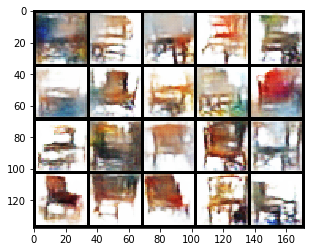

Epoch 290: Train D loss: -0.4307, G loss: 0.1786
Epoch 291: Train D loss: -0.4489, G loss: 0.2180
Epoch 292: Train D loss: -0.4177, G loss: 0.1907
Epoch 293: Train D loss: -0.4767, G loss: 0.2717
Epoch 294: Train D loss: -0.4065, G loss: 0.2679
Epoch 295: Train D loss: -0.4372, G loss: 0.3195
Epoch 296: Train D loss: -0.4373, G loss: 0.2641
Epoch 297: Train D loss: -0.4105, G loss: 0.2284
Epoch 298: Train D loss: -0.4445, G loss: 0.3327
Epoch 299: Train D loss: -0.4059, G loss: 0.2087


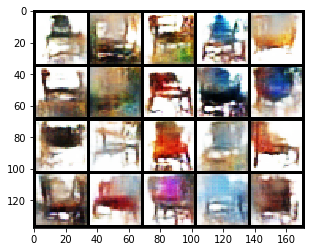

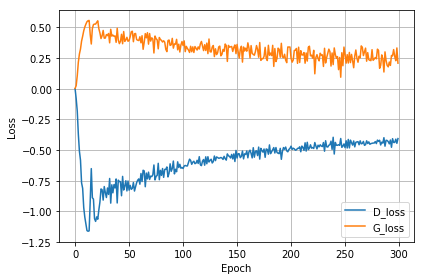

In [44]:
n_d = 3

# G and D model, use DCGAN, note that sigmoid is removed in D
G = DCGenerator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = DCDiscriminator(image_size=image_size, input_channel=image_channel, sigmoid=False).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

d_loss_hist, g_loss_hist = run_wgan(trainloader, G, D, G_optimizer, D_optimizer, n_epochs, device, 
                                    latent_dim, n_d, weight_clip)

loss_plot(d_loss_hist, g_loss_hist)

Epoch 0: Train D loss: -0.0257, G loss: 0.0083


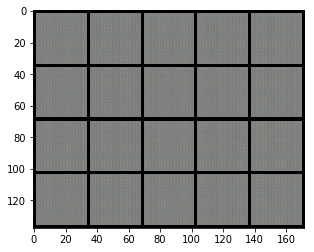

Epoch 1: Train D loss: -0.1135, G loss: 0.0518
Epoch 2: Train D loss: -0.2761, G loss: 0.1568
Epoch 3: Train D loss: -0.4824, G loss: 0.2561
Epoch 4: Train D loss: -0.6565, G loss: 0.3293
Epoch 5: Train D loss: -0.7776, G loss: 0.3902
Epoch 6: Train D loss: -0.8906, G loss: 0.4423
Epoch 7: Train D loss: -0.9590, G loss: 0.4774
Epoch 8: Train D loss: -1.0265, G loss: 0.5073
Epoch 9: Train D loss: -1.0087, G loss: 0.5298


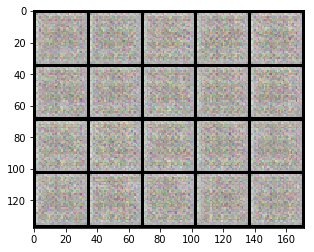

Epoch 10: Train D loss: -1.0948, G loss: 0.5386
Epoch 11: Train D loss: -1.1664, G loss: 0.5605
Epoch 12: Train D loss: -1.1885, G loss: 0.5729
Epoch 13: Train D loss: -1.2236, G loss: 0.5848
Epoch 14: Train D loss: -1.2366, G loss: 0.5937
Epoch 15: Train D loss: -1.2495, G loss: 0.5997
Epoch 16: Train D loss: -1.2696, G loss: 0.6088
Epoch 17: Train D loss: -1.2831, G loss: 0.6143
Epoch 18: Train D loss: -1.2840, G loss: 0.6224
Epoch 19: Train D loss: -1.2693, G loss: 0.6218


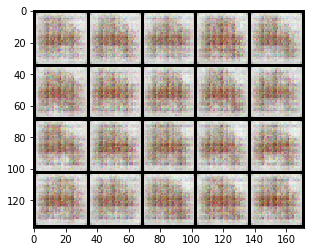

Epoch 20: Train D loss: -1.2756, G loss: 0.6222
Epoch 21: Train D loss: -1.1144, G loss: 0.5341
Epoch 22: Train D loss: -0.8553, G loss: 0.5702
Epoch 23: Train D loss: -1.2333, G loss: 0.6063
Epoch 24: Train D loss: -1.0445, G loss: 0.5786
Epoch 25: Train D loss: -1.1740, G loss: 0.6164
Epoch 26: Train D loss: -1.1886, G loss: 0.6119
Epoch 27: Train D loss: -1.2336, G loss: 0.6194
Epoch 28: Train D loss: -1.2341, G loss: 0.6106
Epoch 29: Train D loss: -0.9256, G loss: 0.4413


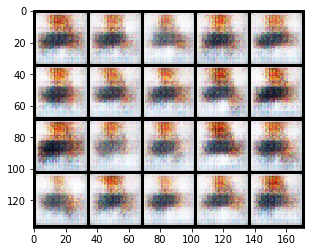

Epoch 30: Train D loss: -0.9491, G loss: 0.5648
Epoch 31: Train D loss: -1.1219, G loss: 0.5704
Epoch 32: Train D loss: -1.1901, G loss: 0.5971
Epoch 33: Train D loss: -1.2016, G loss: 0.6117
Epoch 34: Train D loss: -1.1670, G loss: 0.5855
Epoch 35: Train D loss: -1.1208, G loss: 0.5748
Epoch 36: Train D loss: -0.9962, G loss: 0.5373
Epoch 37: Train D loss: -1.1689, G loss: 0.5844
Epoch 38: Train D loss: -1.2028, G loss: 0.6050
Epoch 39: Train D loss: -1.1546, G loss: 0.5707


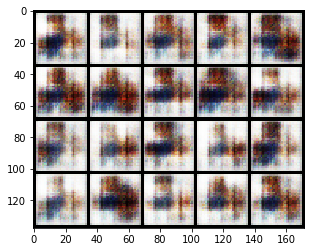

Epoch 40: Train D loss: -1.1414, G loss: 0.5866
Epoch 41: Train D loss: -1.1364, G loss: 0.5784
Epoch 42: Train D loss: -1.1406, G loss: 0.5707
Epoch 43: Train D loss: -1.0624, G loss: 0.5756
Epoch 44: Train D loss: -1.0463, G loss: 0.5687
Epoch 45: Train D loss: -1.1304, G loss: 0.5864
Epoch 46: Train D loss: -1.0665, G loss: 0.5381
Epoch 47: Train D loss: -0.9751, G loss: 0.5526
Epoch 48: Train D loss: -1.0755, G loss: 0.5556
Epoch 49: Train D loss: -1.0226, G loss: 0.5461


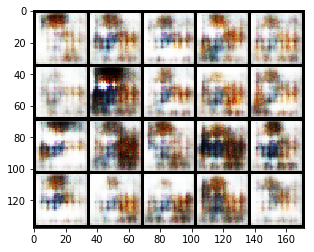

Epoch 50: Train D loss: -1.0780, G loss: 0.5593
Epoch 51: Train D loss: -1.0781, G loss: 0.5691
Epoch 52: Train D loss: -1.0478, G loss: 0.5475
Epoch 53: Train D loss: -0.9821, G loss: 0.5029
Epoch 54: Train D loss: -1.0398, G loss: 0.5421
Epoch 55: Train D loss: -0.9329, G loss: 0.4964
Epoch 56: Train D loss: -0.9272, G loss: 0.4915
Epoch 57: Train D loss: -1.0341, G loss: 0.5544
Epoch 58: Train D loss: -0.8913, G loss: 0.4686
Epoch 59: Train D loss: -0.9362, G loss: 0.4979


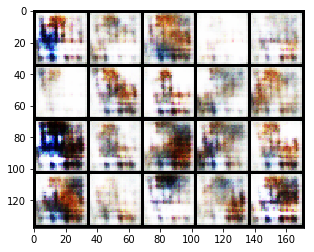

Epoch 60: Train D loss: -0.9151, G loss: 0.5136
Epoch 61: Train D loss: -0.9323, G loss: 0.5254
Epoch 62: Train D loss: -0.9304, G loss: 0.5056
Epoch 63: Train D loss: -0.8985, G loss: 0.5011
Epoch 64: Train D loss: -0.9087, G loss: 0.5064
Epoch 65: Train D loss: -0.9069, G loss: 0.4959
Epoch 66: Train D loss: -0.9127, G loss: 0.5134
Epoch 67: Train D loss: -0.8159, G loss: 0.4509
Epoch 68: Train D loss: -0.9353, G loss: 0.5184
Epoch 69: Train D loss: -0.8755, G loss: 0.4771


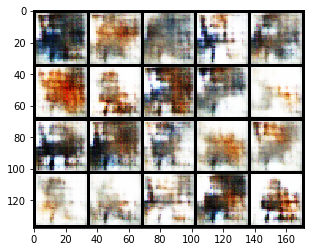

Epoch 70: Train D loss: -0.8768, G loss: 0.4952
Epoch 71: Train D loss: -0.9205, G loss: 0.5061
Epoch 72: Train D loss: -0.8432, G loss: 0.4206
Epoch 73: Train D loss: -0.8829, G loss: 0.5014
Epoch 74: Train D loss: -0.9381, G loss: 0.5141
Epoch 75: Train D loss: -0.7799, G loss: 0.3209
Epoch 76: Train D loss: -0.8718, G loss: 0.4814
Epoch 77: Train D loss: -1.0441, G loss: 0.5298
Epoch 78: Train D loss: -0.8910, G loss: 0.5089
Epoch 79: Train D loss: -0.7108, G loss: 0.3660


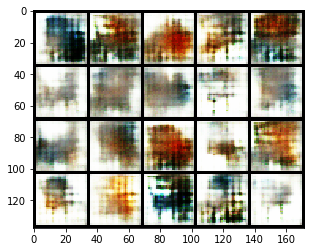

Epoch 80: Train D loss: -0.9409, G loss: 0.5071
Epoch 81: Train D loss: -0.8398, G loss: 0.4809
Epoch 82: Train D loss: -0.8260, G loss: 0.4453
Epoch 83: Train D loss: -0.8398, G loss: 0.4756
Epoch 84: Train D loss: -0.8552, G loss: 0.4524
Epoch 85: Train D loss: -0.8813, G loss: 0.4870
Epoch 86: Train D loss: -0.8545, G loss: 0.4462
Epoch 87: Train D loss: -0.8213, G loss: 0.4738
Epoch 88: Train D loss: -0.8524, G loss: 0.4326
Epoch 89: Train D loss: -0.8728, G loss: 0.4832


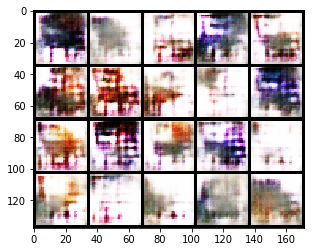

Epoch 90: Train D loss: -0.8764, G loss: 0.4751
Epoch 91: Train D loss: -0.8832, G loss: 0.4944
Epoch 92: Train D loss: -0.8513, G loss: 0.4708
Epoch 93: Train D loss: -0.8170, G loss: 0.4308
Epoch 94: Train D loss: -0.7847, G loss: 0.4334
Epoch 95: Train D loss: -0.8278, G loss: 0.4797
Epoch 96: Train D loss: -0.7984, G loss: 0.4406
Epoch 97: Train D loss: -0.7514, G loss: 0.4145
Epoch 98: Train D loss: -0.8680, G loss: 0.4717
Epoch 99: Train D loss: -0.7138, G loss: 0.4005


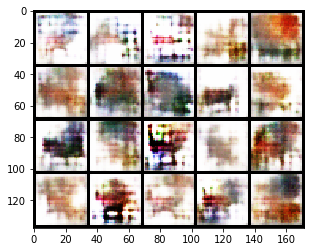

Epoch 100: Train D loss: -0.7786, G loss: 0.4201
Epoch 101: Train D loss: -0.7491, G loss: 0.4792
Epoch 102: Train D loss: -0.8944, G loss: 0.4882
Epoch 103: Train D loss: -0.7807, G loss: 0.4642
Epoch 104: Train D loss: -0.7638, G loss: 0.4084
Epoch 105: Train D loss: -0.7421, G loss: 0.4198
Epoch 106: Train D loss: -0.7910, G loss: 0.4320
Epoch 107: Train D loss: -0.7621, G loss: 0.4329
Epoch 108: Train D loss: -0.7949, G loss: 0.4515
Epoch 109: Train D loss: -0.7785, G loss: 0.4269


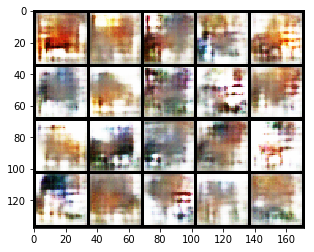

Epoch 110: Train D loss: -0.7769, G loss: 0.4508
Epoch 111: Train D loss: -0.7562, G loss: 0.3834
Epoch 112: Train D loss: -0.8362, G loss: 0.4859
Epoch 113: Train D loss: -0.7771, G loss: 0.4504
Epoch 114: Train D loss: -0.7504, G loss: 0.4132
Epoch 115: Train D loss: -0.7423, G loss: 0.3923
Epoch 116: Train D loss: -0.7782, G loss: 0.3812
Epoch 117: Train D loss: -0.7970, G loss: 0.4587
Epoch 118: Train D loss: -0.6812, G loss: 0.2871
Epoch 119: Train D loss: -0.8365, G loss: 0.4394


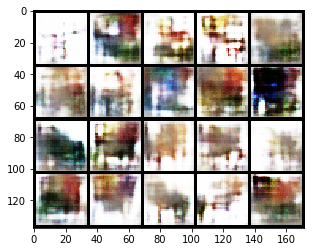

Epoch 120: Train D loss: -0.6994, G loss: 0.3820
Epoch 121: Train D loss: -0.7460, G loss: 0.4270
Epoch 122: Train D loss: -0.7819, G loss: 0.4602
Epoch 123: Train D loss: -0.7243, G loss: 0.3500
Epoch 124: Train D loss: -0.7066, G loss: 0.3018
Epoch 125: Train D loss: -0.7575, G loss: 0.3956
Epoch 126: Train D loss: -0.7080, G loss: 0.3611
Epoch 127: Train D loss: -0.7643, G loss: 0.4307
Epoch 128: Train D loss: -0.7642, G loss: 0.4737
Epoch 129: Train D loss: -0.7184, G loss: 0.4288


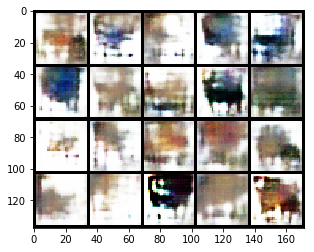

Epoch 130: Train D loss: -0.6686, G loss: 0.2361
Epoch 131: Train D loss: -0.6920, G loss: 0.3274
Epoch 132: Train D loss: -0.8266, G loss: 0.4597
Epoch 133: Train D loss: -0.7510, G loss: 0.4198
Epoch 134: Train D loss: -0.6568, G loss: 0.3637
Epoch 135: Train D loss: -0.7320, G loss: 0.4184
Epoch 136: Train D loss: -0.7620, G loss: 0.3929
Epoch 137: Train D loss: -0.7258, G loss: 0.3522
Epoch 138: Train D loss: -0.7228, G loss: 0.3624
Epoch 139: Train D loss: -0.7295, G loss: 0.4202


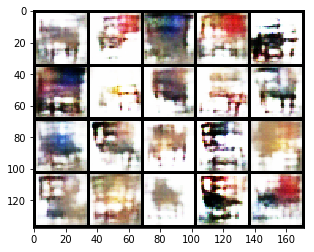

Epoch 140: Train D loss: -0.7711, G loss: 0.4037
Epoch 141: Train D loss: -0.7100, G loss: 0.4108
Epoch 142: Train D loss: -0.7466, G loss: 0.4812
Epoch 143: Train D loss: -0.7234, G loss: 0.4224
Epoch 144: Train D loss: -0.7090, G loss: 0.3851
Epoch 145: Train D loss: -0.7184, G loss: 0.4564
Epoch 146: Train D loss: -0.7850, G loss: 0.4636
Epoch 147: Train D loss: -0.7428, G loss: 0.4346
Epoch 148: Train D loss: -0.6865, G loss: 0.3724
Epoch 149: Train D loss: -0.7772, G loss: 0.4509


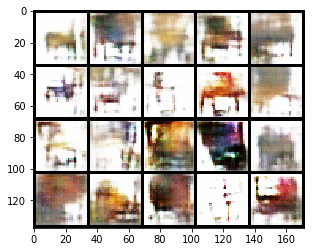

Epoch 150: Train D loss: -0.6789, G loss: 0.3835
Epoch 151: Train D loss: -0.7142, G loss: 0.4604
Epoch 152: Train D loss: -0.6781, G loss: 0.3393
Epoch 153: Train D loss: -0.7194, G loss: 0.4054
Epoch 154: Train D loss: -0.7602, G loss: 0.4584
Epoch 155: Train D loss: -0.7612, G loss: 0.3712
Epoch 156: Train D loss: -0.6513, G loss: 0.3774
Epoch 157: Train D loss: -0.7384, G loss: 0.3805
Epoch 158: Train D loss: -0.7717, G loss: 0.4312
Epoch 159: Train D loss: -0.7190, G loss: 0.4283


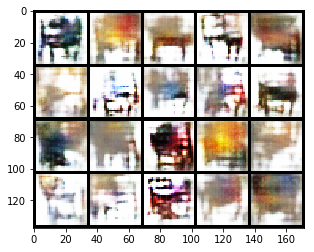

Epoch 160: Train D loss: -0.6340, G loss: 0.2235
Epoch 161: Train D loss: -0.8110, G loss: 0.4289
Epoch 162: Train D loss: -0.7255, G loss: 0.4410
Epoch 163: Train D loss: -0.7219, G loss: 0.3727
Epoch 164: Train D loss: -0.6789, G loss: 0.3642
Epoch 165: Train D loss: -0.7013, G loss: 0.4027
Epoch 166: Train D loss: -0.7406, G loss: 0.3974
Epoch 167: Train D loss: -0.6936, G loss: 0.3811
Epoch 168: Train D loss: -0.7280, G loss: 0.4031
Epoch 169: Train D loss: -0.7099, G loss: 0.3624


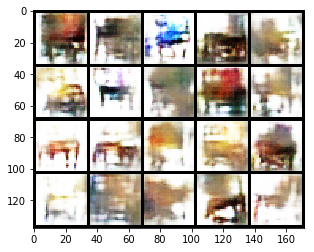

Epoch 170: Train D loss: -0.6867, G loss: 0.3441
Epoch 171: Train D loss: -0.6985, G loss: 0.3886
Epoch 172: Train D loss: -0.6792, G loss: 0.3262
Epoch 173: Train D loss: -0.6718, G loss: 0.2588
Epoch 174: Train D loss: -0.6559, G loss: 0.3010
Epoch 175: Train D loss: -0.7662, G loss: 0.4218
Epoch 176: Train D loss: -0.6888, G loss: 0.3738
Epoch 177: Train D loss: -0.6830, G loss: 0.4521
Epoch 178: Train D loss: -0.7056, G loss: 0.4367
Epoch 179: Train D loss: -0.6725, G loss: 0.3426


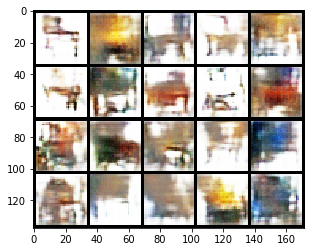

Epoch 180: Train D loss: -0.6647, G loss: 0.3806
Epoch 181: Train D loss: -0.7022, G loss: 0.4297
Epoch 182: Train D loss: -0.6900, G loss: 0.3378
Epoch 183: Train D loss: -0.6850, G loss: 0.3360
Epoch 184: Train D loss: -0.7213, G loss: 0.4244
Epoch 185: Train D loss: -0.6772, G loss: 0.4178
Epoch 186: Train D loss: -0.6756, G loss: 0.3640
Epoch 187: Train D loss: -0.6910, G loss: 0.4079
Epoch 188: Train D loss: -0.6936, G loss: 0.3014
Epoch 189: Train D loss: -0.7230, G loss: 0.4529


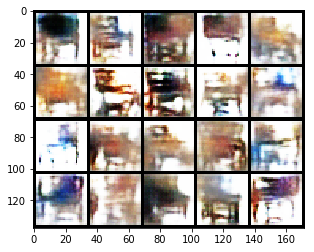

Epoch 190: Train D loss: -0.6933, G loss: 0.4087
Epoch 191: Train D loss: -0.7138, G loss: 0.3695
Epoch 192: Train D loss: -0.6450, G loss: 0.3993
Epoch 193: Train D loss: -0.7288, G loss: 0.4580
Epoch 194: Train D loss: -0.6960, G loss: 0.4456
Epoch 195: Train D loss: -0.5740, G loss: 0.2165
Epoch 196: Train D loss: -0.6832, G loss: 0.2779
Epoch 197: Train D loss: -0.6665, G loss: 0.3173
Epoch 198: Train D loss: -0.6512, G loss: 0.2941
Epoch 199: Train D loss: -0.6476, G loss: 0.2369


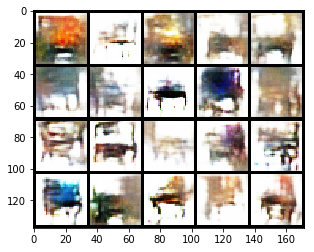

Epoch 200: Train D loss: -0.6558, G loss: 0.4203
Epoch 201: Train D loss: -0.6877, G loss: 0.3266
Epoch 202: Train D loss: -0.6434, G loss: 0.3604
Epoch 203: Train D loss: -0.6881, G loss: 0.3708
Epoch 204: Train D loss: -0.6633, G loss: 0.4143
Epoch 205: Train D loss: -0.6374, G loss: 0.3548
Epoch 206: Train D loss: -0.6913, G loss: 0.4351
Epoch 207: Train D loss: -0.6425, G loss: 0.3085
Epoch 208: Train D loss: -0.6510, G loss: 0.3613
Epoch 209: Train D loss: -0.6678, G loss: 0.3909


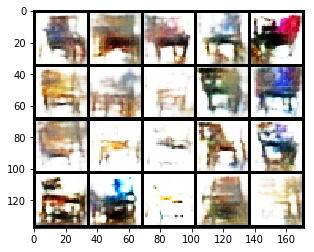

Epoch 210: Train D loss: -0.6982, G loss: 0.4190
Epoch 211: Train D loss: -0.6327, G loss: 0.4139
Epoch 212: Train D loss: -0.6186, G loss: 0.3190
Epoch 213: Train D loss: -0.6898, G loss: 0.3695
Epoch 214: Train D loss: -0.6386, G loss: 0.4091
Epoch 215: Train D loss: -0.6353, G loss: 0.3149
Epoch 216: Train D loss: -0.6345, G loss: 0.3870
Epoch 217: Train D loss: -0.6392, G loss: 0.3456
Epoch 218: Train D loss: -0.7246, G loss: 0.4135
Epoch 219: Train D loss: -0.6121, G loss: 0.3769


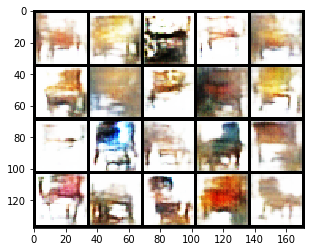

Epoch 220: Train D loss: -0.6402, G loss: 0.3717
Epoch 221: Train D loss: -0.6364, G loss: 0.3518
Epoch 222: Train D loss: -0.6426, G loss: 0.3842
Epoch 223: Train D loss: -0.6599, G loss: 0.3581
Epoch 224: Train D loss: -0.6210, G loss: 0.3643
Epoch 225: Train D loss: -0.6161, G loss: 0.3171
Epoch 226: Train D loss: -0.6593, G loss: 0.2920
Epoch 227: Train D loss: -0.6323, G loss: 0.3934
Epoch 228: Train D loss: -0.7045, G loss: 0.4078
Epoch 229: Train D loss: -0.5930, G loss: 0.2289


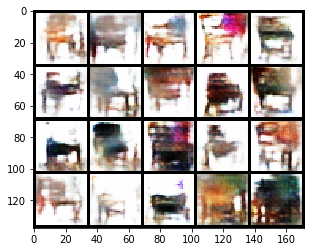

Epoch 230: Train D loss: -0.6609, G loss: 0.4193
Epoch 231: Train D loss: -0.6403, G loss: 0.3939
Epoch 232: Train D loss: -0.6066, G loss: 0.3349
Epoch 233: Train D loss: -0.6292, G loss: 0.3902
Epoch 234: Train D loss: -0.6648, G loss: 0.3836
Epoch 235: Train D loss: -0.6595, G loss: 0.3969
Epoch 236: Train D loss: -0.5916, G loss: 0.2610
Epoch 237: Train D loss: -0.6711, G loss: 0.3999
Epoch 238: Train D loss: -0.6466, G loss: 0.3540
Epoch 239: Train D loss: -0.6647, G loss: 0.4082


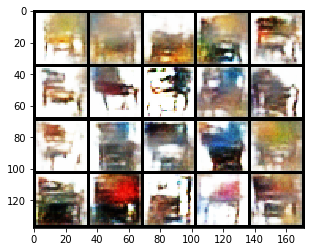

Epoch 240: Train D loss: -0.5827, G loss: 0.3304
Epoch 241: Train D loss: -0.6259, G loss: 0.3001
Epoch 242: Train D loss: -0.6357, G loss: 0.4037
Epoch 243: Train D loss: -0.6247, G loss: 0.4034
Epoch 244: Train D loss: -0.5960, G loss: 0.2730
Epoch 245: Train D loss: -0.6366, G loss: 0.3310
Epoch 246: Train D loss: -0.5907, G loss: 0.1832
Epoch 247: Train D loss: -0.6455, G loss: 0.3944
Epoch 248: Train D loss: -0.6289, G loss: 0.4075
Epoch 249: Train D loss: -0.6336, G loss: 0.3877


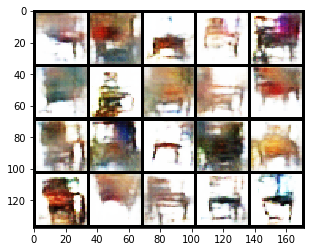

Epoch 250: Train D loss: -0.5828, G loss: 0.3153
Epoch 251: Train D loss: -0.6747, G loss: 0.4123
Epoch 252: Train D loss: -0.6541, G loss: 0.4327
Epoch 253: Train D loss: -0.5250, G loss: 0.2064
Epoch 254: Train D loss: -0.6371, G loss: 0.3829
Epoch 255: Train D loss: -0.6513, G loss: 0.3213
Epoch 256: Train D loss: -0.5493, G loss: 0.2441
Epoch 257: Train D loss: -0.6414, G loss: 0.2281
Epoch 258: Train D loss: -0.5555, G loss: 0.2432
Epoch 259: Train D loss: -0.6362, G loss: 0.4477


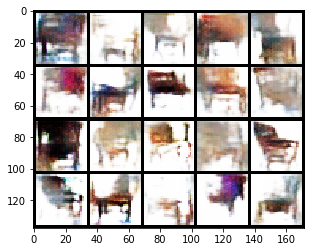

Epoch 260: Train D loss: -0.6553, G loss: 0.4143
Epoch 261: Train D loss: -0.5780, G loss: 0.2803
Epoch 262: Train D loss: -0.5274, G loss: 0.2315
Epoch 263: Train D loss: -0.6410, G loss: 0.2865
Epoch 264: Train D loss: -0.6295, G loss: 0.3752
Epoch 265: Train D loss: -0.5302, G loss: 0.1810
Epoch 266: Train D loss: -0.6513, G loss: 0.2973
Epoch 267: Train D loss: -0.6082, G loss: 0.4221
Epoch 268: Train D loss: -0.6024, G loss: 0.3377
Epoch 269: Train D loss: -0.5829, G loss: 0.2626


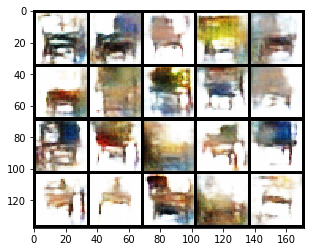

Epoch 270: Train D loss: -0.5874, G loss: 0.3516
Epoch 271: Train D loss: -0.5909, G loss: 0.3828
Epoch 272: Train D loss: -0.5952, G loss: 0.3352
Epoch 273: Train D loss: -0.5780, G loss: 0.2756
Epoch 274: Train D loss: -0.5863, G loss: 0.3674
Epoch 275: Train D loss: -0.5990, G loss: 0.3369
Epoch 276: Train D loss: -0.5827, G loss: 0.3419
Epoch 277: Train D loss: -0.5813, G loss: 0.3347
Epoch 278: Train D loss: -0.6113, G loss: 0.3903
Epoch 279: Train D loss: -0.6064, G loss: 0.3357


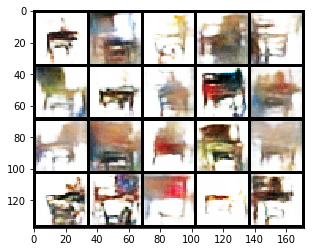

Epoch 280: Train D loss: -0.5513, G loss: 0.3445
Epoch 281: Train D loss: -0.5994, G loss: 0.3700
Epoch 282: Train D loss: -0.5788, G loss: 0.3408
Epoch 283: Train D loss: -0.5882, G loss: 0.3081
Epoch 284: Train D loss: -0.5541, G loss: 0.2998
Epoch 285: Train D loss: -0.5804, G loss: 0.3896
Epoch 286: Train D loss: -0.5639, G loss: 0.2768
Epoch 287: Train D loss: -0.5627, G loss: 0.2421
Epoch 288: Train D loss: -0.6003, G loss: 0.3404
Epoch 289: Train D loss: -0.5683, G loss: 0.2669


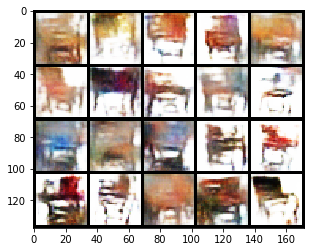

Epoch 290: Train D loss: -0.5728, G loss: 0.3627
Epoch 291: Train D loss: -0.5947, G loss: 0.3286
Epoch 292: Train D loss: -0.5407, G loss: 0.2651
Epoch 293: Train D loss: -0.5439, G loss: 0.3060
Epoch 294: Train D loss: -0.5975, G loss: 0.2686
Epoch 295: Train D loss: -0.5415, G loss: 0.3555
Epoch 296: Train D loss: -0.6058, G loss: 0.3715
Epoch 297: Train D loss: -0.5360, G loss: 0.2515
Epoch 298: Train D loss: -0.5860, G loss: 0.4158
Epoch 299: Train D loss: -0.5708, G loss: 0.2733


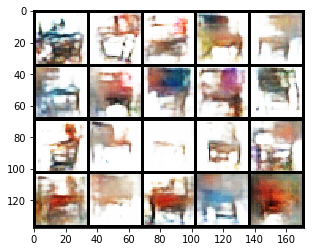

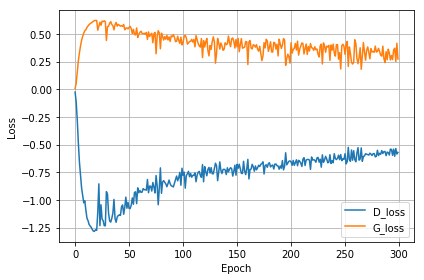

In [45]:
n_d = 5

# G and D model, use DCGAN, note that sigmoid is removed in D
G = DCGenerator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = DCDiscriminator(image_size=image_size, input_channel=image_channel, sigmoid=False).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

d_loss_hist, g_loss_hist = run_wgan(trainloader, G, D, G_optimizer, D_optimizer, n_epochs, device, 
                                    latent_dim, n_d, weight_clip)

loss_plot(d_loss_hist, g_loss_hist)

## WGAN-GP(improved wgan)

在WGAN中，需要进行截断, 在实验中发现： 对于比较深的WAGN，它不容易收敛。

大致原因如下：
1. 实验发现最后大多数的权重都在-c 和c上,这就意味了大部分权重只有两个可能数,这太简单了,作为一个深度神经网络来说,这实在是对它强大的拟合能力的浪费.
2. 实验发现容易导致梯度消失或梯度爆炸。判别器是一个多层网络，如果把clip的值设得稍微小了一点,每经过一层网络,梯度就变小一点点,多层之后就会指数衰减；反之,则容易导致梯度爆炸.

所以WGAN-GP使用了Gradient penalty(梯度惩罚）来代替clip.
因为Lipschitz限制是要求判别器的梯度不超过K,所以可以直接使用一个loss term来实现这一点,所以改进后D的优化目标改进为如下:
![wgan_gp](pictures/wgan-gp.svg)

下面是WGAN-GP的具体代码实现,同WGAN,我们也只实现了他的训练代码,而模型我们直接使用DCGAN的模型.

In [46]:
import torch.autograd as autograd

def wgan_gp_train(trainloader, G, D, G_optimizer, D_optimizer, device, z_dim, lambda_=10, n_d=2):
    
    D.train()
    G.train()
    
    D_total_loss = 0
    G_total_loss = 0
    
    
    for i, (x, _) in enumerate(trainloader):
        x = x.to(device)

        # update D network
        # D optimizer zero grads
        D_optimizer.zero_grad()
        
        # D real loss from real images
        d_real = D(x)
        d_real_loss = - d_real.mean()
        
        # D fake loss from fake images generated by G
        z = torch.rand(x.size(0), z_dim).to(device)
        g_z = G(z)
        d_fake = D(g_z)
        d_fake_loss = d_fake.mean()
        
        # D gradient penalty
        
        #   a random number epsilon
        epsilon = torch.rand(x.size(0), 1, 1, 1).cuda()
        x_hat = epsilon * x + (1 - epsilon) * g_z
        x_hat.requires_grad_(True)

        y_hat = D(x_hat)
        #   computes the sum of gradients of y_hat with regard to x_hat
        gradients = autograd.grad(outputs=y_hat, inputs=x_hat, grad_outputs=torch.ones(y_hat.size()).cuda(),
                                  create_graph=True, retain_graph=True, only_inputs=True)[0]
        #   computes gradientpenalty
        gradient_penalty =  torch.mean((gradients.view(gradients.size()[0], -1).norm(p=2, dim=1) - 1) ** 2)
        
        # D backward and step
        d_loss = d_real_loss + d_fake_loss + lambda_ * gradient_penalty
        d_loss.backward()
        D_optimizer.step()
        
            
        D_total_loss += d_loss.item()

        # update G network
        # G optimizer zero grads
        if (i + 1) % n_d == 0:
            G_optimizer.zero_grad()

            # G loss
            g_z = G(z)
            d_fake = D(g_z)
            g_loss = - d_fake.mean()

            # G backward and step
            g_loss.backward()
            G_optimizer.step()
            
            G_total_loss += g_loss.item()
    
    return D_total_loss / len(trainloader), G_total_loss * n_d / len(trainloader)

Epoch 0: Train D loss: 1.3392, G loss: 2.4294


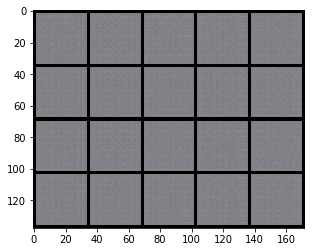

Epoch 1: Train D loss: -6.7267, G loss: 6.7468
Epoch 2: Train D loss: -12.7695, G loss: 16.0039
Epoch 3: Train D loss: -18.8644, G loss: 20.9998
Epoch 4: Train D loss: -23.5614, G loss: 22.9787
Epoch 5: Train D loss: -20.4933, G loss: 21.4059
Epoch 6: Train D loss: -15.2003, G loss: 19.2417
Epoch 7: Train D loss: -14.1706, G loss: 17.4391
Epoch 8: Train D loss: -14.3240, G loss: 18.1987
Epoch 9: Train D loss: -13.5039, G loss: 18.2915


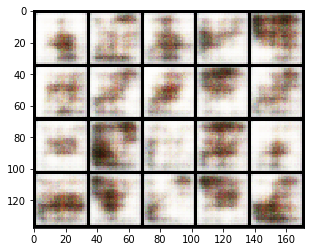

Epoch 10: Train D loss: -12.8081, G loss: 19.0176
Epoch 11: Train D loss: -12.8734, G loss: 19.2649
Epoch 12: Train D loss: -11.8784, G loss: 18.6079
Epoch 13: Train D loss: -12.5174, G loss: 19.7621
Epoch 14: Train D loss: -12.4275, G loss: 19.5134
Epoch 15: Train D loss: -12.6112, G loss: 19.7969
Epoch 16: Train D loss: -12.3792, G loss: 20.4453
Epoch 17: Train D loss: -12.2604, G loss: 19.4990
Epoch 18: Train D loss: -11.2717, G loss: 19.5436
Epoch 19: Train D loss: -11.3075, G loss: 19.5222


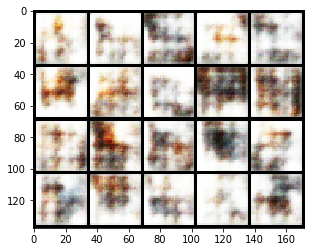

Epoch 20: Train D loss: -11.2554, G loss: 19.9713
Epoch 21: Train D loss: -11.1071, G loss: 20.9519
Epoch 22: Train D loss: -10.7088, G loss: 20.6865
Epoch 23: Train D loss: -10.5438, G loss: 20.4049
Epoch 24: Train D loss: -10.8817, G loss: 21.8243
Epoch 25: Train D loss: -9.5989, G loss: 21.4432
Epoch 26: Train D loss: -11.7179, G loss: 22.4800
Epoch 27: Train D loss: -11.2241, G loss: 24.3924
Epoch 28: Train D loss: -10.5217, G loss: 23.7910
Epoch 29: Train D loss: -9.0001, G loss: 23.5394


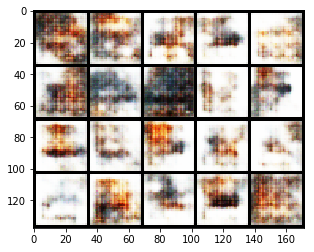

Epoch 30: Train D loss: -10.4584, G loss: 24.1902
Epoch 31: Train D loss: -4.7657, G loss: 26.0643
Epoch 32: Train D loss: -8.4286, G loss: 26.5471
Epoch 33: Train D loss: -9.5424, G loss: 26.3634
Epoch 34: Train D loss: -11.2694, G loss: 26.3449
Epoch 35: Train D loss: -11.0246, G loss: 25.3525
Epoch 36: Train D loss: -3.3933, G loss: 25.1158
Epoch 37: Train D loss: -6.9828, G loss: 25.0767
Epoch 38: Train D loss: -8.3552, G loss: 26.0598
Epoch 39: Train D loss: -8.9512, G loss: 25.6304


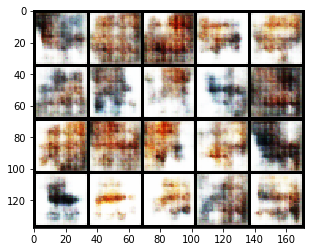

Epoch 40: Train D loss: -9.8376, G loss: 25.1272
Epoch 41: Train D loss: -8.8054, G loss: 25.0705
Epoch 42: Train D loss: -8.5037, G loss: 25.2450
Epoch 43: Train D loss: -8.1670, G loss: 24.1950
Epoch 44: Train D loss: -8.7771, G loss: 26.3128
Epoch 45: Train D loss: -7.9633, G loss: 25.5607
Epoch 46: Train D loss: -7.3105, G loss: 24.8007
Epoch 47: Train D loss: -7.0812, G loss: 27.6948
Epoch 48: Train D loss: -6.8467, G loss: 23.3029
Epoch 49: Train D loss: -6.1787, G loss: 27.0253


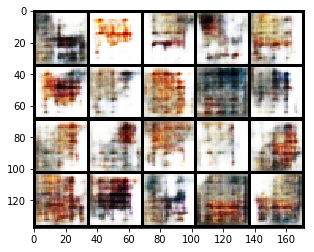

Epoch 50: Train D loss: -6.1178, G loss: 24.2959
Epoch 51: Train D loss: -6.2802, G loss: 25.7820
Epoch 52: Train D loss: -5.9062, G loss: 25.3141
Epoch 53: Train D loss: -5.8039, G loss: 25.1727
Epoch 54: Train D loss: -5.6386, G loss: 25.4114
Epoch 55: Train D loss: -5.0428, G loss: 22.2213
Epoch 56: Train D loss: -5.6301, G loss: 24.1230
Epoch 57: Train D loss: -6.0907, G loss: 25.5433
Epoch 58: Train D loss: -6.0080, G loss: 22.0319
Epoch 59: Train D loss: -5.1635, G loss: 25.6806


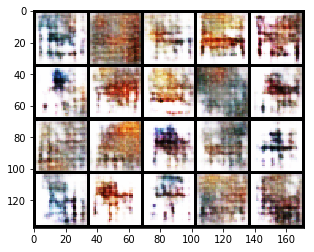

Epoch 60: Train D loss: -6.1866, G loss: 24.0993
Epoch 61: Train D loss: -1.6987, G loss: 23.5551
Epoch 62: Train D loss: -3.6546, G loss: 23.1145
Epoch 63: Train D loss: -6.0843, G loss: 25.8148
Epoch 64: Train D loss: -5.6267, G loss: 25.6904
Epoch 65: Train D loss: -5.6640, G loss: 24.9770
Epoch 66: Train D loss: -5.1452, G loss: 25.7459
Epoch 67: Train D loss: -4.8102, G loss: 24.3885
Epoch 68: Train D loss: -5.4201, G loss: 27.3986
Epoch 69: Train D loss: -6.0785, G loss: 24.6435


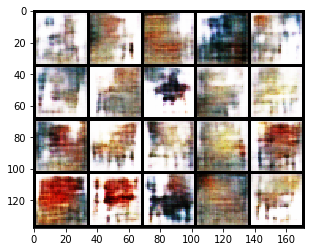

Epoch 70: Train D loss: -5.0400, G loss: 27.3763
Epoch 71: Train D loss: -3.9182, G loss: 25.3880
Epoch 72: Train D loss: -5.0201, G loss: 25.3676
Epoch 73: Train D loss: -5.5575, G loss: 27.4903
Epoch 74: Train D loss: -5.3104, G loss: 26.1468
Epoch 75: Train D loss: -5.6202, G loss: 26.9728
Epoch 76: Train D loss: -5.0739, G loss: 24.9611
Epoch 77: Train D loss: -3.8050, G loss: 23.6163
Epoch 78: Train D loss: -4.5593, G loss: 25.6762
Epoch 79: Train D loss: -5.9895, G loss: 25.1617


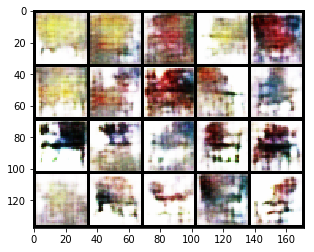

Epoch 80: Train D loss: -5.6132, G loss: 26.6686
Epoch 81: Train D loss: -5.5491, G loss: 26.5886
Epoch 82: Train D loss: -5.1411, G loss: 26.5357
Epoch 83: Train D loss: -5.5678, G loss: 25.6906
Epoch 84: Train D loss: -5.4873, G loss: 27.1740
Epoch 85: Train D loss: -4.7635, G loss: 26.6014
Epoch 86: Train D loss: -4.4138, G loss: 27.5068
Epoch 87: Train D loss: -6.0604, G loss: 27.4319
Epoch 88: Train D loss: -3.6361, G loss: 24.1504
Epoch 89: Train D loss: -5.7955, G loss: 26.9545


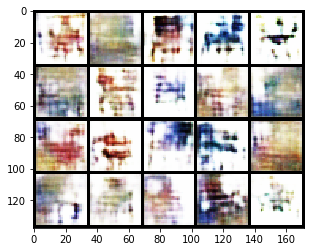

Epoch 90: Train D loss: -5.3975, G loss: 27.8186
Epoch 91: Train D loss: -6.1908, G loss: 28.7006
Epoch 92: Train D loss: -5.4617, G loss: 24.0013
Epoch 93: Train D loss: -5.9948, G loss: 28.8080
Epoch 94: Train D loss: -5.6383, G loss: 27.7994
Epoch 95: Train D loss: -5.1865, G loss: 28.5752
Epoch 96: Train D loss: -4.9103, G loss: 25.6877
Epoch 97: Train D loss: -5.2491, G loss: 30.4399
Epoch 98: Train D loss: -5.5875, G loss: 27.9379
Epoch 99: Train D loss: -5.4822, G loss: 29.2255


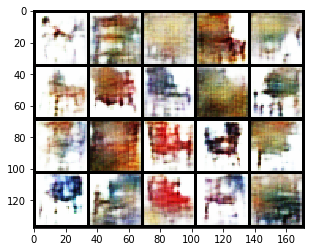

Epoch 100: Train D loss: -4.6983, G loss: 27.9868
Epoch 101: Train D loss: -5.9440, G loss: 29.2113
Epoch 102: Train D loss: -6.8271, G loss: 28.9340
Epoch 103: Train D loss: -5.8798, G loss: 30.1943
Epoch 104: Train D loss: -6.5384, G loss: 28.5753
Epoch 105: Train D loss: -5.6786, G loss: 31.2286
Epoch 106: Train D loss: -4.6651, G loss: 27.1232
Epoch 107: Train D loss: -5.8435, G loss: 29.5661
Epoch 108: Train D loss: -6.7021, G loss: 29.2722
Epoch 109: Train D loss: -5.7976, G loss: 29.0378


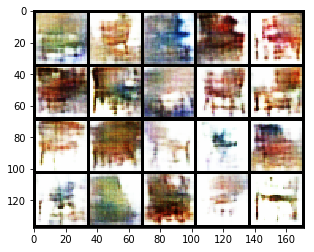

Epoch 110: Train D loss: -6.0576, G loss: 29.3705
Epoch 111: Train D loss: -6.2795, G loss: 29.4485
Epoch 112: Train D loss: -5.9627, G loss: 29.8873
Epoch 113: Train D loss: -4.9873, G loss: 28.0087
Epoch 114: Train D loss: -4.4742, G loss: 31.3191
Epoch 115: Train D loss: -5.5040, G loss: 30.2712
Epoch 116: Train D loss: -6.3214, G loss: 29.5600
Epoch 117: Train D loss: -6.0305, G loss: 31.3735
Epoch 118: Train D loss: -6.6613, G loss: 28.5459
Epoch 119: Train D loss: -6.0002, G loss: 31.1926


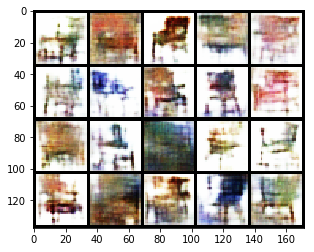

Epoch 120: Train D loss: -5.8614, G loss: 29.1898
Epoch 121: Train D loss: -6.0121, G loss: 32.6508
Epoch 122: Train D loss: -5.0474, G loss: 28.7671
Epoch 123: Train D loss: -5.5755, G loss: 30.4943
Epoch 124: Train D loss: -3.7520, G loss: 29.7765
Epoch 125: Train D loss: -1.9147, G loss: 30.2858
Epoch 126: Train D loss: -1.7312, G loss: 29.6169
Epoch 127: Train D loss: -3.0206, G loss: 27.8000
Epoch 128: Train D loss: -3.5915, G loss: 29.5681
Epoch 129: Train D loss: -3.7033, G loss: 31.9436


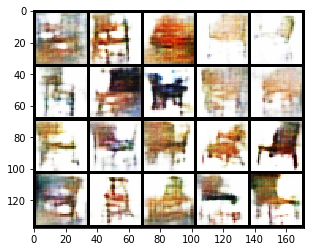

Epoch 130: Train D loss: -4.2950, G loss: 30.4218
Epoch 131: Train D loss: -4.8347, G loss: 31.8844
Epoch 132: Train D loss: -5.3579, G loss: 32.2499
Epoch 133: Train D loss: -5.3944, G loss: 33.4861
Epoch 134: Train D loss: -5.4628, G loss: 32.9834
Epoch 135: Train D loss: -5.5632, G loss: 34.3145
Epoch 136: Train D loss: -5.8240, G loss: 31.3880
Epoch 137: Train D loss: -5.9936, G loss: 33.7903
Epoch 138: Train D loss: -5.6570, G loss: 34.4875
Epoch 139: Train D loss: -5.5781, G loss: 33.4739


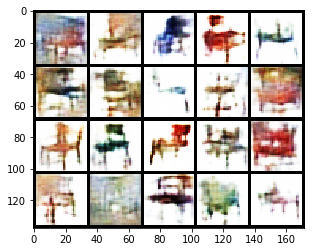

Epoch 140: Train D loss: -6.1410, G loss: 33.8322
Epoch 141: Train D loss: -5.8812, G loss: 33.8684
Epoch 142: Train D loss: -1.9205, G loss: 29.5850
Epoch 143: Train D loss: -1.7112, G loss: 29.9833
Epoch 144: Train D loss: -3.1166, G loss: 31.7703
Epoch 145: Train D loss: -4.1490, G loss: 32.3829
Epoch 146: Train D loss: -5.3011, G loss: 34.5454
Epoch 147: Train D loss: -5.4862, G loss: 34.0383
Epoch 148: Train D loss: -5.7843, G loss: 34.3498
Epoch 149: Train D loss: -5.7401, G loss: 36.4643


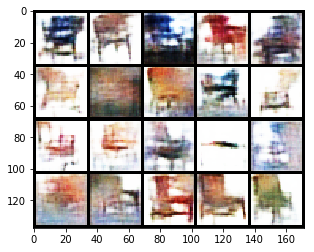

Epoch 150: Train D loss: -5.9239, G loss: 35.2163
Epoch 151: Train D loss: -6.0772, G loss: 33.9532
Epoch 152: Train D loss: -5.6734, G loss: 34.7442
Epoch 153: Train D loss: -6.2937, G loss: 34.2878
Epoch 154: Train D loss: -6.0751, G loss: 35.2071
Epoch 155: Train D loss: -5.7399, G loss: 35.1178
Epoch 156: Train D loss: -6.4185, G loss: 37.9375
Epoch 157: Train D loss: -6.0812, G loss: 35.3443
Epoch 158: Train D loss: -5.9157, G loss: 36.6812
Epoch 159: Train D loss: -6.5002, G loss: 33.6418


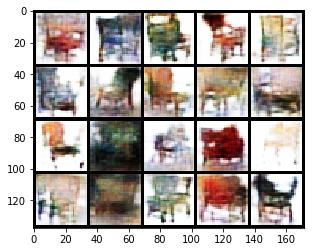

Epoch 160: Train D loss: -5.5397, G loss: 38.4824
Epoch 161: Train D loss: -6.9028, G loss: 37.0825
Epoch 162: Train D loss: -3.8554, G loss: 34.6202
Epoch 163: Train D loss: -1.0786, G loss: 31.2565
Epoch 164: Train D loss: -1.4328, G loss: 30.4401
Epoch 165: Train D loss: -2.2504, G loss: 35.8894
Epoch 166: Train D loss: -3.0943, G loss: 34.3076
Epoch 167: Train D loss: -3.3312, G loss: 34.8294
Epoch 168: Train D loss: -4.2110, G loss: 36.2202
Epoch 169: Train D loss: -4.4003, G loss: 34.7926


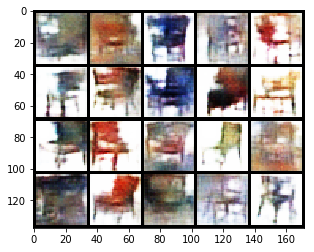

Epoch 170: Train D loss: -4.9188, G loss: 38.2910
Epoch 171: Train D loss: -5.0591, G loss: 36.2952
Epoch 172: Train D loss: -5.3631, G loss: 36.1868
Epoch 173: Train D loss: -5.4433, G loss: 38.6848
Epoch 174: Train D loss: -6.1260, G loss: 37.9585
Epoch 175: Train D loss: -5.1804, G loss: 33.8286
Epoch 176: Train D loss: -5.4706, G loss: 39.2369
Epoch 177: Train D loss: -5.8898, G loss: 37.6979
Epoch 178: Train D loss: -6.2262, G loss: 36.3471
Epoch 179: Train D loss: -5.6327, G loss: 39.3606


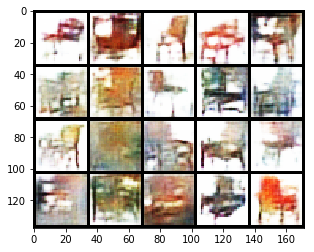

Epoch 180: Train D loss: -6.2124, G loss: 37.9693
Epoch 181: Train D loss: -6.5587, G loss: 35.5336
Epoch 182: Train D loss: -4.9087, G loss: 40.0750
Epoch 183: Train D loss: -6.0320, G loss: 37.1903
Epoch 184: Train D loss: -5.4911, G loss: 40.2221
Epoch 185: Train D loss: -6.6019, G loss: 39.2967
Epoch 186: Train D loss: -6.2988, G loss: 37.3004
Epoch 187: Train D loss: -6.5849, G loss: 39.2382
Epoch 188: Train D loss: -4.6294, G loss: 36.7941
Epoch 189: Train D loss: -5.3326, G loss: 37.7409


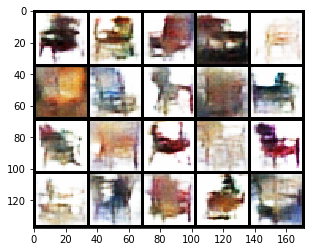

Epoch 190: Train D loss: -5.5866, G loss: 38.9254
Epoch 191: Train D loss: -6.2764, G loss: 38.8031
Epoch 192: Train D loss: -5.9774, G loss: 39.4805
Epoch 193: Train D loss: -6.2865, G loss: 37.8350
Epoch 194: Train D loss: -6.2510, G loss: 39.1876
Epoch 195: Train D loss: -6.2921, G loss: 40.0270
Epoch 196: Train D loss: -6.4187, G loss: 37.4174
Epoch 197: Train D loss: -5.6140, G loss: 39.7028
Epoch 198: Train D loss: -5.3549, G loss: 35.9537
Epoch 199: Train D loss: -5.0130, G loss: 39.9946


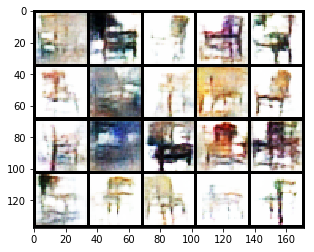

Epoch 200: Train D loss: -6.1941, G loss: 39.0385
Epoch 201: Train D loss: -5.4462, G loss: 38.3361
Epoch 202: Train D loss: -6.2685, G loss: 39.9217
Epoch 203: Train D loss: -6.1772, G loss: 38.9811
Epoch 204: Train D loss: -6.6900, G loss: 38.1583
Epoch 205: Train D loss: -5.7890, G loss: 39.9576
Epoch 206: Train D loss: -6.9732, G loss: 39.4142
Epoch 207: Train D loss: -6.8774, G loss: 38.2032
Epoch 208: Train D loss: -6.9691, G loss: 38.4888
Epoch 209: Train D loss: -5.4887, G loss: 40.0087


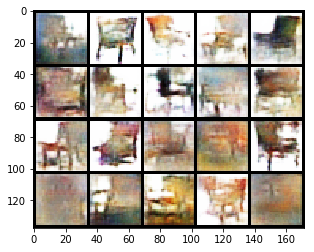

Epoch 210: Train D loss: -3.4314, G loss: 36.3491
Epoch 211: Train D loss: -3.6297, G loss: 33.2135
Epoch 212: Train D loss: -5.7992, G loss: 38.4705
Epoch 213: Train D loss: -5.9864, G loss: 39.4168
Epoch 214: Train D loss: -6.6219, G loss: 37.2215
Epoch 215: Train D loss: -5.9246, G loss: 39.9410
Epoch 216: Train D loss: -6.7258, G loss: 38.1955
Epoch 217: Train D loss: -7.1553, G loss: 39.4436
Epoch 218: Train D loss: -5.4899, G loss: 39.7453
Epoch 219: Train D loss: -5.0173, G loss: 37.1999


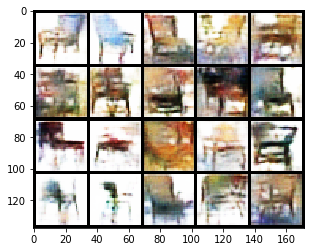

Epoch 220: Train D loss: -6.5760, G loss: 39.2827
Epoch 221: Train D loss: -5.4231, G loss: 38.0454
Epoch 222: Train D loss: -5.4849, G loss: 36.5054
Epoch 223: Train D loss: -5.1559, G loss: 39.8553
Epoch 224: Train D loss: -3.1036, G loss: 35.2306
Epoch 225: Train D loss: -0.7978, G loss: 34.5500
Epoch 226: Train D loss: -1.6129, G loss: 33.4748
Epoch 227: Train D loss: -2.3952, G loss: 34.1653
Epoch 228: Train D loss: -2.8634, G loss: 36.0716
Epoch 229: Train D loss: -3.3047, G loss: 36.7449


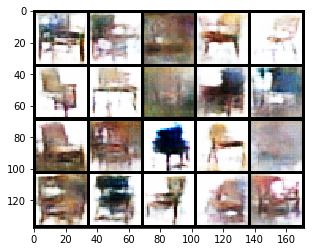

Epoch 230: Train D loss: -3.9319, G loss: 35.9147
Epoch 231: Train D loss: -4.4760, G loss: 37.9125
Epoch 232: Train D loss: -5.2812, G loss: 36.6141
Epoch 233: Train D loss: -5.0164, G loss: 40.0582
Epoch 234: Train D loss: -5.8340, G loss: 36.0020
Epoch 235: Train D loss: -5.2402, G loss: 41.4598
Epoch 236: Train D loss: -6.3261, G loss: 37.0255
Epoch 237: Train D loss: -5.4423, G loss: 40.6571
Epoch 238: Train D loss: -5.6315, G loss: 38.6640
Epoch 239: Train D loss: -6.6949, G loss: 39.9321


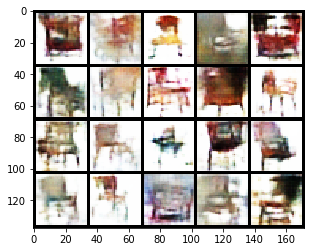

Epoch 240: Train D loss: -5.2678, G loss: 40.2830
Epoch 241: Train D loss: -5.8427, G loss: 40.6812
Epoch 242: Train D loss: -6.1209, G loss: 40.7402
Epoch 243: Train D loss: -5.9121, G loss: 39.3600
Epoch 244: Train D loss: -6.4650, G loss: 40.0058
Epoch 245: Train D loss: -6.3790, G loss: 41.8041
Epoch 246: Train D loss: -5.1154, G loss: 39.2260
Epoch 247: Train D loss: -7.0600, G loss: 39.6280
Epoch 248: Train D loss: -6.5115, G loss: 41.3782
Epoch 249: Train D loss: -6.0859, G loss: 42.7280


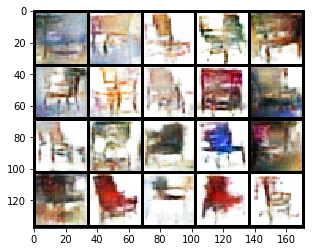

Epoch 250: Train D loss: -5.9049, G loss: 40.4513
Epoch 251: Train D loss: -6.7079, G loss: 41.4270
Epoch 252: Train D loss: -6.7215, G loss: 41.4045
Epoch 253: Train D loss: -6.9599, G loss: 41.8185
Epoch 254: Train D loss: -6.0854, G loss: 41.3557
Epoch 255: Train D loss: -7.6842, G loss: 43.6791
Epoch 256: Train D loss: -7.0122, G loss: 38.3298
Epoch 257: Train D loss: -5.4281, G loss: 43.3931
Epoch 258: Train D loss: -6.9576, G loss: 42.9826
Epoch 259: Train D loss: -7.7548, G loss: 40.7419


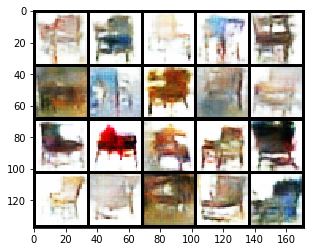

Epoch 260: Train D loss: -4.0137, G loss: 41.1191
Epoch 261: Train D loss: -6.3770, G loss: 43.4107
Epoch 262: Train D loss: -6.6046, G loss: 43.6145
Epoch 263: Train D loss: -3.7475, G loss: 38.7984
Epoch 264: Train D loss: -0.3144, G loss: 36.9979
Epoch 265: Train D loss: -0.6256, G loss: 34.0401
Epoch 266: Train D loss: -1.3101, G loss: 36.7130
Epoch 267: Train D loss: -1.6102, G loss: 37.0705
Epoch 268: Train D loss: -2.7125, G loss: 37.6598
Epoch 269: Train D loss: -2.8154, G loss: 36.2355


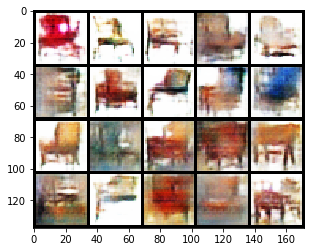

Epoch 270: Train D loss: -3.5027, G loss: 38.7265
Epoch 271: Train D loss: -4.2164, G loss: 38.4360
Epoch 272: Train D loss: -4.6927, G loss: 39.0280
Epoch 273: Train D loss: -4.6255, G loss: 38.6294
Epoch 274: Train D loss: -5.1461, G loss: 38.6156
Epoch 275: Train D loss: -5.1845, G loss: 40.5659
Epoch 276: Train D loss: -5.3668, G loss: 38.4398
Epoch 277: Train D loss: -5.5907, G loss: 40.0306
Epoch 278: Train D loss: -5.5337, G loss: 40.0839
Epoch 279: Train D loss: -5.7088, G loss: 39.5223


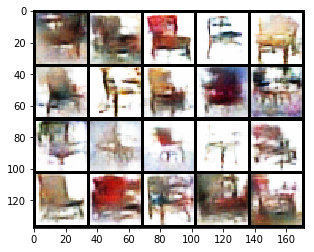

Epoch 280: Train D loss: -5.9908, G loss: 40.5828
Epoch 281: Train D loss: -5.8463, G loss: 41.5669
Epoch 282: Train D loss: -6.2540, G loss: 41.2911
Epoch 283: Train D loss: -5.9328, G loss: 40.5074
Epoch 284: Train D loss: -6.6695, G loss: 41.8529
Epoch 285: Train D loss: -6.3086, G loss: 44.4003
Epoch 286: Train D loss: -6.6647, G loss: 38.1775
Epoch 287: Train D loss: -5.9272, G loss: 43.6149
Epoch 288: Train D loss: -6.4076, G loss: 42.8945
Epoch 289: Train D loss: -6.3606, G loss: 41.4952


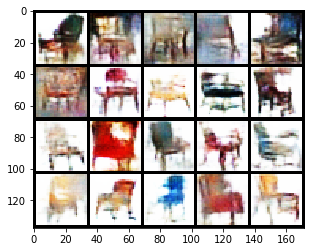

Epoch 290: Train D loss: -6.5376, G loss: 42.9187
Epoch 291: Train D loss: -6.6381, G loss: 43.3876
Epoch 292: Train D loss: -3.1171, G loss: 40.0377
Epoch 293: Train D loss: -0.3766, G loss: 38.0252
Epoch 294: Train D loss: -1.0927, G loss: 38.6621
Epoch 295: Train D loss: -1.6712, G loss: 37.6175
Epoch 296: Train D loss: -2.0515, G loss: 39.3309
Epoch 297: Train D loss: -2.5595, G loss: 39.8525
Epoch 298: Train D loss: -2.7613, G loss: 40.0591
Epoch 299: Train D loss: -3.3448, G loss: 40.5729


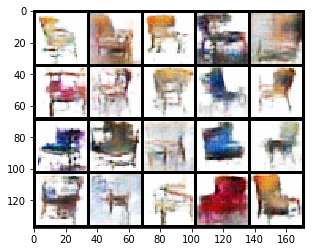

In [47]:
# hyper params

# z dim
latent_dim = 100

# image size and channel
image_size=32
image_channel=3

# Adam lr and betas
learning_rate = 0.0002
betas = (0.5, 0.999)

# epochs and batch size
n_epochs = 300
batch_size = 32

# device : cpu or cuda:0/1/2/3
device = torch.device('cuda:0')

# n_d: train D
n_d = 2
lambda_ = 10

# mnist dataset and dataloader
train_dataset = load_furniture_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# G and D model, use DCGAN, note that sigmoid is removed in D
G = DCGenerator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = DCDiscriminator(image_size=image_size, input_channel=image_channel, sigmoid=False).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

d_loss_hist = []
g_loss_hist = []

for epoch in range(n_epochs):
    d_loss, g_loss = wgan_gp_train(trainloader, G, D, G_optimizer, D_optimizer, device, 
                           z_dim=latent_dim, lambda_=lambda_, n_d=n_d)
    print('Epoch {}: Train D loss: {:.4f}, G loss: {:.4f}'.format(epoch, d_loss, g_loss))
    
    d_loss_hist.append(d_loss)
    g_loss_hist.append(g_loss)
    
    if epoch == 0 or (epoch + 1) % 10 == 0:
        visualize_results(G, device, latent_dim)

同理,观察loss曲线和D上的参数分布.

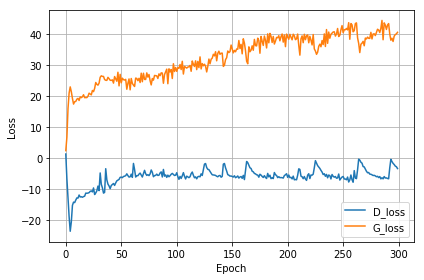

In [48]:
loss_plot(d_loss_hist, g_loss_hist)

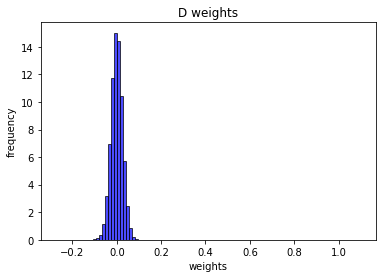

In [49]:
show_d_params(D)

#### **作业**: 
观察WGAN和WGAN-GP生成器生成的图片效果,它们在相同epoch时生成的图片效果(或者说生成图片达到效果所需要epoch数量),它们的loss曲线以及D的参数分布,说说有什么不同?

**答**:
- 在训练了同样的epoch后，WGAN-GP生成的图片要比WAGAN生成的图片要好。
- loss曲线：WGAN的生成器的loss整体处于下降的趋势，而WGAN-GP的生成器的loss整体处于不断上升的状态。对于判别器，WGAN的判别器loss的绝对值整体上也是处于下降状态，而WGAN-GP的判别器的loss的绝对值也处于下降状态，不过它收敛得很快。
- D的参数：WGAN的参数主要集中在weight clipping的最大值或者最小值上，使得参数没有充分发挥作用，而WGAN-GP的参数比较集中在0附近，并且近似以0对称。